In [619]:
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy import stats
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.cluster import hierarchy
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [749]:
def read_data():
    data = pd.read_table('./vertebral_column_data/column_3C.dat',header=None, sep=' ')
    data.columns = ['pelvic_incidence', 'pelvic_tilt', 'lumbar_lordosis_angle', 'sacral_slope', 'pelvic_radius',
                    'degree_spondylolisthesis', 'class']
    return data

def generate_data_info(data):
    features_set = data.columns[:6]
    label_name = data.columns[6]
    training_labels = data.iloc[:,6]
    overall_features_data = data.iloc[:, :6]
    return features_set, label_name, training_labels, overall_features_data

In [621]:
features_set, label_name, training_labels, overall_features_data = generate_data_info(read_data())

In [742]:
data=read_data()

In [743]:
X1 = data.iloc[:, :6]
y1 = data.iloc[:, 6]

scaler = StandardScaler()
X1_normalized = scaler.fit_transform(X1)

In [744]:
# 假设数据集中有7列数据，其中第7列是label
X_ = X1_normalized[:, :6]
y_ = y1

# 将数据集分成两部分，一部分只包含label那一列数据，另一部分包含其余列数据
y_2 = y1
X_2 = X1_normalized[:, :6]

# 对其余列数据进行PCA降维
pca = PCA(n_components=3)
X_pca_ = pca.fit_transform(X_2)

# 将label那一列数据和降维后的数据拼接起来
data_pca = np.column_stack((X_pca_, y_2))
print(data_pca[:,3])

['DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH'
 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH'
 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH'
 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH' 'DH'
 'DH' 'DH' 'DH' 'DH' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL' 'SL'
 'SL' 

/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


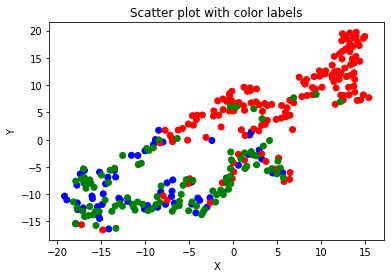

In [745]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 假设数据是一个三维数组，其中第一列是x值，第二列是y值，第三列是z值
data_pca1=data_pca
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
data_pca_ = tsne.fit_transform(data_pca[:,:2])
# data_pca = np.column_stack((data_pca_, d))
x = data_pca_[:, 0]
y = data_pca_[:, 1]
label2 = data_pca1[:,3]

colors = ['red', 'green', 'blue']
color_labels = list(set(label2))
color_map = dict(zip(color_labels, colors))
point_colors = [color_map[label] for label in label2]

# 绘制散点图，设置颜色
plt.scatter(x, y, c=point_colors)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Scatter plot with color labels')

plt.show()


In [718]:
X_3 = data_pca[:, :3]
y_3= data_pca[:, 3]

# 将数据集分成两部分，一部分只包含label那一列数据，另一部分包含其余列数据
y_4 = data_pca[:, 3]
X_4 = data_pca[:, :3]

# 对其余列数据进行异常值的判断和去除
mask = (X_4 - X_4.mean(axis=0)) / X_4.std(axis=0) < 3
X_cleaned = X_4[mask.all(axis=1)]

# 将label那一列数据和去除异常值后的数据拼接起来
data_cleaned = np.column_stack((X_cleaned, y_4[mask.all(axis=1)]))

TypeError: loop of ufunc does not support argument 0 of type float which has no callable sqrt method

In [787]:
X = overall_features_data
# print(X)

In [664]:
X_original=overall_features_data


In [788]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
z_scores = np.abs(stats.zscore(X_scaled))
X_new = X_scaled[(abs(z_scores) < 3).all(axis=1)]
normalized_data = (X_new - X_new.min()) / (X_new.max() - X_new.min())
arr=X_new
print(arr.shape)

(298, 6)


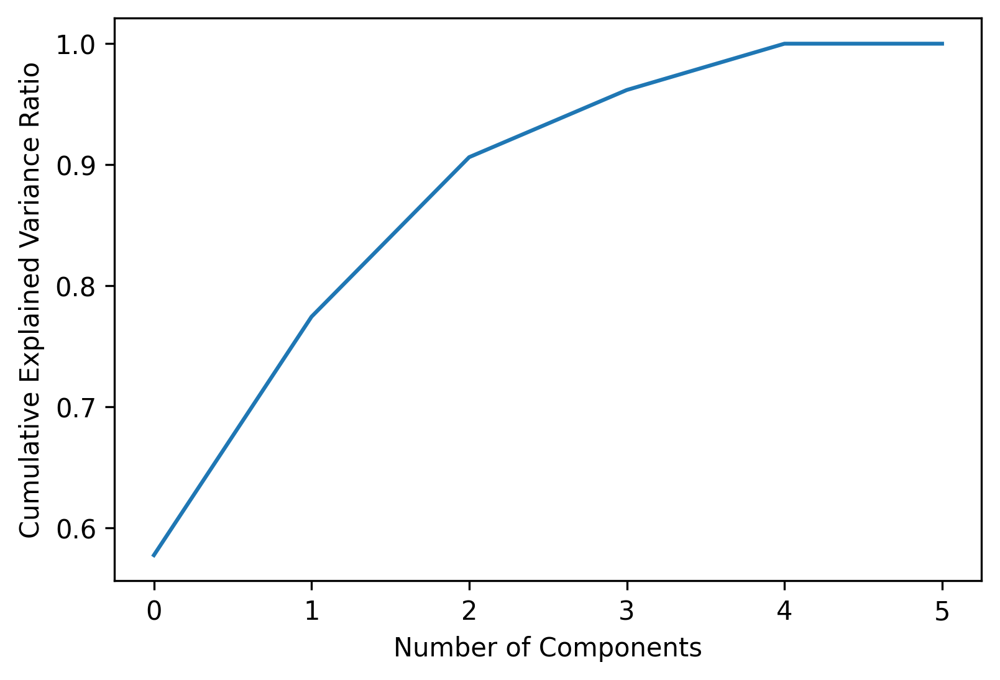

In [752]:
pca = PCA()

# 拟合数据并计算累积方差贡献率
pca.fit(X_new)
variance_ratio = pca.explained_variance_ratio_
cumulative_ratio = np.cumsum(variance_ratio)

# 绘制主成分方差和解释比例的累积曲线
plt.plot(cumulative_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
fig = plt.gcf()
# fig.set_size_inches(10, 4)
fig.set_dpi(300)
plt.show()


In [753]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_new)

# 输出PCA的主成分方差和解释比例
print('PCA explained variance ratio:', pca.explained_variance_ratio_)


PCA explained variance ratio: [0.57751384 0.19697469]


In [754]:
# distance_matrix = hierarchy.distance.pdist(normalized_data)
# distance_matrix = np.array(distance_matrix)
# distance_matrix.reshape(298,6)
# print(len(distance_matrix))
# X= X_new
X=X_pca

In [631]:
# X=distance_matrix
# X=X_new
# print(X_new)

In [773]:
Z_single = linkage(X, 'single')
# labels = pd.DataFrame(Z_single).iloc[:, :2].values
# print(labels)
# labels = fcluster(Z_single, t=3, criterion='distance')
# labels = pd.DataFrame(Z_single).iloc[:, :2].values
labels_single = fcluster(Z_single, 3, criterion='maxclust')
print(len(labels_single))
# print(labels)
# print(labels)
score1=silhouette_score(X,  labels_single)
print(score1)

298
0.08911708752395843


298
Cluster Size:2: Single linkage: Silhouette score=0.4038, Calinski-Harabasz score=5.2030, Davies-Bouldin score=0.3924


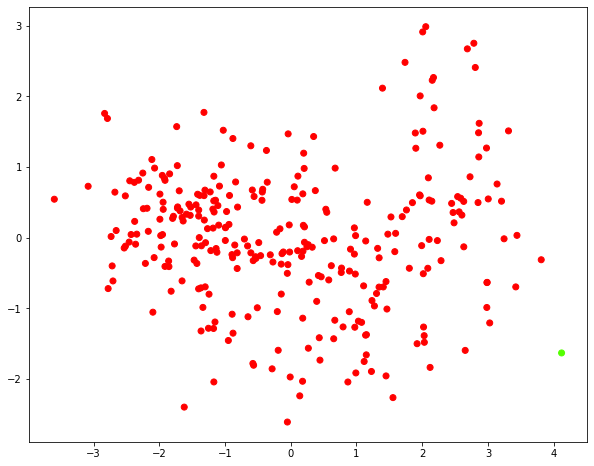

298
Cluster Size:3: Single linkage: Silhouette score=0.0891, Calinski-Harabasz score=5.5548, Davies-Bouldin score=0.4891


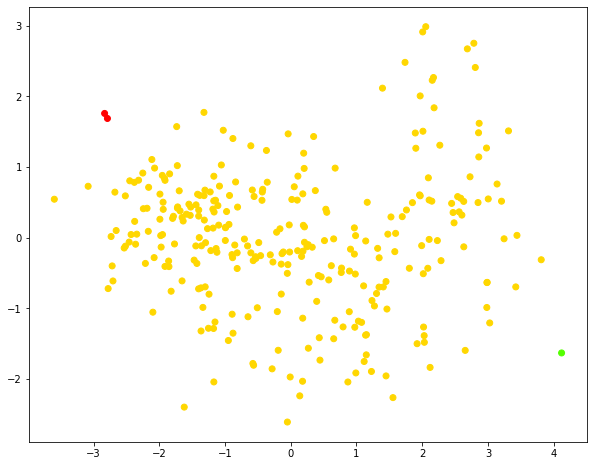

298
Cluster Size:4: Single linkage: Silhouette score=0.0400, Calinski-Harabasz score=7.9087, Davies-Bouldin score=0.4832


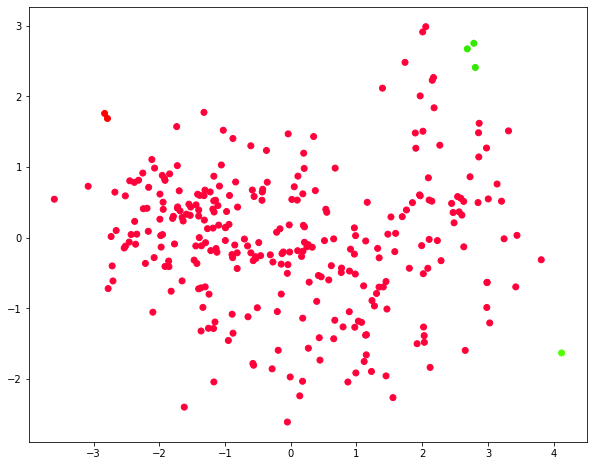

298
Cluster Size:5: Single linkage: Silhouette score=-0.0760, Calinski-Harabasz score=6.9301, Davies-Bouldin score=0.5867


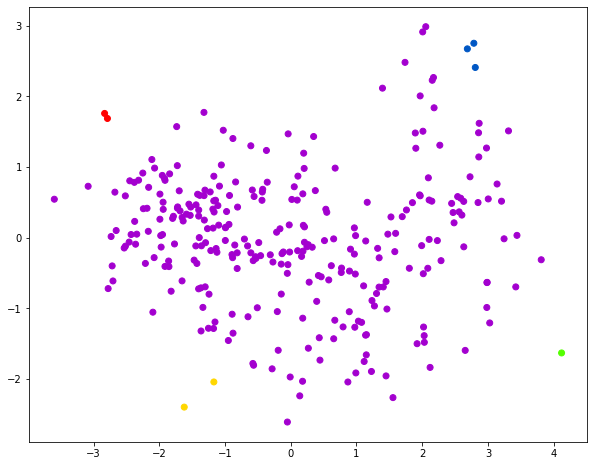

298
Cluster Size:6: Single linkage: Silhouette score=-0.1626, Calinski-Harabasz score=7.5643, Davies-Bouldin score=0.6052


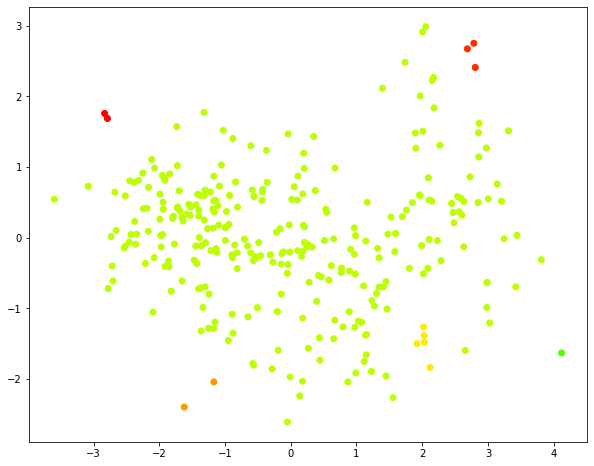

298
Cluster Size:7: Single linkage: Silhouette score=-0.1904, Calinski-Harabasz score=6.2909, Davies-Bouldin score=0.5924


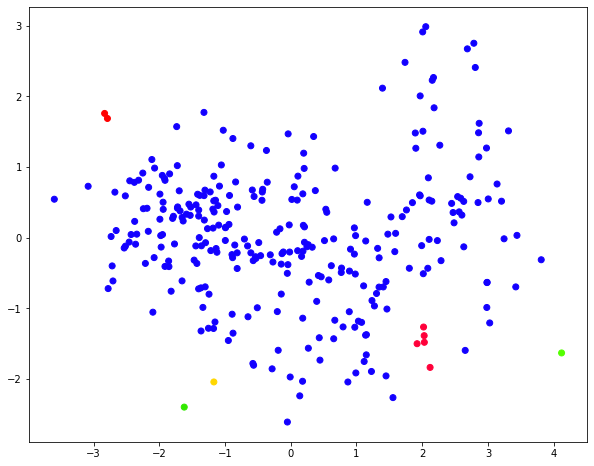

298
Cluster Size:8: Single linkage: Silhouette score=-0.1985, Calinski-Harabasz score=5.9804, Davies-Bouldin score=0.5755


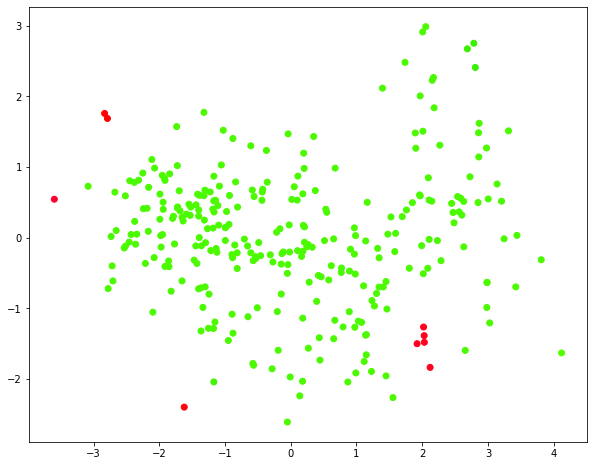

298
Cluster Size:9: Single linkage: Silhouette score=-0.1788, Calinski-Harabasz score=7.9858, Davies-Bouldin score=0.5683


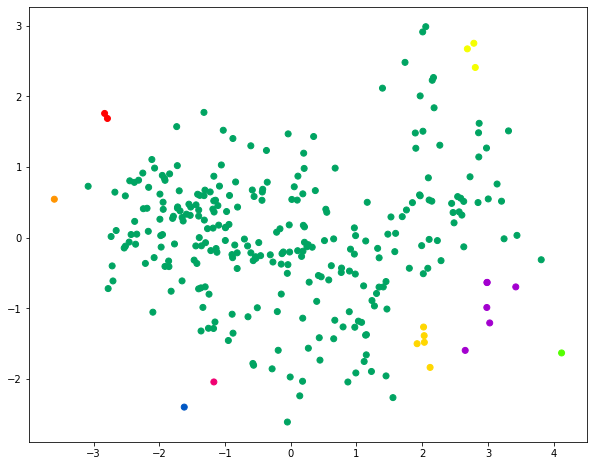

298
Cluster Size:10: Single linkage: Silhouette score=-0.1855, Calinski-Harabasz score=7.1006, Davies-Bouldin score=0.5597


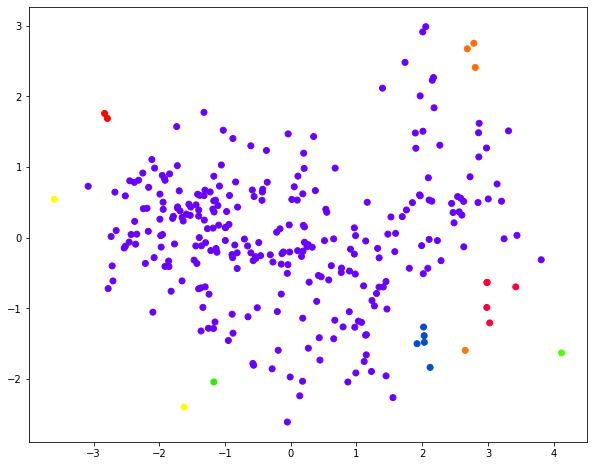

298
Cluster Size:11: Single linkage: Silhouette score=-0.1751, Calinski-Harabasz score=7.9138, Davies-Bouldin score=0.5652


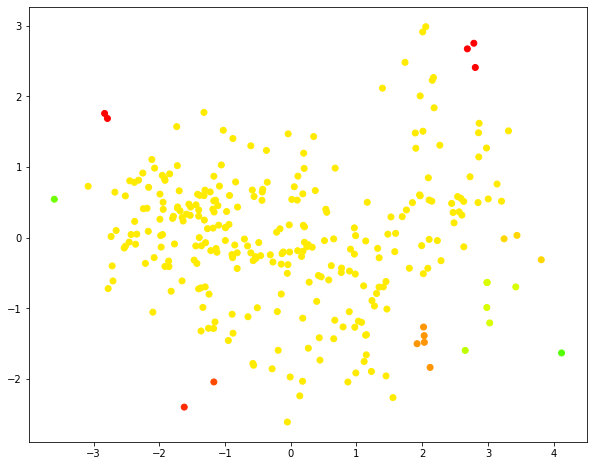

298
Cluster Size:12: Single linkage: Silhouette score=-0.1646, Calinski-Harabasz score=8.1907, Davies-Bouldin score=0.5529


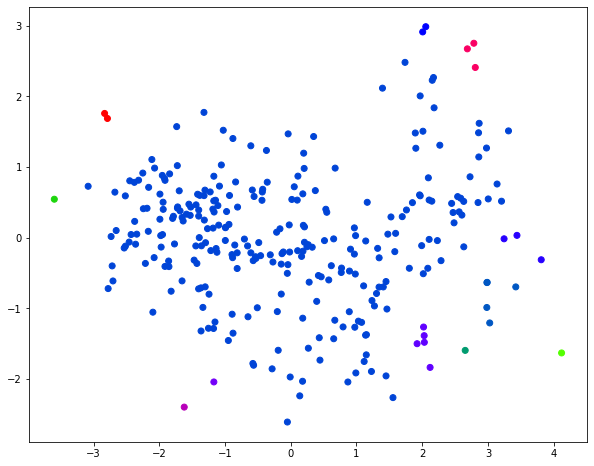

298
Cluster Size:13: Single linkage: Silhouette score=-0.1710, Calinski-Harabasz score=7.4896, Davies-Bouldin score=0.5241


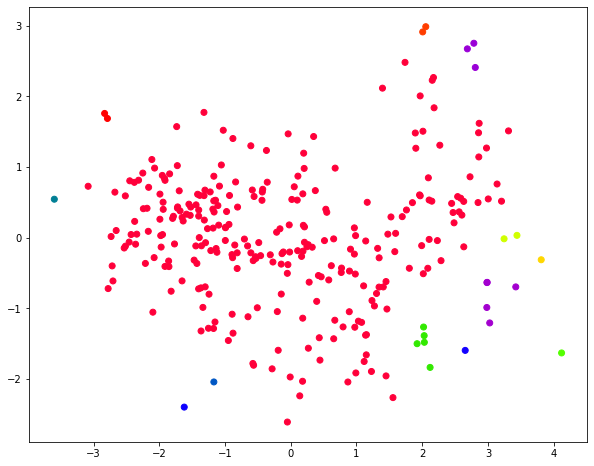

298
Cluster Size:14: Single linkage: Silhouette score=-0.1887, Calinski-Harabasz score=7.1195, Davies-Bouldin score=0.5291


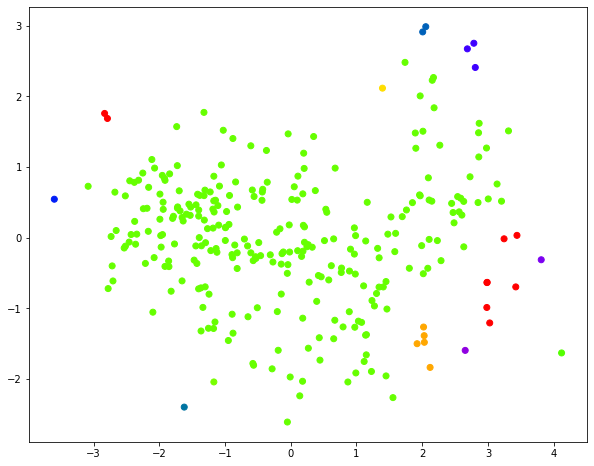

298
Cluster Size:15: Single linkage: Silhouette score=-0.1850, Calinski-Harabasz score=6.8972, Davies-Bouldin score=0.5258


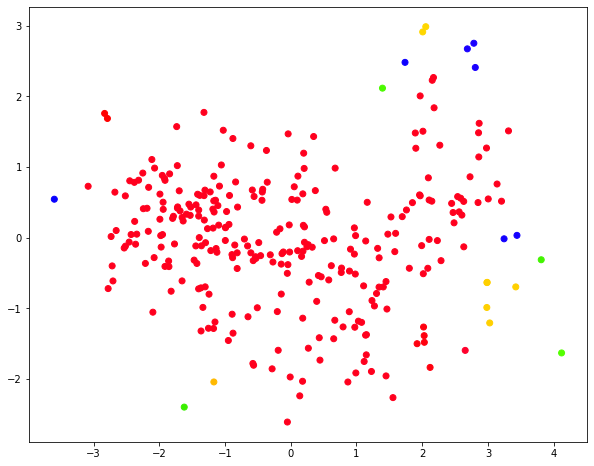

298
Cluster Size:16: Single linkage: Silhouette score=-0.2593, Calinski-Harabasz score=6.5629, Davies-Bouldin score=0.5377


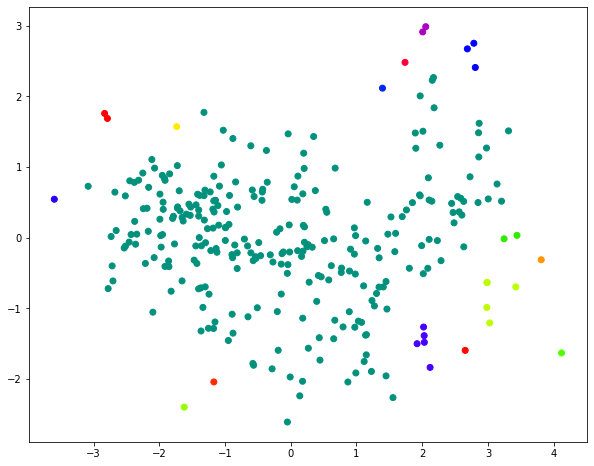

298
Cluster Size:17: Single linkage: Silhouette score=-0.2259, Calinski-Harabasz score=8.1543, Davies-Bouldin score=0.5322


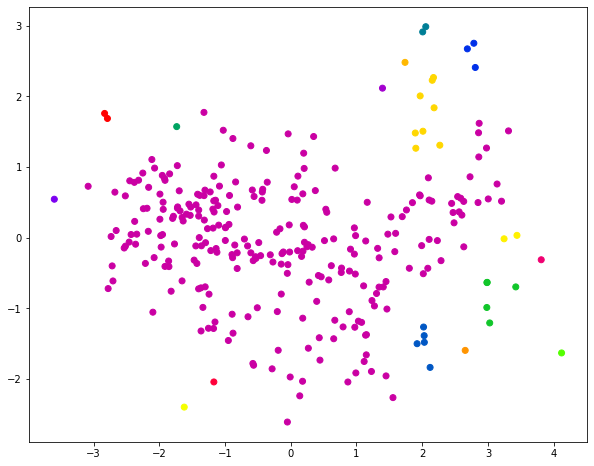

298
Cluster Size:18: Single linkage: Silhouette score=-0.2277, Calinski-Harabasz score=7.6526, Davies-Bouldin score=0.5306


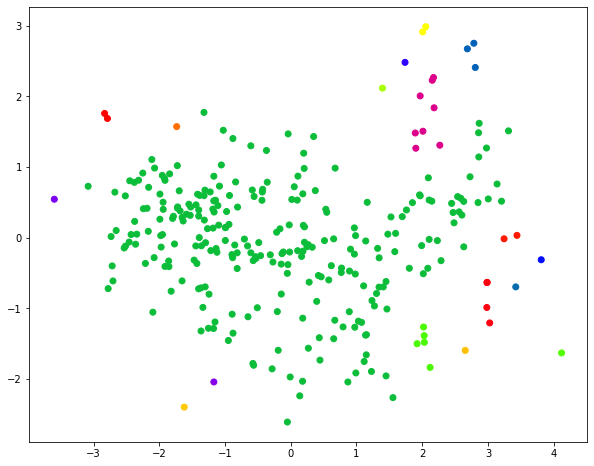

298
Cluster Size:19: Single linkage: Silhouette score=-0.3050, Calinski-Harabasz score=7.2585, Davies-Bouldin score=0.5817


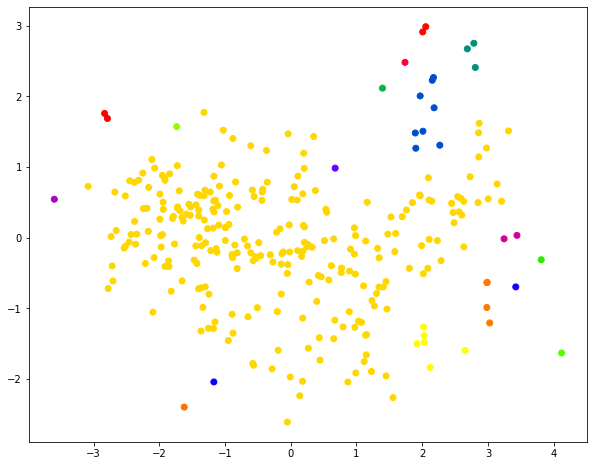

298
Cluster Size:20: Single linkage: Silhouette score=-0.3079, Calinski-Harabasz score=7.0326, Davies-Bouldin score=0.5822


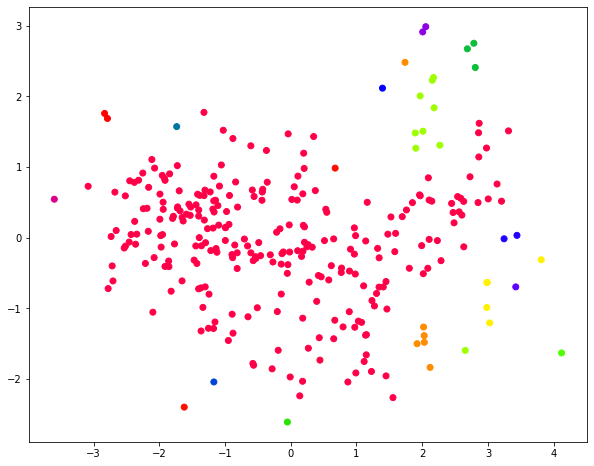

298
Cluster Size:21: Single linkage: Silhouette score=-0.3155, Calinski-Harabasz score=6.8927, Davies-Bouldin score=0.5783


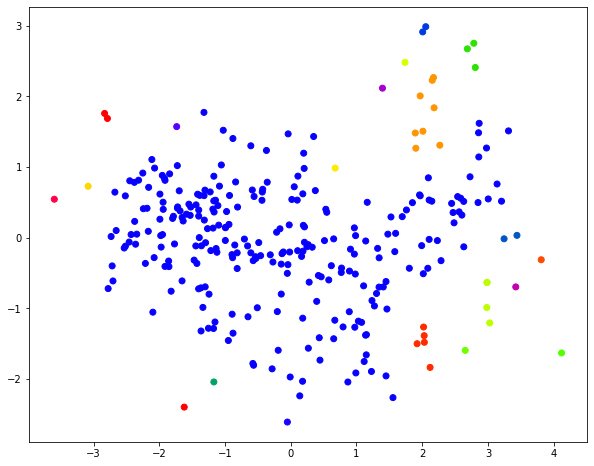

298
Cluster Size:22: Single linkage: Silhouette score=-0.3131, Calinski-Harabasz score=6.9384, Davies-Bouldin score=0.5654


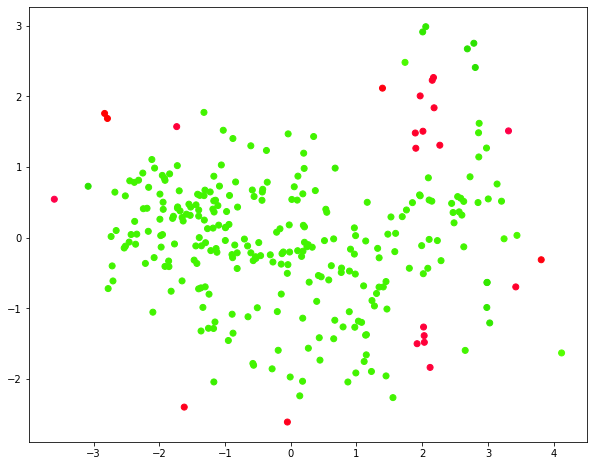

298
Cluster Size:23: Single linkage: Silhouette score=-0.3340, Calinski-Harabasz score=6.6583, Davies-Bouldin score=0.5838


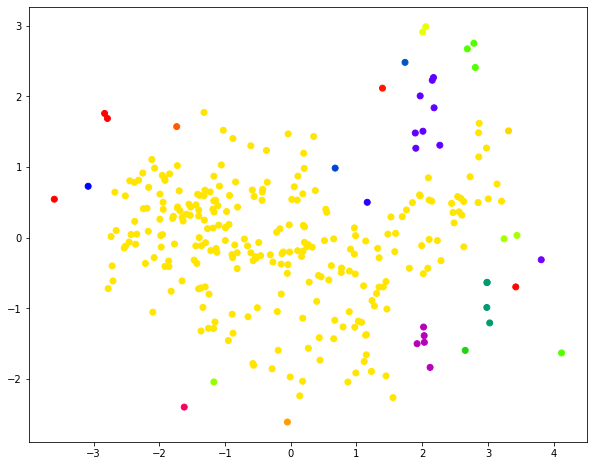

298
Cluster Size:24: Single linkage: Silhouette score=-0.3646, Calinski-Harabasz score=6.4544, Davies-Bouldin score=0.5899


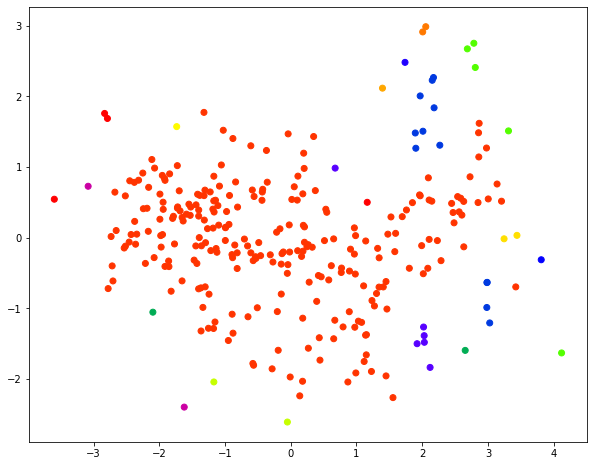

298
Cluster Size:25: Single linkage: Silhouette score=-0.3613, Calinski-Harabasz score=6.4917, Davies-Bouldin score=0.6105


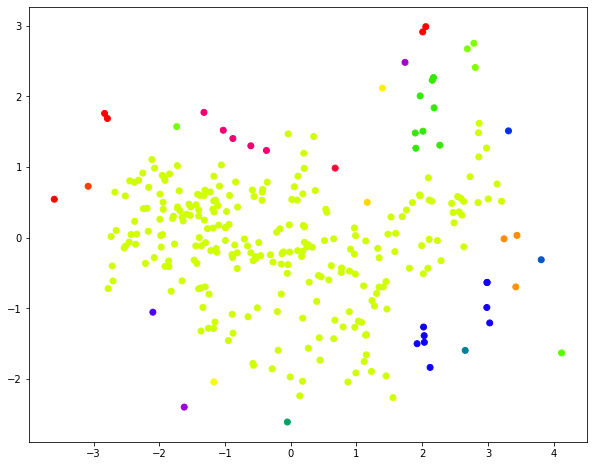

298
Cluster Size:26: Single linkage: Silhouette score=-0.3450, Calinski-Harabasz score=6.7727, Davies-Bouldin score=0.6261


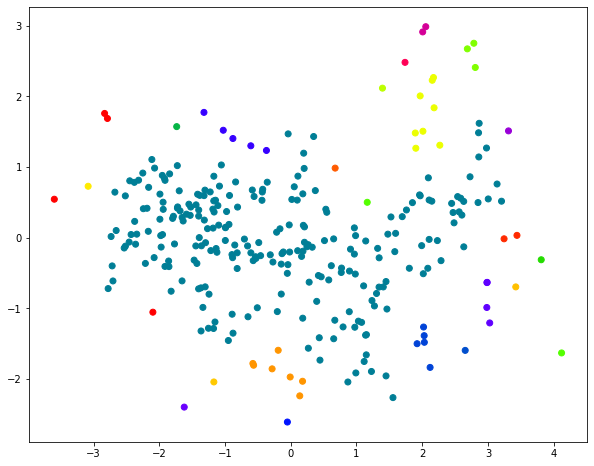

298
Cluster Size:27: Single linkage: Silhouette score=-0.3512, Calinski-Harabasz score=6.4984, Davies-Bouldin score=0.6323


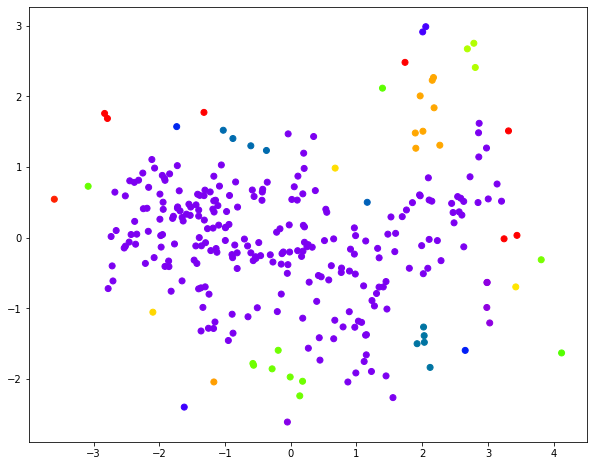

298
Cluster Size:28: Single linkage: Silhouette score=-0.3443, Calinski-Harabasz score=6.2574, Davies-Bouldin score=0.6264


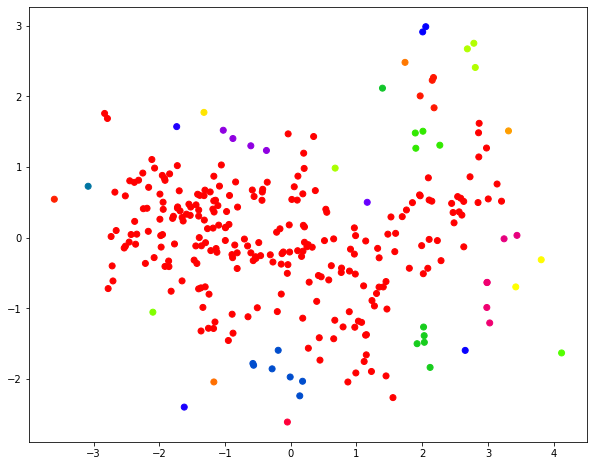

298
Cluster Size:29: Single linkage: Silhouette score=-0.3477, Calinski-Harabasz score=6.1968, Davies-Bouldin score=0.6202


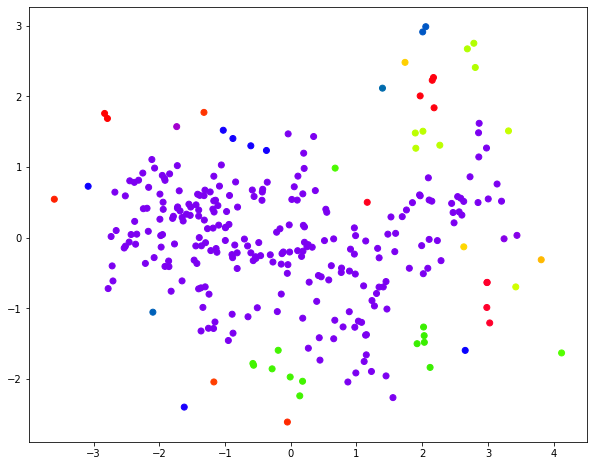

298
Cluster Size:30: Single linkage: Silhouette score=-0.3505, Calinski-Harabasz score=5.9643, Davies-Bouldin score=0.6161


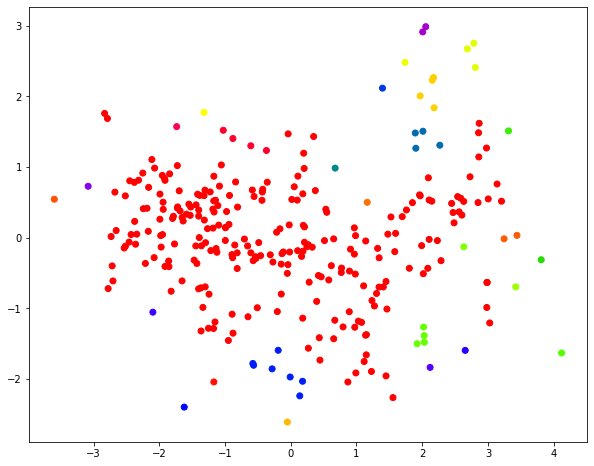

298
Cluster Size:31: Single linkage: Silhouette score=-0.3362, Calinski-Harabasz score=6.0049, Davies-Bouldin score=0.6808


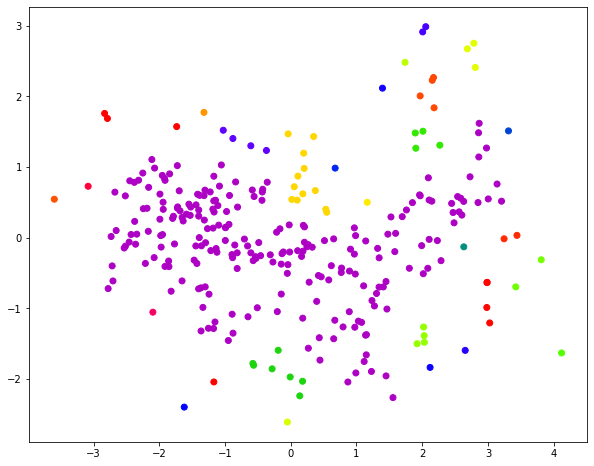

298
Cluster Size:32: Single linkage: Silhouette score=-0.3413, Calinski-Harabasz score=5.8008, Davies-Bouldin score=0.6921


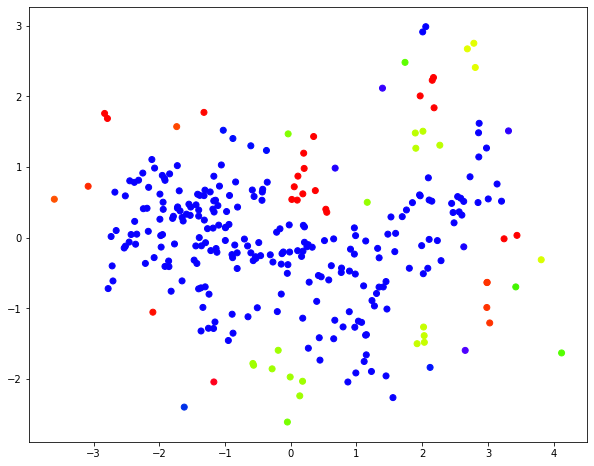

298
Cluster Size:33: Single linkage: Silhouette score=-0.3353, Calinski-Harabasz score=5.6027, Davies-Bouldin score=0.6808


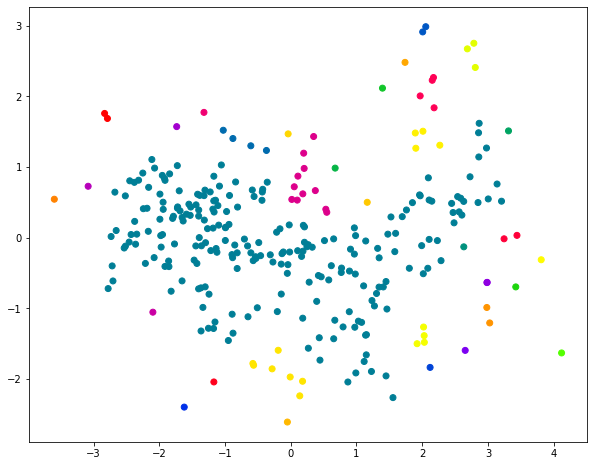

298
Cluster Size:34: Single linkage: Silhouette score=-0.3081, Calinski-Harabasz score=6.6955, Davies-Bouldin score=0.6485


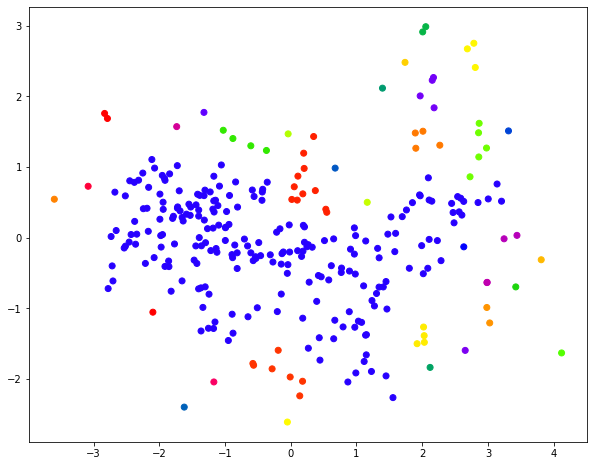

298
Cluster Size:35: Single linkage: Silhouette score=-0.3067, Calinski-Harabasz score=6.6633, Davies-Bouldin score=0.6425


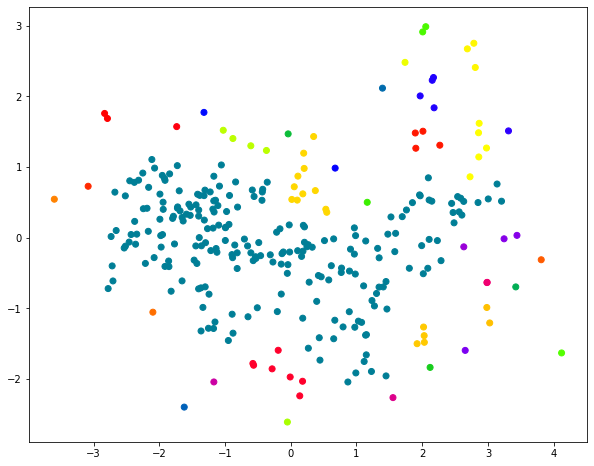

298
Cluster Size:36: Single linkage: Silhouette score=-0.3111, Calinski-Harabasz score=6.4504, Davies-Bouldin score=0.6374


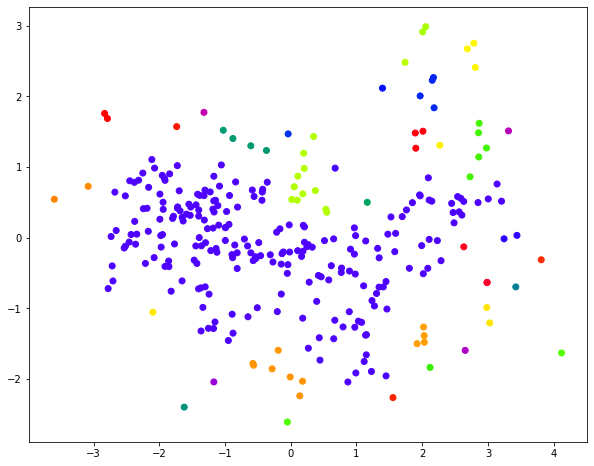

298
Cluster Size:37: Single linkage: Silhouette score=-0.2778, Calinski-Harabasz score=7.2482, Davies-Bouldin score=0.6165


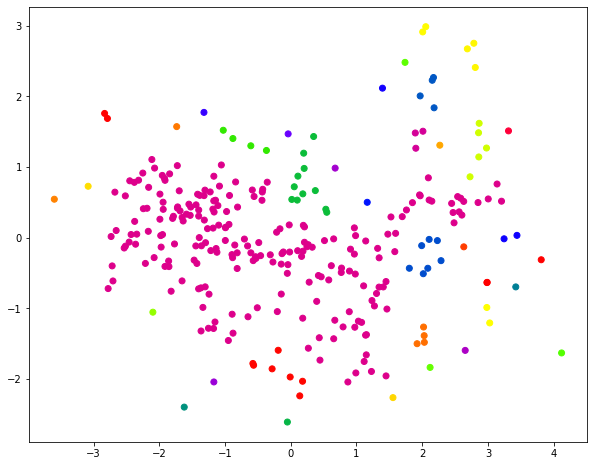

298
Cluster Size:38: Single linkage: Silhouette score=-0.3019, Calinski-Harabasz score=7.0604, Davies-Bouldin score=0.6323


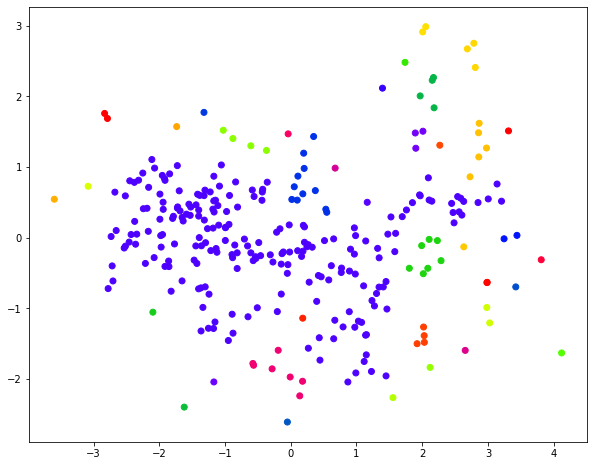

298
Cluster Size:39: Single linkage: Silhouette score=-0.2918, Calinski-Harabasz score=7.2675, Davies-Bouldin score=0.6328


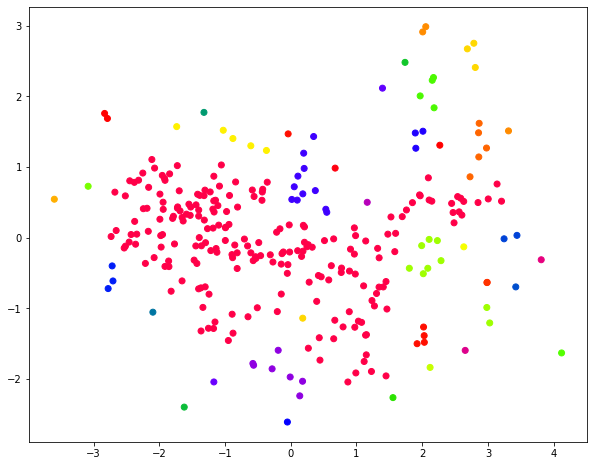

298
Cluster Size:40: Single linkage: Silhouette score=-0.2941, Calinski-Harabasz score=7.0597, Davies-Bouldin score=0.6252


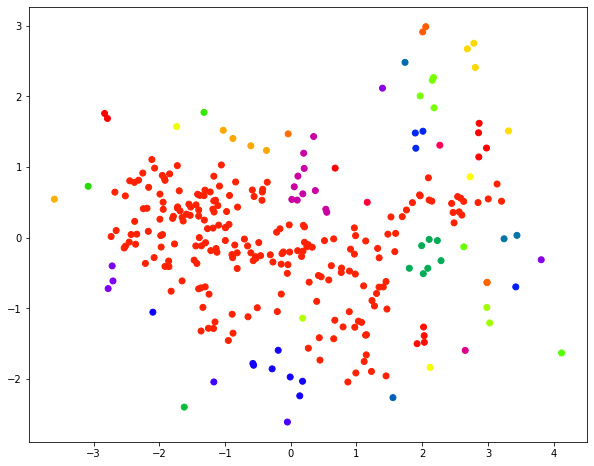

298
Cluster Size:41: Single linkage: Silhouette score=-0.2990, Calinski-Harabasz score=6.8701, Davies-Bouldin score=0.6392


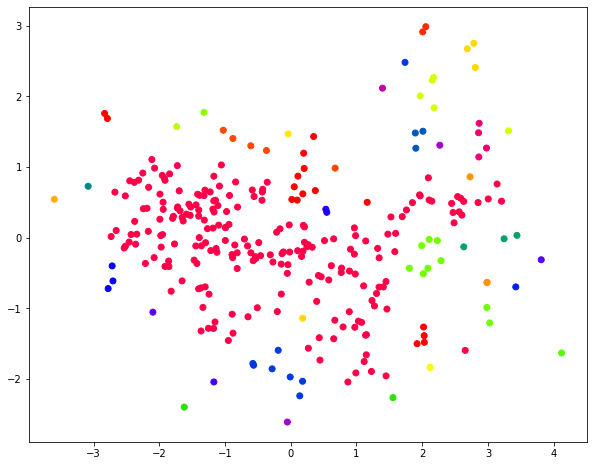

298
Cluster Size:42: Single linkage: Silhouette score=-0.3094, Calinski-Harabasz score=6.7106, Davies-Bouldin score=0.6757


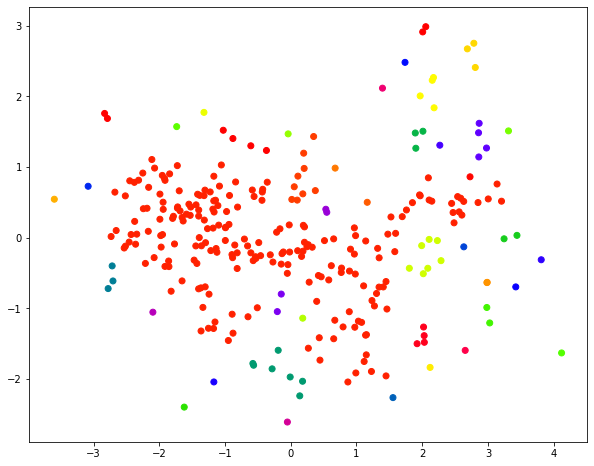

298
Cluster Size:43: Single linkage: Silhouette score=-0.2466, Calinski-Harabasz score=8.4479, Davies-Bouldin score=0.6353


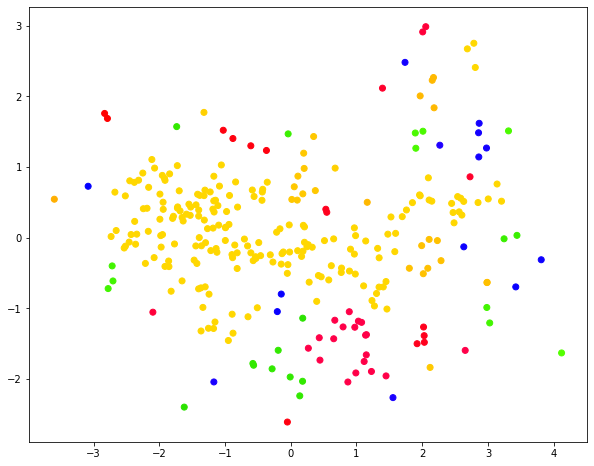

298
Cluster Size:44: Single linkage: Silhouette score=-0.1772, Calinski-Harabasz score=13.8055, Davies-Bouldin score=0.5636


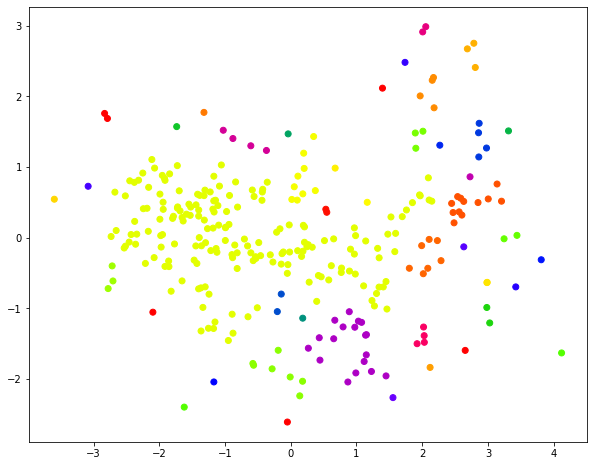

298
Cluster Size:45: Single linkage: Silhouette score=-0.1715, Calinski-Harabasz score=13.4734, Davies-Bouldin score=0.5643


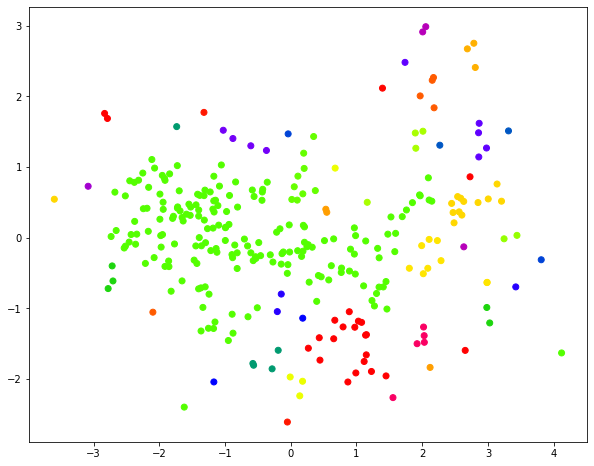

298
Cluster Size:46: Single linkage: Silhouette score=-0.1763, Calinski-Harabasz score=13.2374, Davies-Bouldin score=0.5687


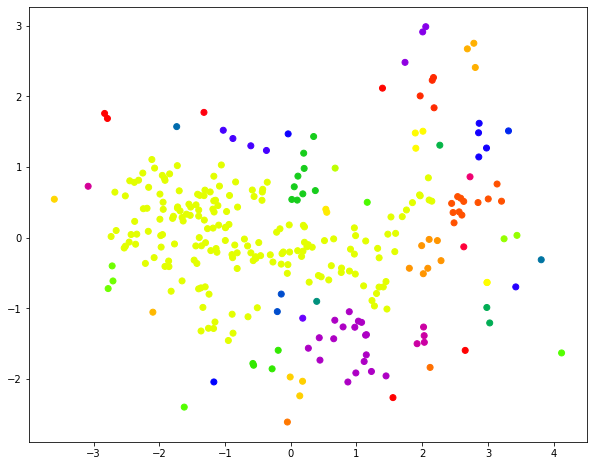

298
Cluster Size:47: Single linkage: Silhouette score=-0.0445, Calinski-Harabasz score=34.1502, Davies-Bouldin score=0.5096


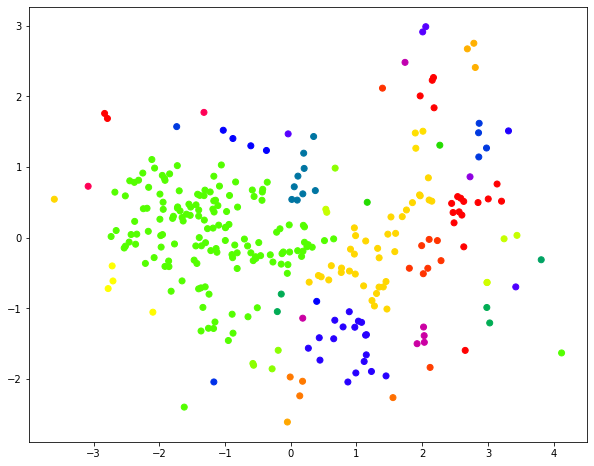

298
Cluster Size:48: Single linkage: Silhouette score=-0.0442, Calinski-Harabasz score=33.3530, Davies-Bouldin score=0.5090


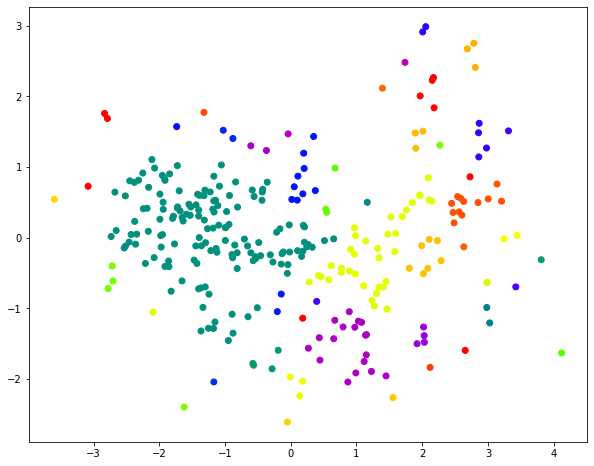

298
Cluster Size:49: Single linkage: Silhouette score=-0.0469, Calinski-Harabasz score=32.5430, Davies-Bouldin score=0.5013


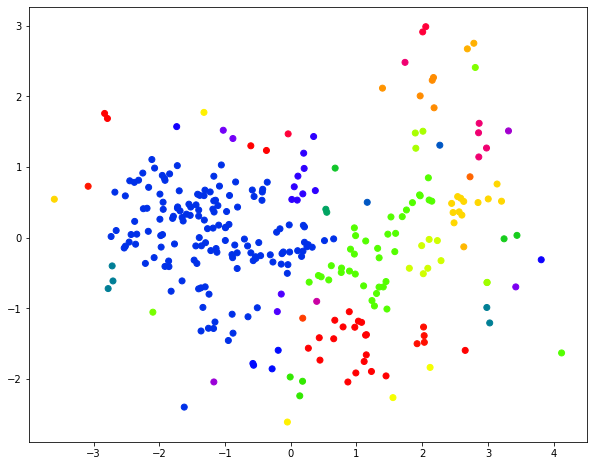

298
Cluster Size:50: Single linkage: Silhouette score=-0.0491, Calinski-Harabasz score=31.8063, Davies-Bouldin score=0.5044


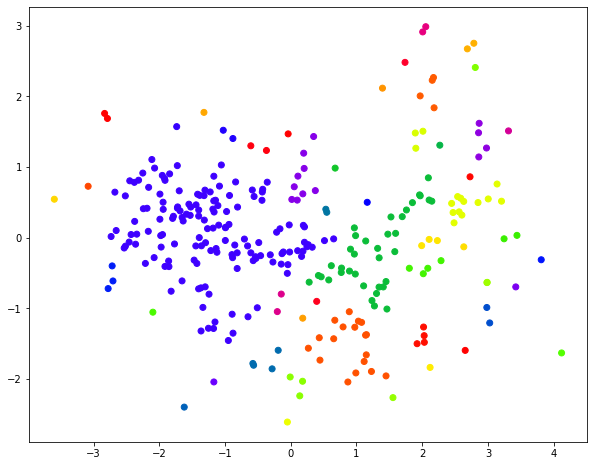

In [776]:
# tsne = TSNE(n_components=2, perplexity=30, random_state=0)
# Y = tsne.fit_transform(X)
for cnt in range(2,51):
    labels_single = fcluster(Z_single, cnt, criterion='maxclust')
    print(len(labels_single))
    # print(labels)
    # print(labels)
    score1 = silhouette_score(X, labels_single)
#     print(score1)
    score2 = calinski_harabasz_score(X, labels_single)
    score3 = davies_bouldin_score(X, labels_single)
    print(f'Cluster Size:{cnt:.0f}: Single linkage: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
    # cluster_size = {}
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=labels_single, cmap='prism')
    graph_name = 'Single_Cluster_Result_Plot'+str(score1)+'_'+str(cnt)
    plt.savefig('hierachical_structures_dendrogram/Single/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
    plt.show()

[0.00455577 0.00716804 0.01505262 0.01644181 0.01772998 0.02464883
 0.02753619 0.02788496 0.02796429 0.02932336 0.0310057  0.03127207
 0.0322256  0.03233471 0.03526957 0.03632106 0.03796365 0.03879664
 0.04352823 0.04439688 0.04488388 0.04510381 0.04534365 0.04583831
 0.04918147 0.05136424 0.05159742 0.05235101 0.05272644 0.05307722
 0.05425187 0.05579342 0.056626   0.05971954 0.06077817 0.06224802
 0.0627815  0.06315041 0.0639275  0.064835   0.06487726 0.06542179
 0.06597636 0.06639699 0.07023555 0.07077914 0.07135878 0.07292098
 0.0763268  0.07646156 0.07737867 0.07857433 0.07908879 0.07917511
 0.08054256 0.08103271 0.08131978 0.08290048 0.08297642 0.08301797
 0.08333754 0.0836504  0.08404506 0.08508186 0.08528865 0.08567523
 0.08571882 0.08641902 0.086451   0.08670238 0.08720195 0.08727898
 0.08769537 0.08970701 0.09113909 0.09146817 0.09239719 0.09427843
 0.09449799 0.09534611 0.09556679 0.09585455 0.09785649 0.09801794
 0.09810762 0.09921858 0.10081603 0.10085703 0.10198865 0.1020

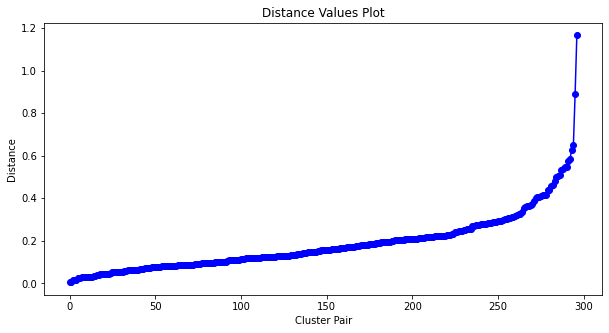

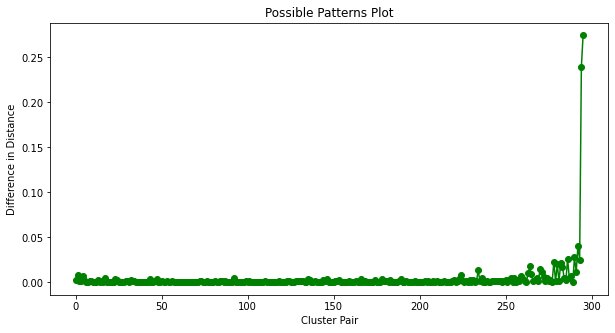

In [759]:
distance = Z_single[:, 2]
print(distance)

# 绘制距离值的变化图
plt.figure(figsize=(10, 5))
plt.title('Distance Values Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Distance')
plt.plot(distance, 'bo-')
graph_name = 'Single_linkage_Distance_Values_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

# 识别距离值中的可能模式
diff = np.diff(distance)
plt.figure(figsize=(10, 5))
plt.title('Possible Patterns Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Difference in Distance')
plt.plot(diff, 'go-')
graph_name = 'Single_linkage_Possible_Patterns_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

In [634]:
# print(Z)

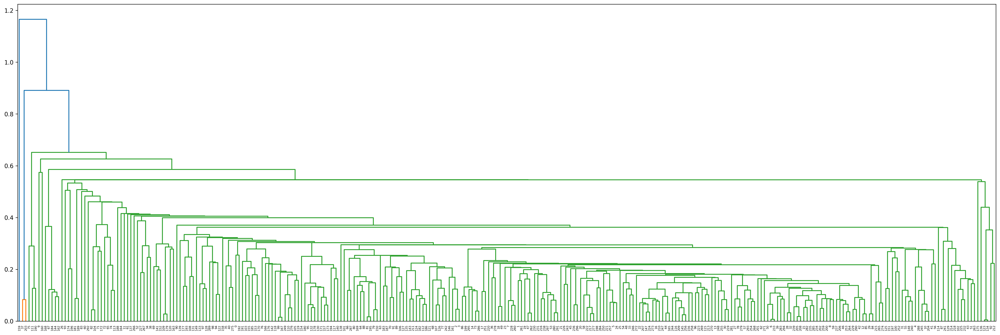

In [760]:
plt.figure(figsize=(30,10))
dendrogram(Z_single)
fig = plt.gcf()
# fig.set_size_inches(10, 4)
fig.set_dpi(300)
# plt.show()
graph_name = 'Single_linkage'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)

In [636]:
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
Y = tsne.fit_transform(X)

/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


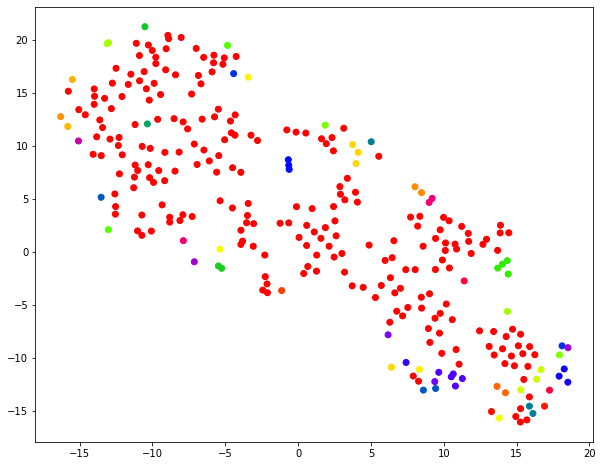

In [637]:
plt.figure(figsize=(10, 8))
plt.scatter(Y[:, 0], Y[:, 1], c=labels_single, cmap='prism')
plt.show()

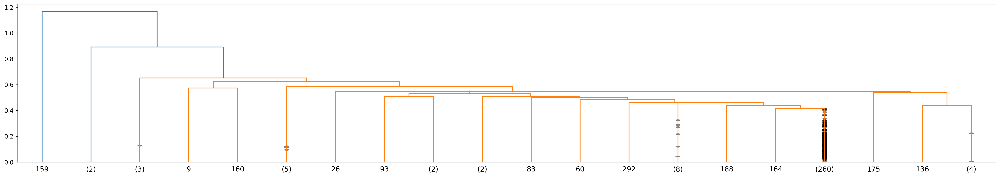

In [761]:
plt.figure(figsize=(30,5))
dendrogram(Z_single,truncate_mode='lastp', p=20,show_contracted=True)
fig = plt.gcf()
# fig.set_size_inches(10, 4)
fig.set_dpi(300)
# plt.show()
graph_name = 'Single_linkage_Sub1'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)

In [639]:
# cluster_size = {}
unique_labels, counts = np.unique(labels_single, return_counts=True)

for label, count in zip(unique_labels, counts):
    print(f"Cluster {label} has size {count}")

Cluster 1 has size 1
Cluster 2 has size 1
Cluster 3 has size 1
Cluster 4 has size 1
Cluster 5 has size 1
Cluster 6 has size 1
Cluster 7 has size 1
Cluster 8 has size 2
Cluster 9 has size 2
Cluster 10 has size 1
Cluster 11 has size 2
Cluster 12 has size 2
Cluster 13 has size 2
Cluster 14 has size 1
Cluster 15 has size 2
Cluster 16 has size 1
Cluster 17 has size 4
Cluster 18 has size 3
Cluster 19 has size 2
Cluster 20 has size 2
Cluster 21 has size 3
Cluster 22 has size 2
Cluster 23 has size 5
Cluster 24 has size 228
Cluster 25 has size 3
Cluster 26 has size 1
Cluster 27 has size 1
Cluster 28 has size 1
Cluster 29 has size 1
Cluster 30 has size 1
Cluster 31 has size 1
Cluster 32 has size 1
Cluster 33 has size 1
Cluster 34 has size 1
Cluster 35 has size 1
Cluster 36 has size 1
Cluster 37 has size 1
Cluster 38 has size 1
Cluster 39 has size 1
Cluster 40 has size 1
Cluster 41 has size 1
Cluster 42 has size 1
Cluster 43 has size 1
Cluster 44 has size 1
Cluster 45 has size 1
Cluster 46 has si

In [762]:
Z_complete = linkage(X, 'complete')
labels_complete = fcluster(Z_complete, 3, criterion='maxclust')
# print(labels)
# print(labels)
score2=silhouette_score(X,  labels_complete)
print(score2)

0.36246952731013443


[4.55576713e-03 7.16804104e-03 1.50526237e-02 1.64418146e-02
 1.77299801e-02 2.46488257e-02 2.75361918e-02 2.78849564e-02
 2.79642929e-02 2.93233609e-02 3.10057000e-02 3.12720711e-02
 3.22255960e-02 3.23347114e-02 3.52695688e-02 3.63210599e-02
 3.79636493e-02 3.87966425e-02 4.35282318e-02 4.43968826e-02
 4.48838827e-02 4.51038060e-02 4.53436465e-02 4.58383057e-02
 4.91814655e-02 5.13642388e-02 5.23510122e-02 5.27264418e-02
 5.42518684e-02 5.66260018e-02 5.97195377e-02 6.07781700e-02
 6.22480153e-02 6.27814991e-02 6.31504075e-02 6.48350043e-02
 6.55341209e-02 6.70364830e-02 7.02355526e-02 7.13587798e-02
 7.15532435e-02 7.37028298e-02 7.63268039e-02 7.64615575e-02
 7.73786670e-02 7.90887903e-02 8.11748482e-02 8.29004840e-02
 8.29764157e-02 8.33375421e-02 8.50818624e-02 8.52886512e-02
 8.64510030e-02 8.76953685e-02 9.11390870e-02 9.14603633e-02
 9.42784251e-02 9.48597823e-02 9.58545494e-02 9.62418076e-02
 9.74434448e-02 9.78564868e-02 9.92185774e-02 1.00597178e-01
 1.00816035e-01 1.019886

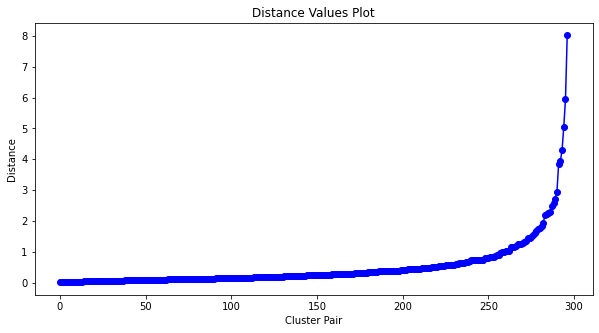

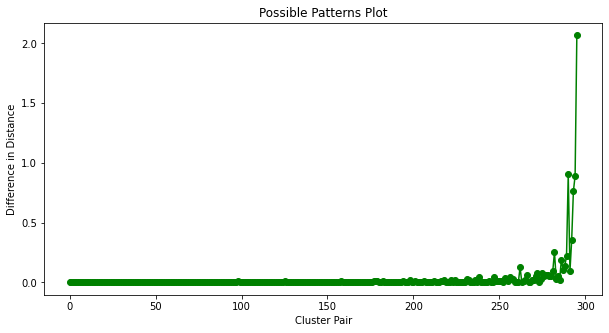

In [763]:
distance = Z_complete[:, 2]
print(distance)

# 绘制距离值的变化图
plt.figure(figsize=(10, 5))
plt.title('Distance Values Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Distance')
plt.plot(distance, 'bo-')
graph_name = 'Complete_linkage_Distance_Values_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

# 识别距离值中的可能模式
diff = np.diff(distance)
plt.figure(figsize=(10, 5))
plt.title('Possible Patterns Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Difference in Distance')
plt.plot(diff, 'go-')
graph_name = 'Complete_linkage_Possible_Patterns_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

298
Cluster Size:2: Complete linkage: Silhouette score=0.4526, Calinski-Harabasz score=297.0382, Davies-Bouldin score=0.8114


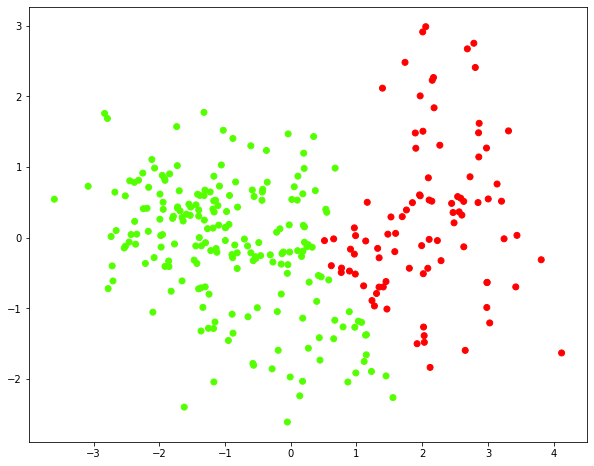

298
Cluster Size:3: Complete linkage: Silhouette score=0.3625, Calinski-Harabasz score=282.3412, Davies-Bouldin score=0.9525


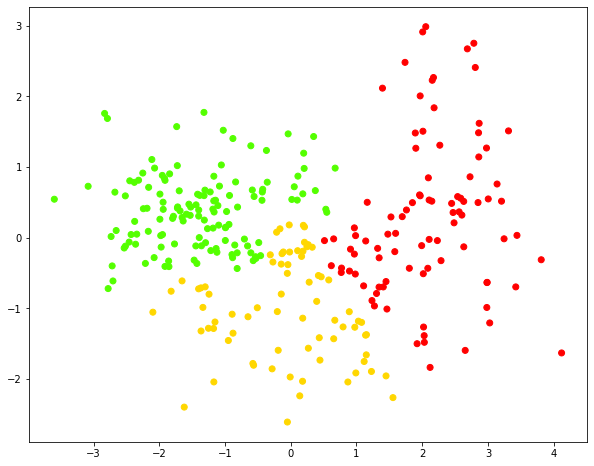

298
Cluster Size:4: Complete linkage: Silhouette score=0.3427, Calinski-Harabasz score=256.6089, Davies-Bouldin score=0.9417


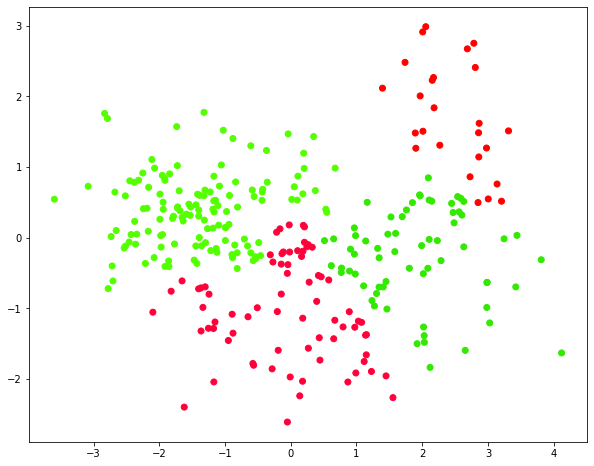

298
Cluster Size:5: Complete linkage: Silhouette score=0.2860, Calinski-Harabasz score=252.0577, Davies-Bouldin score=0.9690


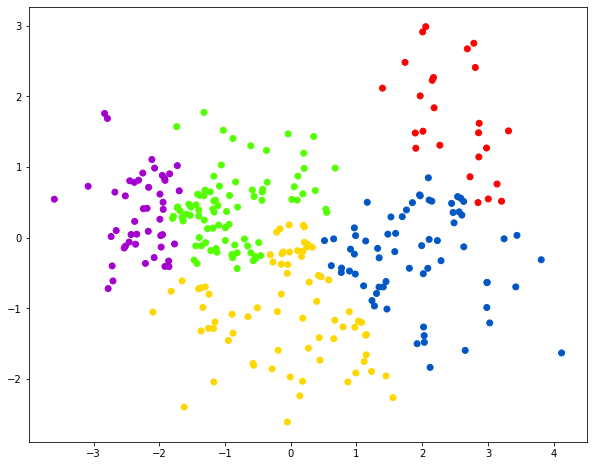

298
Cluster Size:6: Complete linkage: Silhouette score=0.2886, Calinski-Harabasz score=231.9664, Davies-Bouldin score=0.9762


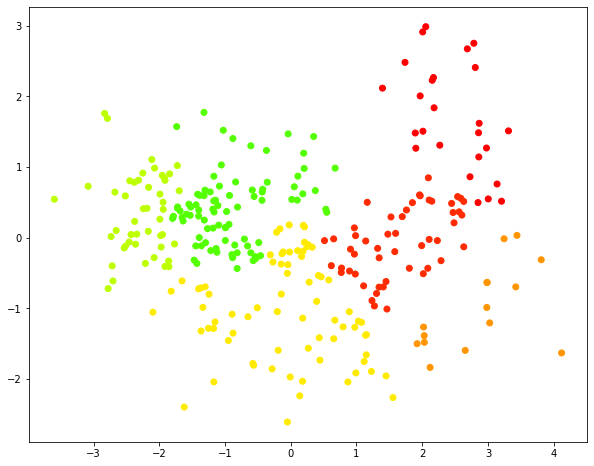

298
Cluster Size:7: Complete linkage: Silhouette score=0.2970, Calinski-Harabasz score=237.2713, Davies-Bouldin score=0.9308


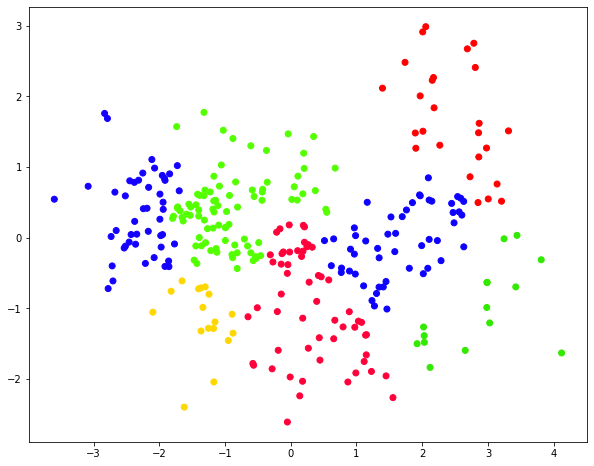

298
Cluster Size:8: Complete linkage: Silhouette score=0.2981, Calinski-Harabasz score=245.6891, Davies-Bouldin score=0.8907


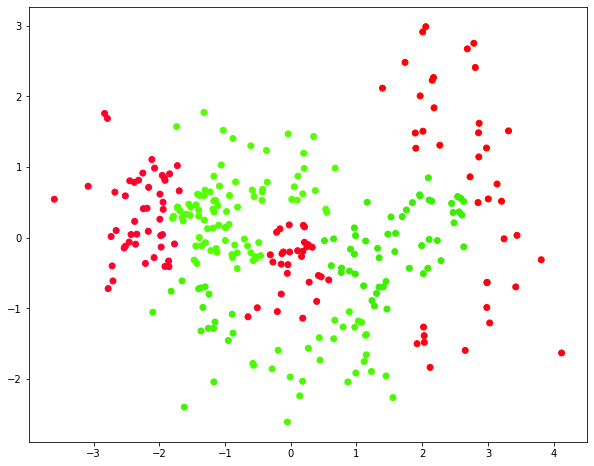

298
Cluster Size:9: Complete linkage: Silhouette score=0.2808, Calinski-Harabasz score=233.7794, Davies-Bouldin score=0.8647


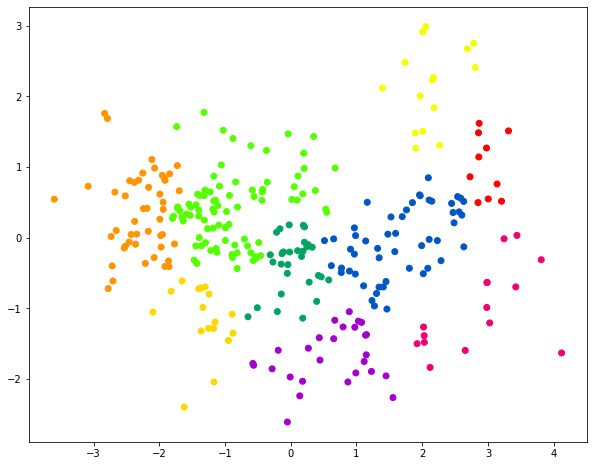

298
Cluster Size:10: Complete linkage: Silhouette score=0.3031, Calinski-Harabasz score=248.8920, Davies-Bouldin score=0.8305


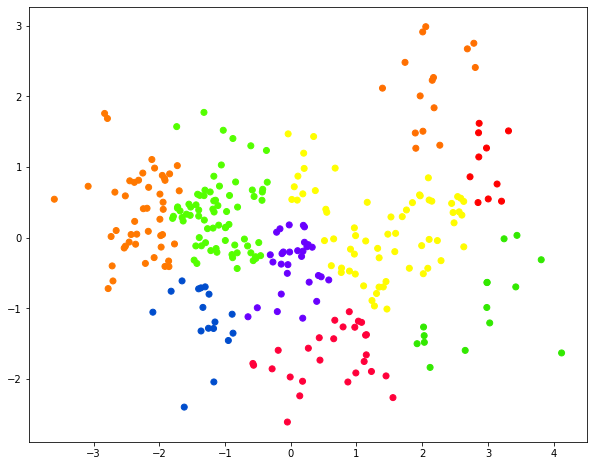

298
Cluster Size:11: Complete linkage: Silhouette score=0.3024, Calinski-Harabasz score=245.7227, Davies-Bouldin score=0.8087


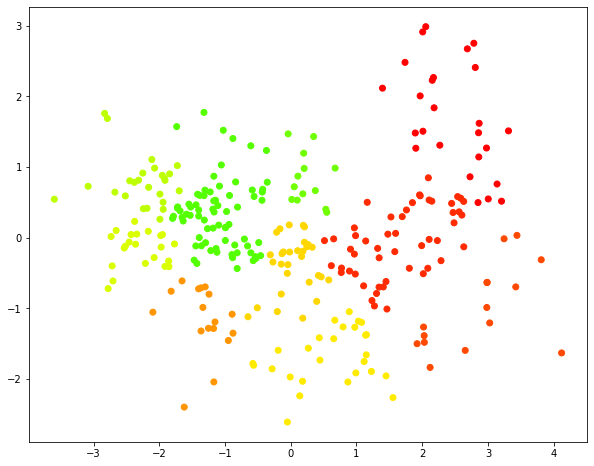

298
Cluster Size:12: Complete linkage: Silhouette score=0.2965, Calinski-Harabasz score=239.8660, Davies-Bouldin score=0.7482


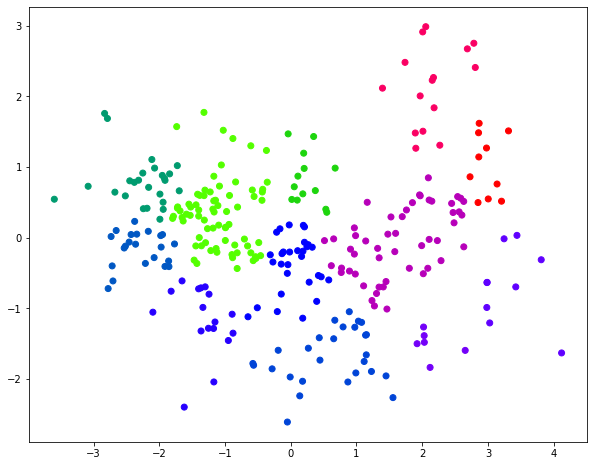

298
Cluster Size:13: Complete linkage: Silhouette score=0.3078, Calinski-Harabasz score=244.7836, Davies-Bouldin score=0.8057


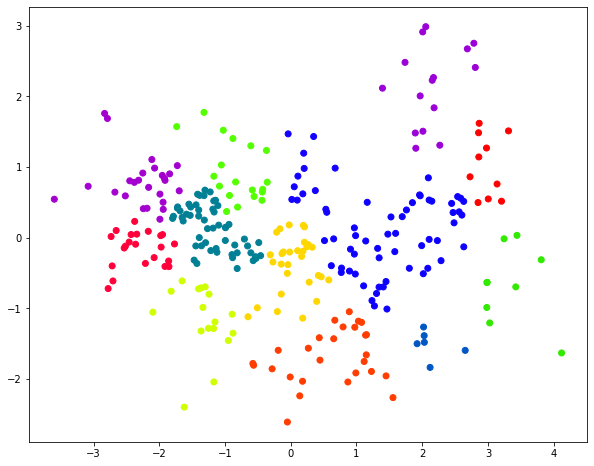

298
Cluster Size:14: Complete linkage: Silhouette score=0.3384, Calinski-Harabasz score=280.1061, Davies-Bouldin score=0.8153


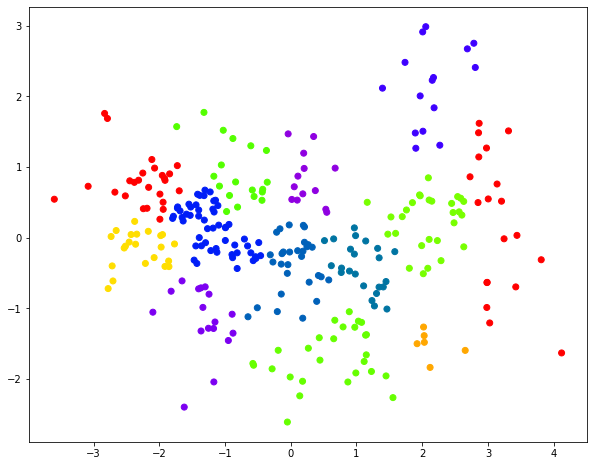

298
Cluster Size:15: Complete linkage: Silhouette score=0.3467, Calinski-Harabasz score=289.2073, Davies-Bouldin score=0.8026


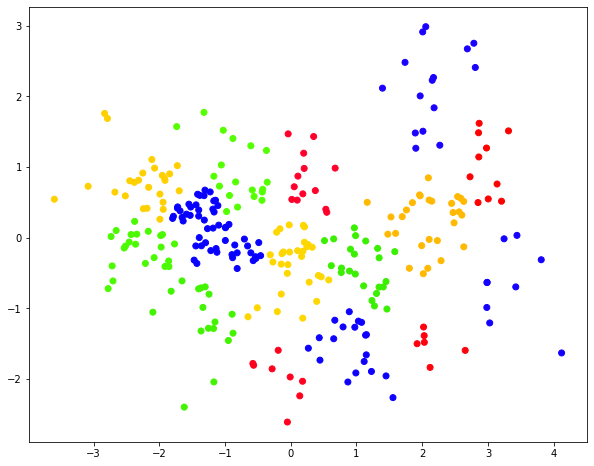

298
Cluster Size:16: Complete linkage: Silhouette score=0.3453, Calinski-Harabasz score=284.6679, Davies-Bouldin score=0.8001


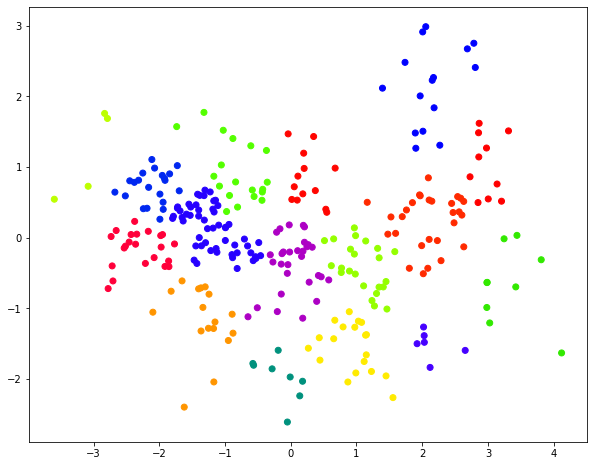

298
Cluster Size:17: Complete linkage: Silhouette score=0.3450, Calinski-Harabasz score=272.9952, Davies-Bouldin score=0.7729


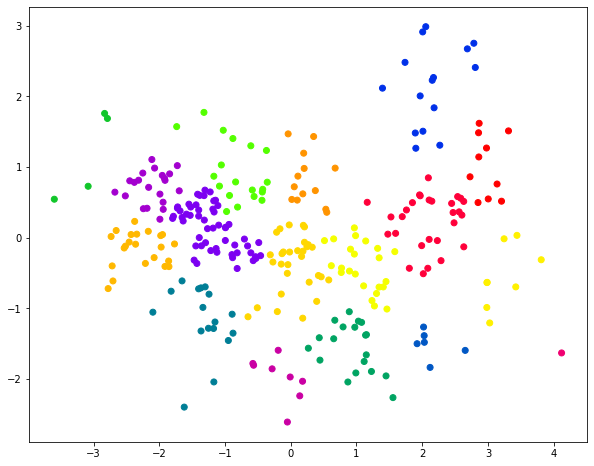

298
Cluster Size:18: Complete linkage: Silhouette score=0.3468, Calinski-Harabasz score=266.4677, Davies-Bouldin score=0.7610


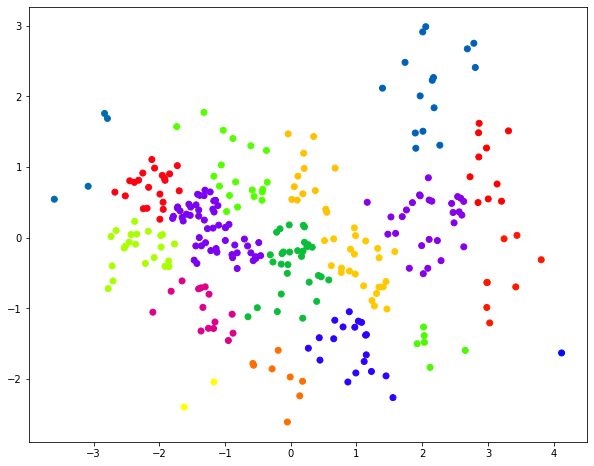

298
Cluster Size:19: Complete linkage: Silhouette score=0.3459, Calinski-Harabasz score=265.6289, Davies-Bouldin score=0.7693


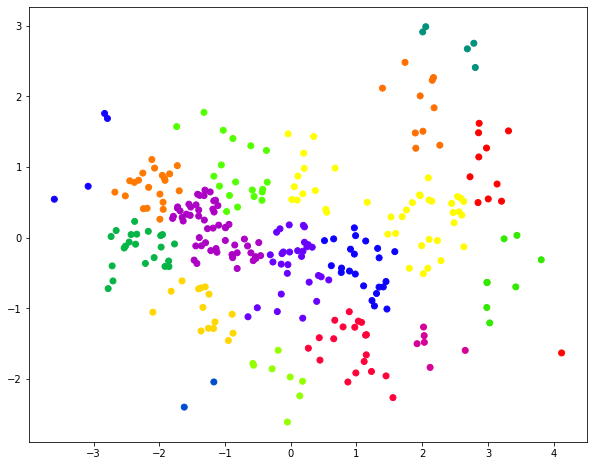

298
Cluster Size:20: Complete linkage: Silhouette score=0.3437, Calinski-Harabasz score=261.1574, Davies-Bouldin score=0.7516


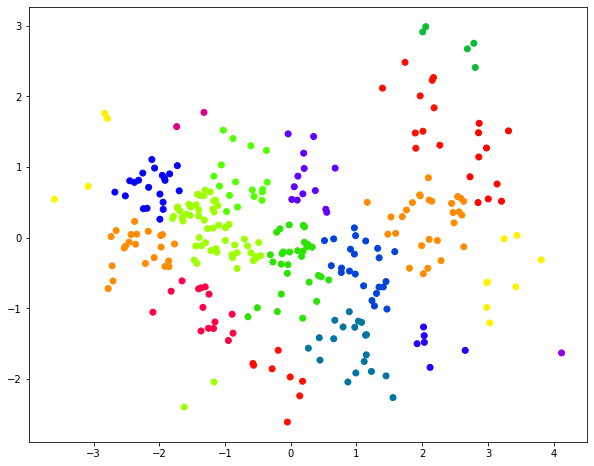

298
Cluster Size:21: Complete linkage: Silhouette score=0.3445, Calinski-Harabasz score=260.8196, Davies-Bouldin score=0.7891


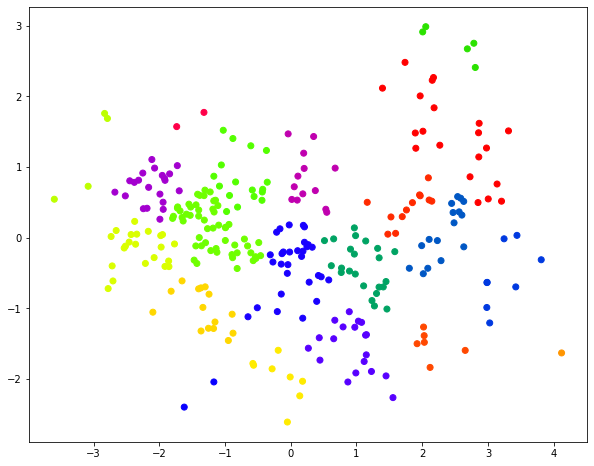

298
Cluster Size:22: Complete linkage: Silhouette score=0.3424, Calinski-Harabasz score=262.2278, Davies-Bouldin score=0.7800


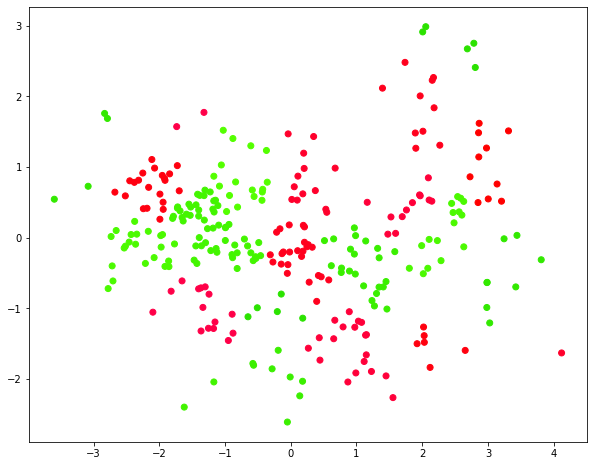

298
Cluster Size:23: Complete linkage: Silhouette score=0.3433, Calinski-Harabasz score=260.6887, Davies-Bouldin score=0.7797


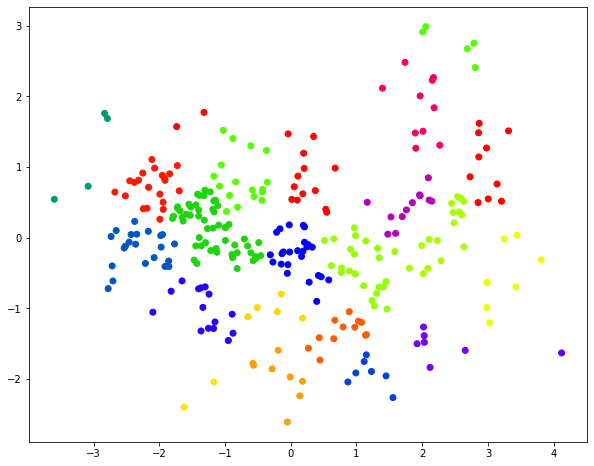

298
Cluster Size:24: Complete linkage: Silhouette score=0.3643, Calinski-Harabasz score=289.4752, Davies-Bouldin score=0.7628


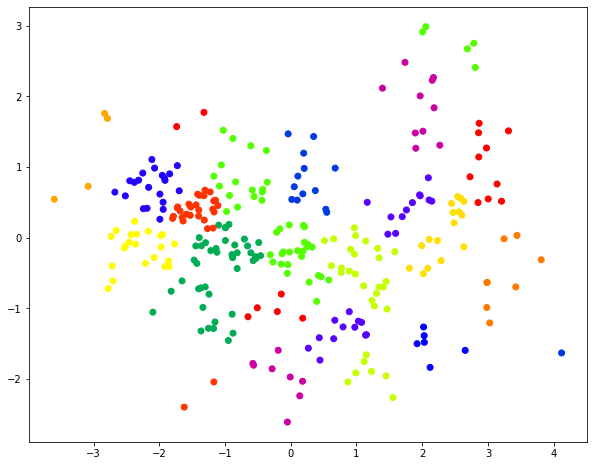

298
Cluster Size:25: Complete linkage: Silhouette score=0.3695, Calinski-Harabasz score=286.0415, Davies-Bouldin score=0.7241


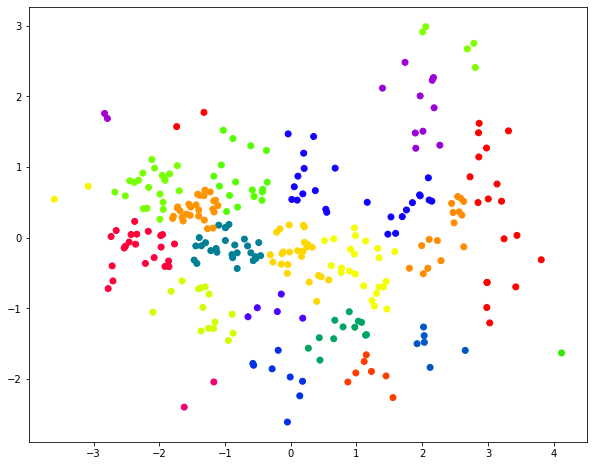

298
Cluster Size:26: Complete linkage: Silhouette score=0.3649, Calinski-Harabasz score=289.5105, Davies-Bouldin score=0.7375


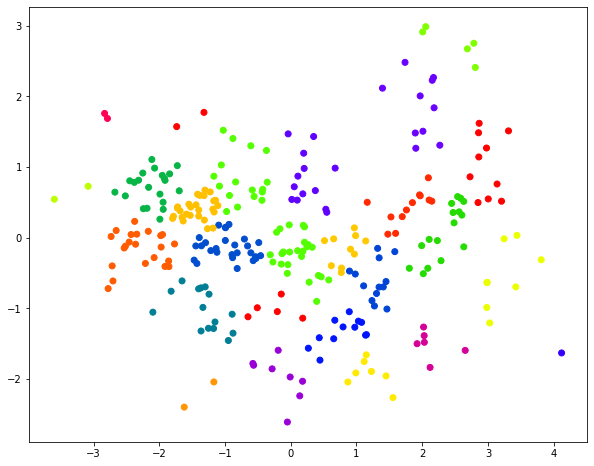

298
Cluster Size:27: Complete linkage: Silhouette score=0.3664, Calinski-Harabasz score=286.9650, Davies-Bouldin score=0.7227


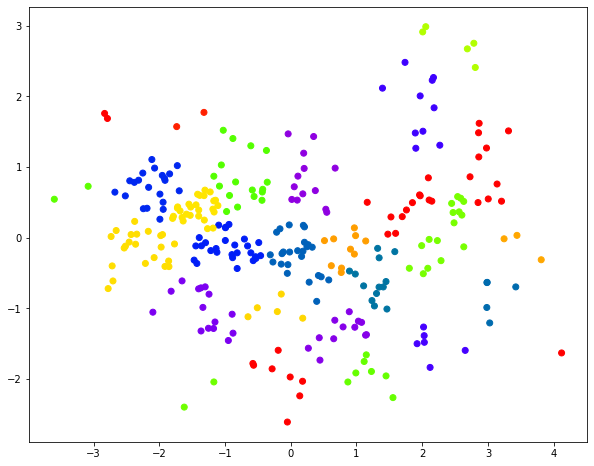

298
Cluster Size:28: Complete linkage: Silhouette score=0.3661, Calinski-Harabasz score=285.8468, Davies-Bouldin score=0.7265


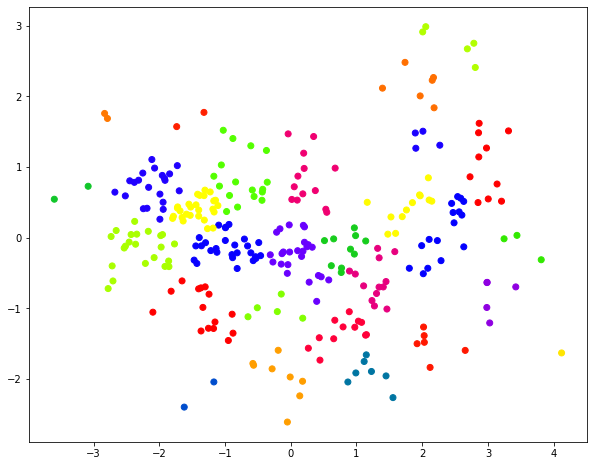

298
Cluster Size:29: Complete linkage: Silhouette score=0.3742, Calinski-Harabasz score=293.9853, Davies-Bouldin score=0.7009


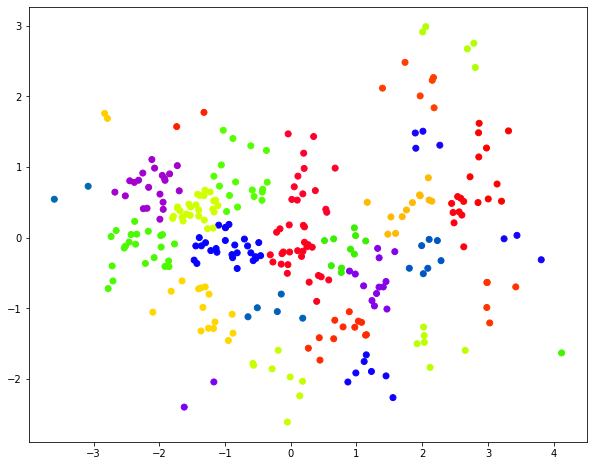

298
Cluster Size:30: Complete linkage: Silhouette score=0.3695, Calinski-Harabasz score=292.4201, Davies-Bouldin score=0.6967


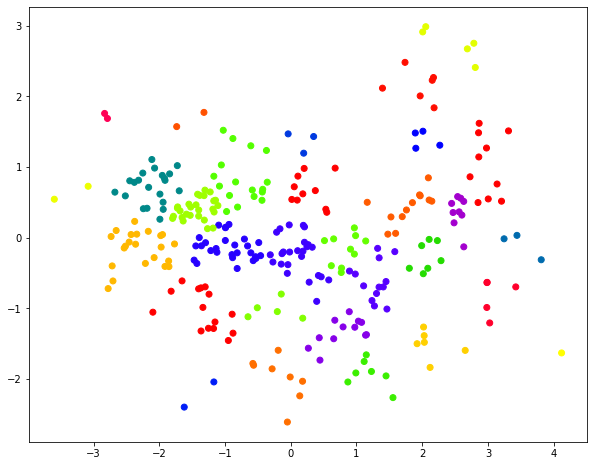

298
Cluster Size:31: Complete linkage: Silhouette score=0.3664, Calinski-Harabasz score=295.4861, Davies-Bouldin score=0.6964


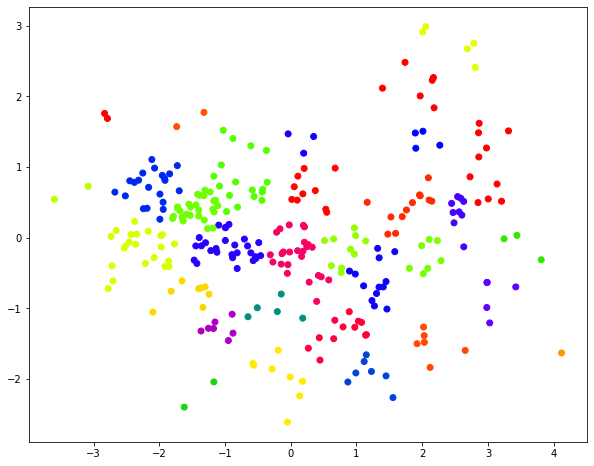

298
Cluster Size:32: Complete linkage: Silhouette score=0.3646, Calinski-Harabasz score=296.6516, Davies-Bouldin score=0.6948


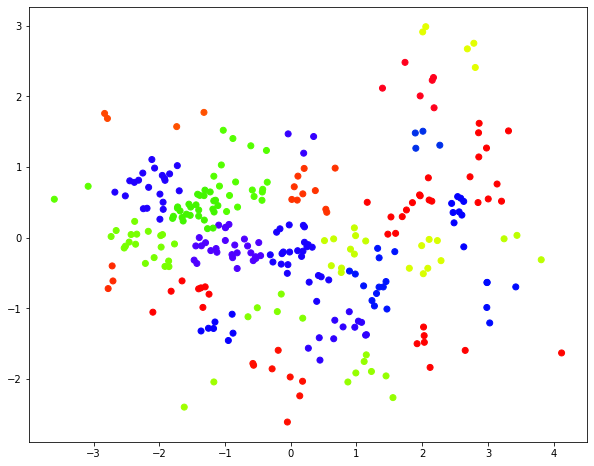

298
Cluster Size:33: Complete linkage: Silhouette score=0.3682, Calinski-Harabasz score=302.4746, Davies-Bouldin score=0.6883


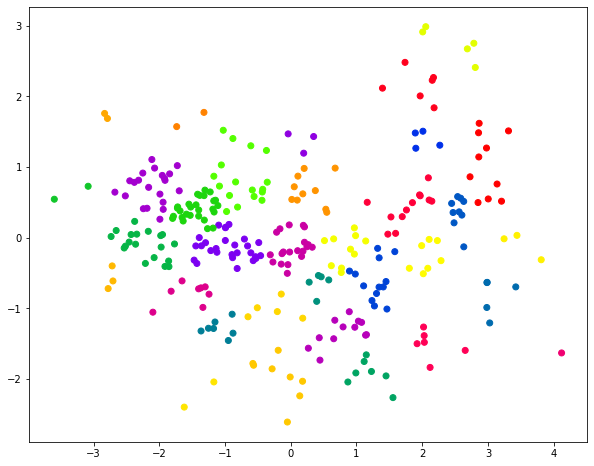

298
Cluster Size:34: Complete linkage: Silhouette score=0.3687, Calinski-Harabasz score=304.0238, Davies-Bouldin score=0.6917


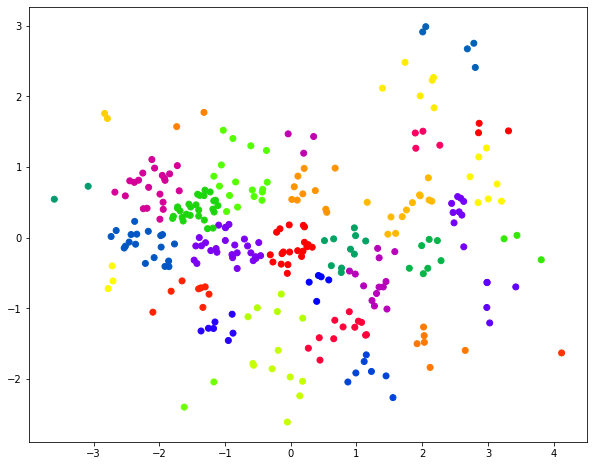

298
Cluster Size:35: Complete linkage: Silhouette score=0.3746, Calinski-Harabasz score=309.9780, Davies-Bouldin score=0.6953


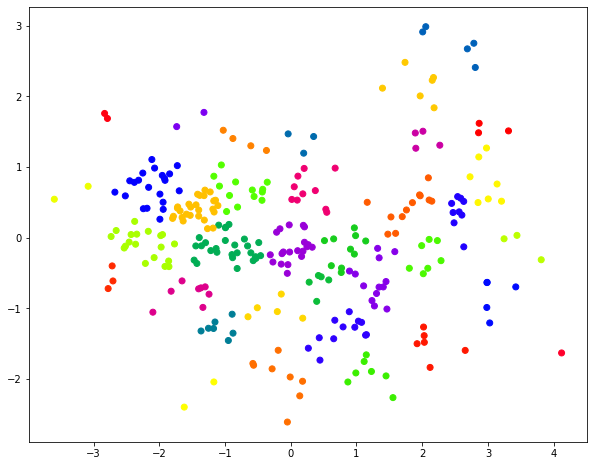

298
Cluster Size:36: Complete linkage: Silhouette score=0.3759, Calinski-Harabasz score=309.6913, Davies-Bouldin score=0.6913


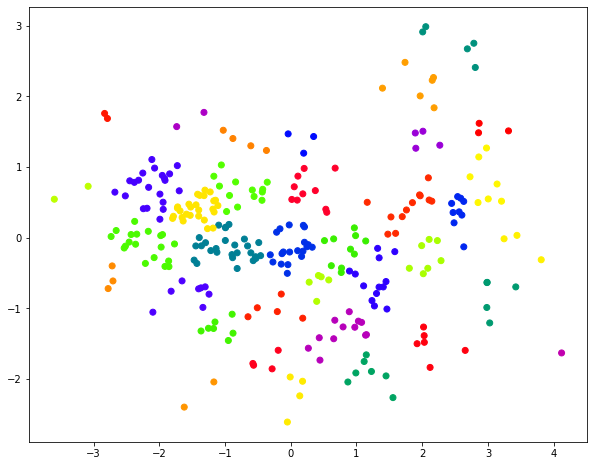

298
Cluster Size:37: Complete linkage: Silhouette score=0.3644, Calinski-Harabasz score=310.4967, Davies-Bouldin score=0.7104


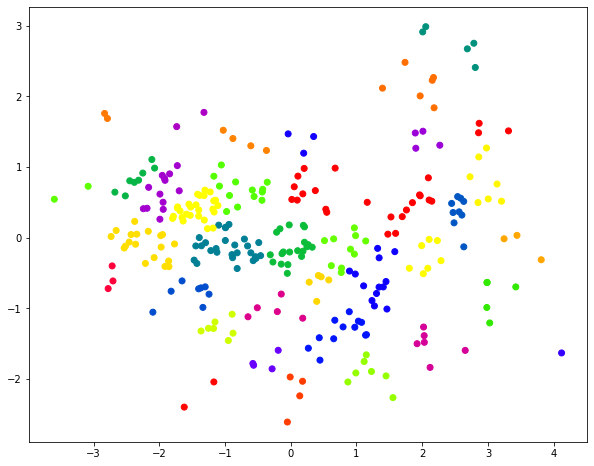

298
Cluster Size:38: Complete linkage: Silhouette score=0.3673, Calinski-Harabasz score=326.1083, Davies-Bouldin score=0.7164


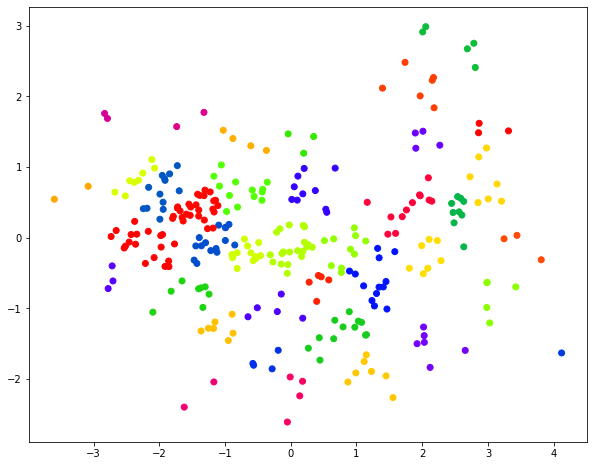

298
Cluster Size:39: Complete linkage: Silhouette score=0.3718, Calinski-Harabasz score=330.8617, Davies-Bouldin score=0.7078


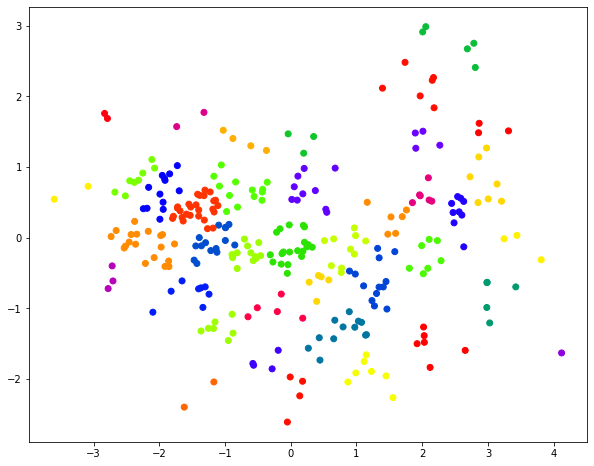

298
Cluster Size:40: Complete linkage: Silhouette score=0.3824, Calinski-Harabasz score=343.0652, Davies-Bouldin score=0.7013


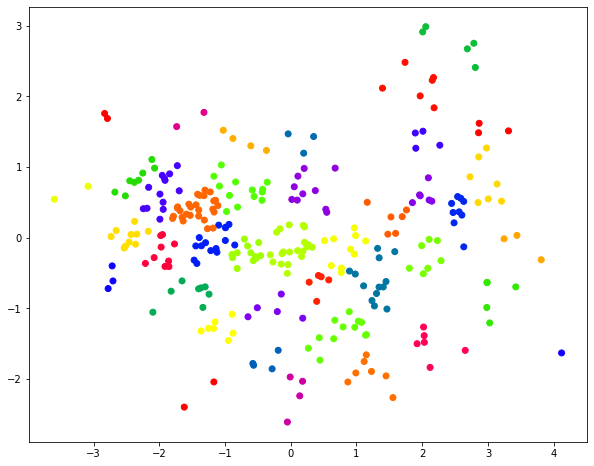

298
Cluster Size:41: Complete linkage: Silhouette score=0.3879, Calinski-Harabasz score=345.8494, Davies-Bouldin score=0.6792


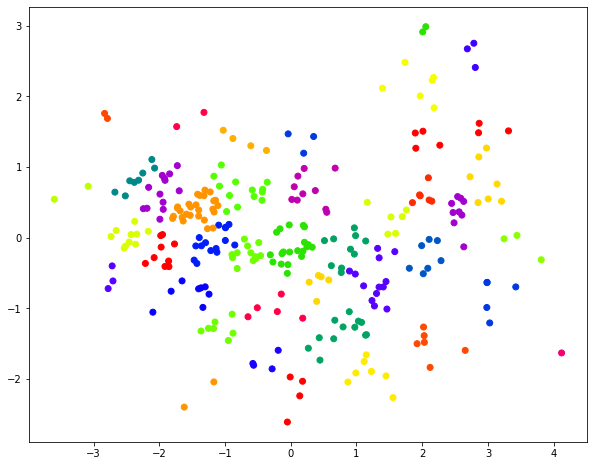

298
Cluster Size:42: Complete linkage: Silhouette score=0.3898, Calinski-Harabasz score=352.5213, Davies-Bouldin score=0.6693


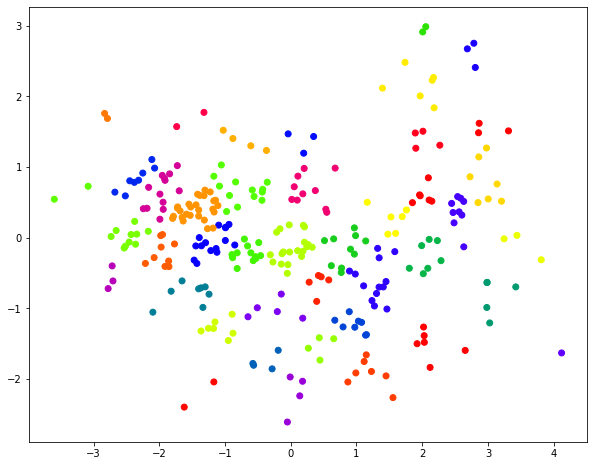

298
Cluster Size:43: Complete linkage: Silhouette score=0.3898, Calinski-Harabasz score=350.8717, Davies-Bouldin score=0.6550


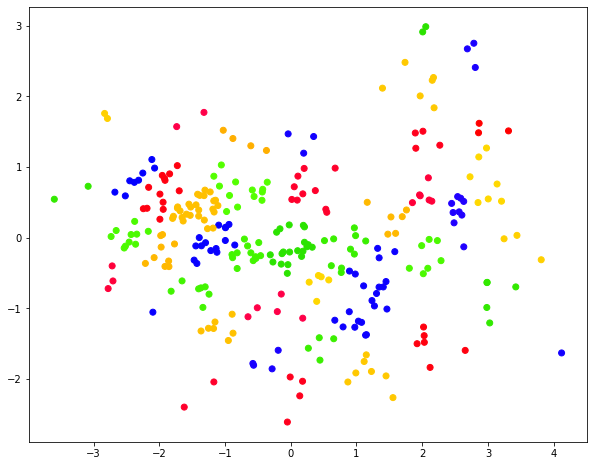

298
Cluster Size:44: Complete linkage: Silhouette score=0.3906, Calinski-Harabasz score=353.5825, Davies-Bouldin score=0.6801


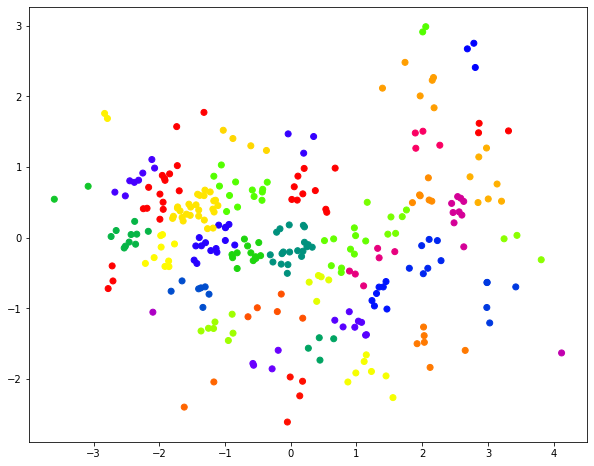

298
Cluster Size:45: Complete linkage: Silhouette score=0.3931, Calinski-Harabasz score=353.1158, Davies-Bouldin score=0.6763


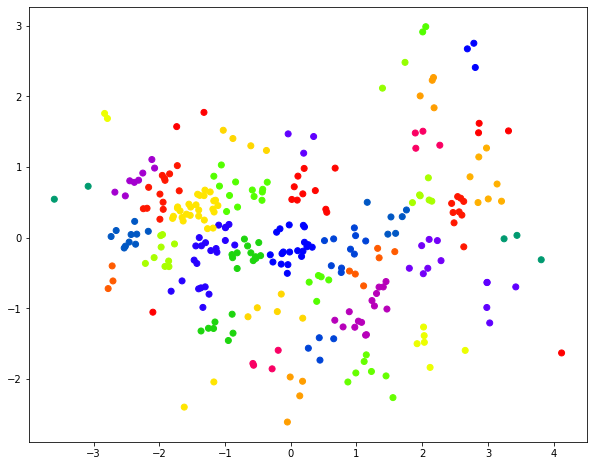

298
Cluster Size:46: Complete linkage: Silhouette score=0.3919, Calinski-Harabasz score=350.4125, Davies-Bouldin score=0.6742


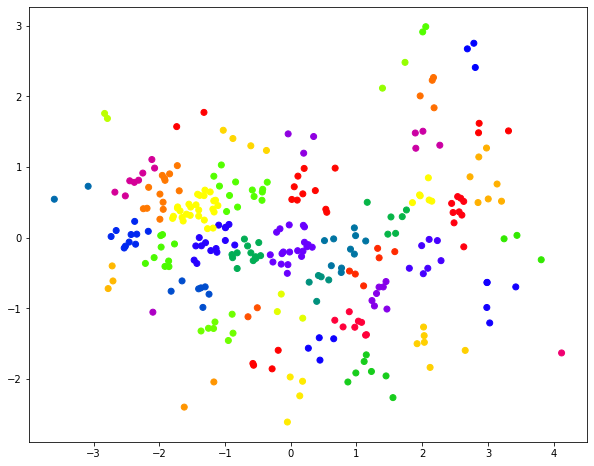

298
Cluster Size:47: Complete linkage: Silhouette score=0.3885, Calinski-Harabasz score=358.9094, Davies-Bouldin score=0.6724


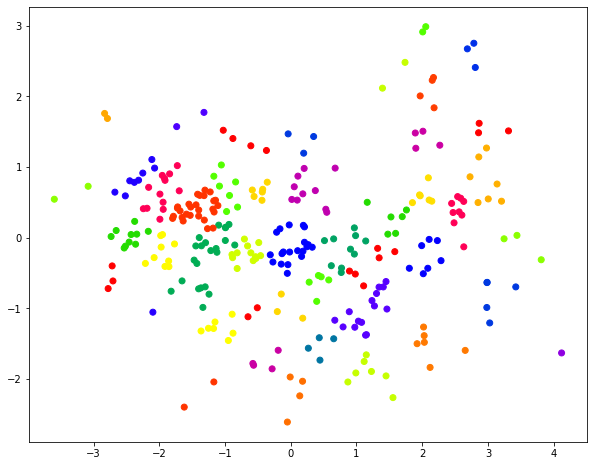

298
Cluster Size:48: Complete linkage: Silhouette score=0.3898, Calinski-Harabasz score=363.3389, Davies-Bouldin score=0.6628


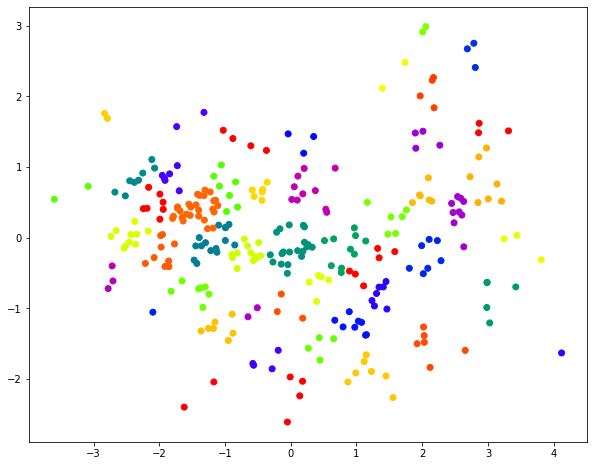

298
Cluster Size:49: Complete linkage: Silhouette score=0.3910, Calinski-Harabasz score=364.5732, Davies-Bouldin score=0.6723


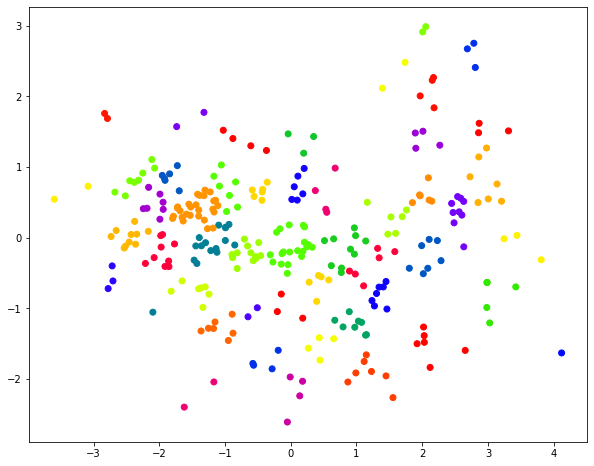

298
Cluster Size:50: Complete linkage: Silhouette score=0.3929, Calinski-Harabasz score=367.6180, Davies-Bouldin score=0.6696


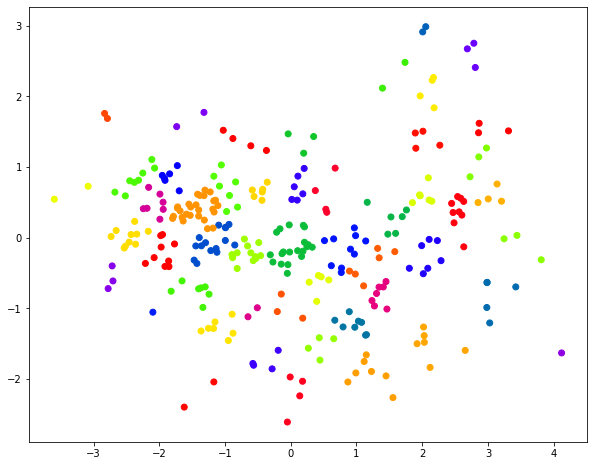

In [778]:
# tsne = TSNE(n_components=2, perplexity=30, random_state=0)
# Y = tsne.fit_transform(X)
for cnt in range(2,51):
    labels_complete = fcluster(Z_complete, cnt, criterion='maxclust')
    print(len(labels_single))
    # print(labels)
    # print(labels)
    score1 = silhouette_score(X, labels_complete)
#     print(score1)
    score2 = calinski_harabasz_score(X, labels_complete)
    score3 = davies_bouldin_score(X, labels_complete)
    print(f'Cluster Size:{cnt:.0f}: Complete linkage: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
    # cluster_size = {}
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=labels_complete, cmap='prism')
    graph_name = 'Complete_Cluster_Result_Plot'+str(score1)+'_'+str(cnt)
    plt.savefig('hierachical_structures_dendrogram/Complete/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
    plt.show()

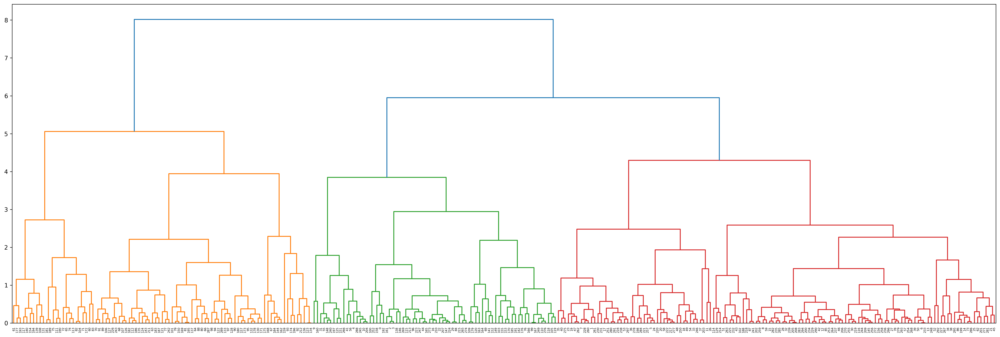

In [765]:
plt.figure(figsize=(30,10))
dendrogram(Z_complete)
fig = plt.gcf()
# fig.set_size_inches(10, 4)
fig.set_dpi(300)
# plt.show()
graph_name = 'Complete_linkage'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)

In [643]:
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
Y = tsne.fit_transform(X)

/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


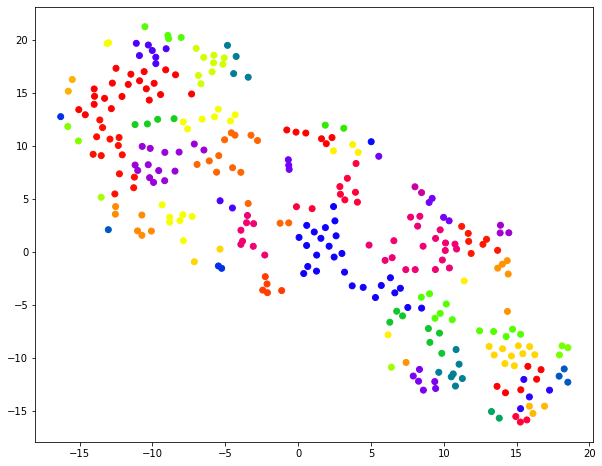

In [661]:
plt.figure(figsize=(10, 8))
plt.scatter(Y[:, 0], Y[:, 1], c=labels_complete, cmap='prism')
plt.show()

In [645]:
# cluster_size = {}
unique_labels, counts = np.unique(labels_complete, return_counts=True)

for label, count in zip(unique_labels, counts):
    print(f"Cluster {label} has size {count}")

Cluster 1 has size 8
Cluster 2 has size 2
Cluster 3 has size 2
Cluster 4 has size 1
Cluster 5 has size 14
Cluster 6 has size 13
Cluster 7 has size 7
Cluster 8 has size 4
Cluster 9 has size 16
Cluster 10 has size 9
Cluster 11 has size 6
Cluster 12 has size 1
Cluster 13 has size 1
Cluster 14 has size 8
Cluster 15 has size 6
Cluster 16 has size 3
Cluster 17 has size 2
Cluster 18 has size 1
Cluster 19 has size 8
Cluster 20 has size 14
Cluster 21 has size 9
Cluster 22 has size 4
Cluster 23 has size 9
Cluster 24 has size 13
Cluster 25 has size 2
Cluster 26 has size 4
Cluster 27 has size 2
Cluster 28 has size 2
Cluster 29 has size 5
Cluster 30 has size 9
Cluster 31 has size 2
Cluster 32 has size 4
Cluster 33 has size 3
Cluster 34 has size 3
Cluster 35 has size 3
Cluster 36 has size 3
Cluster 37 has size 3
Cluster 38 has size 7
Cluster 39 has size 2
Cluster 40 has size 7
Cluster 41 has size 10
Cluster 42 has size 19
Cluster 43 has size 6
Cluster 44 has size 1
Cluster 45 has size 7
Cluster 46 h

In [766]:
Z_groupAverage = linkage(X, 'average')
labels_groupAverage = fcluster(Z_groupAverage, t=3, criterion='maxclust')
# print(labels)
# print(labels)
score3=silhouette_score(X,  labels_groupAverage)
print(score3)

0.4321898810958323


[0.00455577 0.00716804 0.01505262 0.01644181 0.01772998 0.02464883
 0.02753619 0.02788496 0.02796429 0.02932336 0.0310057  0.03127207
 0.0322256  0.03233471 0.03526957 0.03632106 0.03796365 0.03879664
 0.04352823 0.04439688 0.04488388 0.04510381 0.04534365 0.04583831
 0.04918147 0.05136424 0.05235101 0.05272644 0.05425187 0.056626
 0.05856577 0.05971954 0.06077817 0.06141495 0.06224802 0.0627815
 0.06315041 0.064835   0.06712603 0.06821525 0.07004991 0.07023555
 0.07135878 0.0763268  0.07646156 0.07737867 0.07908879 0.08290048
 0.08297642 0.08333754 0.08483261 0.08508186 0.08528865 0.086451
 0.08701744 0.08769537 0.08775271 0.08937069 0.09023071 0.09095848
 0.09098031 0.09113909 0.09427843 0.09525968 0.09585455 0.09626126
 0.09706277 0.09750836 0.09785649 0.09921858 0.10081603 0.10198865
 0.10265877 0.10319749 0.10363379 0.10692462 0.10882861 0.10968681
 0.10971371 0.10985184 0.11165273 0.1124568  0.11297907 0.11386143
 0.11416751 0.1145505  0.11567058 0.11720925 0.11868368 0.11878963


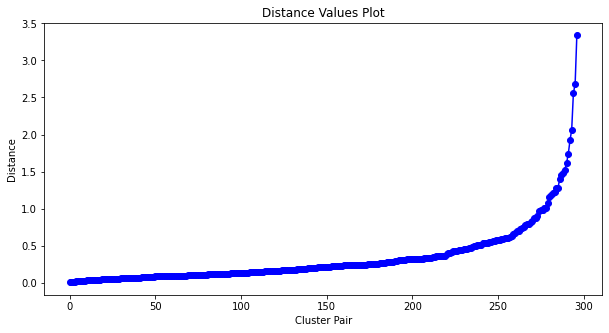

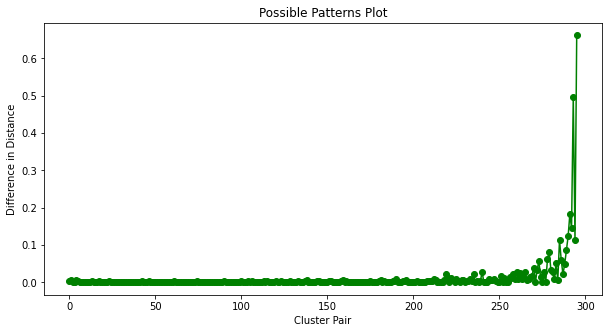

In [767]:
distance = Z_groupAverage[:, 2]
print(distance)

# 绘制距离值的变化图
plt.figure(figsize=(10, 5))
plt.title('Distance Values Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Distance')
plt.plot(distance, 'bo-')
graph_name = 'Group_Average_linkage_Distance_Values_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

# 识别距离值中的可能模式
diff = np.diff(distance)
plt.figure(figsize=(10, 5))
plt.title('Possible Patterns Plot')
plt.xlabel('Cluster Pair')
plt.ylabel('Difference in Distance')
plt.plot(diff, 'go-')
graph_name = 'Group_Average_linkage_Possible_Patterns_Plot'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
plt.show()

298
Cluster Size: 2: Group Average linkage: Silhouette score=0.4724, Calinski-Harabasz score=341.6472, Davies-Bouldin score=0.8128


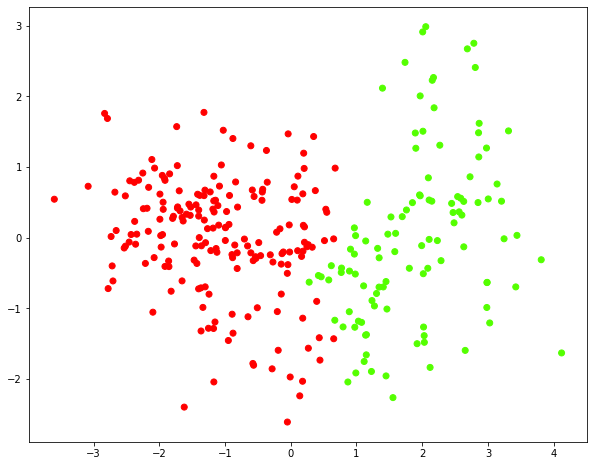

298
Cluster Size: 3: Group Average linkage: Silhouette score=0.4322, Calinski-Harabasz score=244.8449, Davies-Bouldin score=0.7424


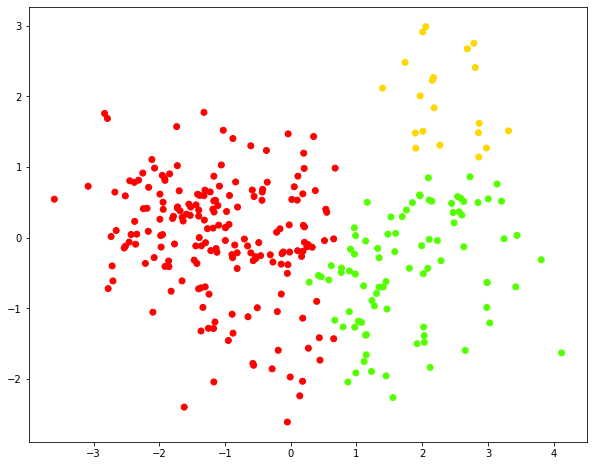

298
Cluster Size: 4: Group Average linkage: Silhouette score=0.2913, Calinski-Harabasz score=176.7059, Davies-Bouldin score=0.7391


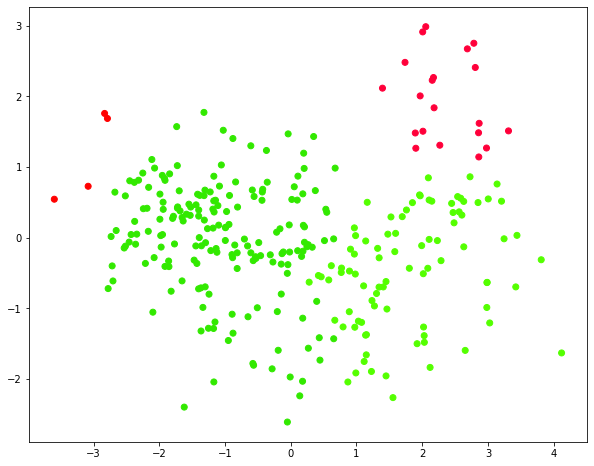

298
Cluster Size: 5: Group Average linkage: Silhouette score=0.2767, Calinski-Harabasz score=185.5682, Davies-Bouldin score=0.8426


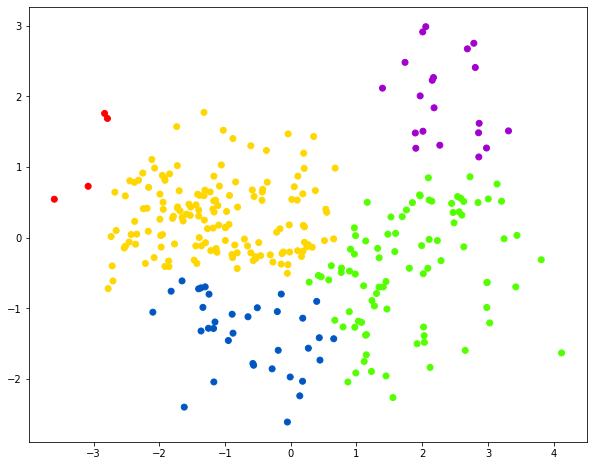

298
Cluster Size: 6: Group Average linkage: Silhouette score=0.2823, Calinski-Harabasz score=195.6333, Davies-Bouldin score=0.8841


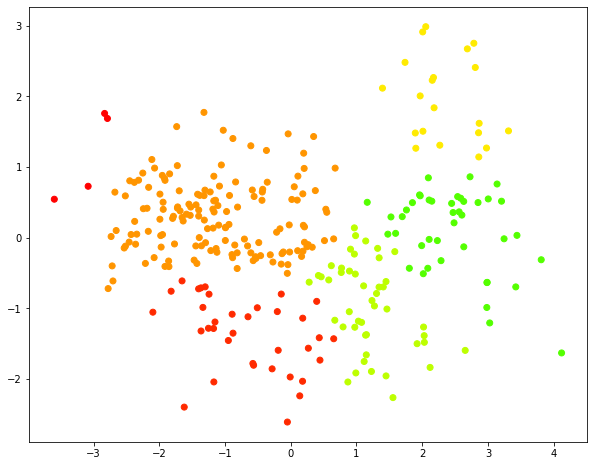

298
Cluster Size: 7: Group Average linkage: Silhouette score=0.3298, Calinski-Harabasz score=253.1818, Davies-Bouldin score=0.8497


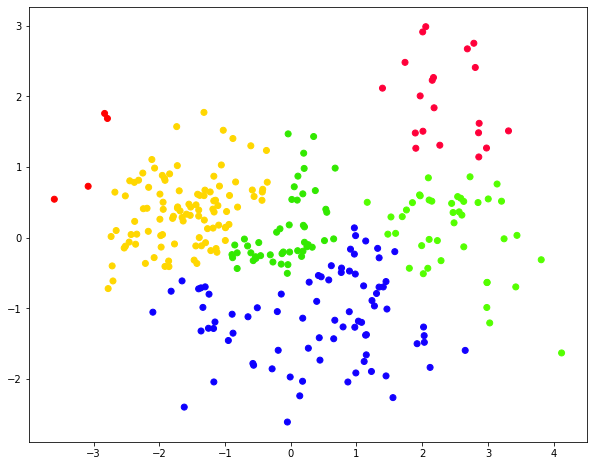

298
Cluster Size: 8: Group Average linkage: Silhouette score=0.3313, Calinski-Harabasz score=239.6459, Davies-Bouldin score=0.8142


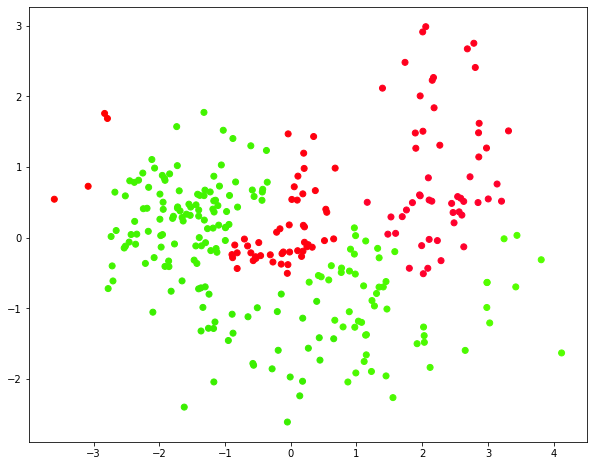

298
Cluster Size: 9: Group Average linkage: Silhouette score=0.3197, Calinski-Harabasz score=235.6495, Davies-Bouldin score=0.8211


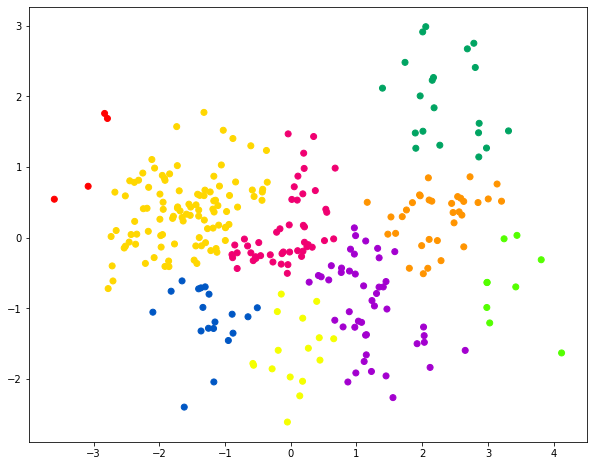

298
Cluster Size: 10: Group Average linkage: Silhouette score=0.2966, Calinski-Harabasz score=214.3021, Davies-Bouldin score=0.8045


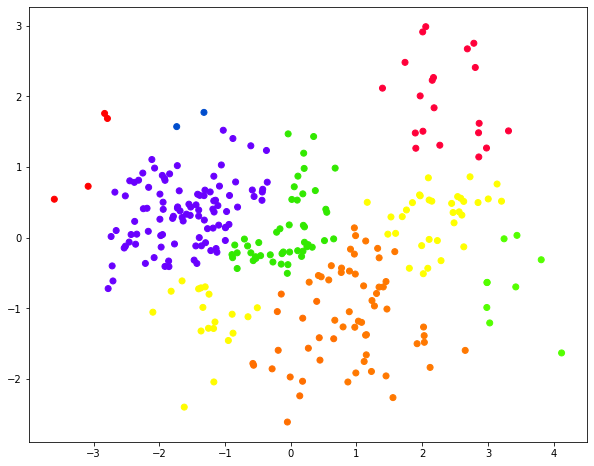

298
Cluster Size: 11: Group Average linkage: Silhouette score=0.2908, Calinski-Harabasz score=194.7936, Davies-Bouldin score=0.7640


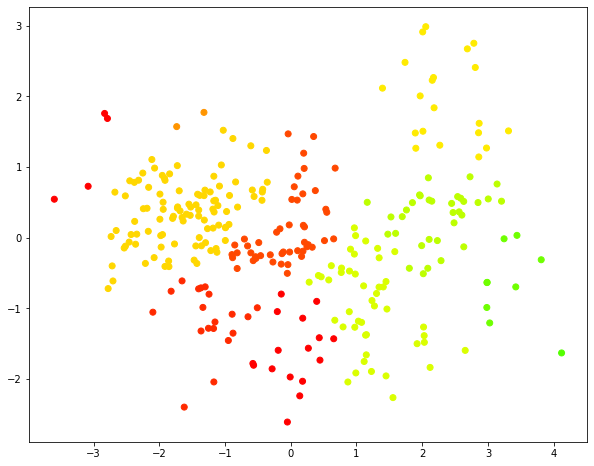

298
Cluster Size: 12: Group Average linkage: Silhouette score=0.2998, Calinski-Harabasz score=198.3958, Davies-Bouldin score=0.7479


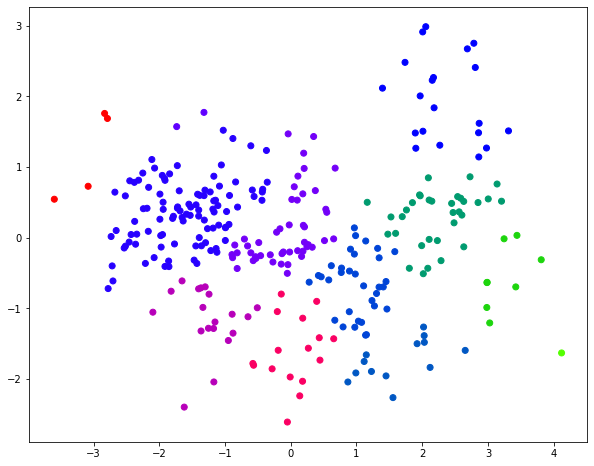

298
Cluster Size: 13: Group Average linkage: Silhouette score=0.2915, Calinski-Harabasz score=185.3390, Davies-Bouldin score=0.7357


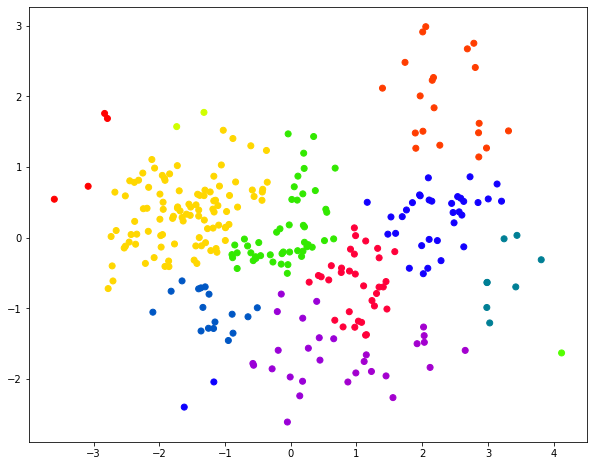

298
Cluster Size: 14: Group Average linkage: Silhouette score=0.2797, Calinski-Harabasz score=177.7511, Davies-Bouldin score=0.7352


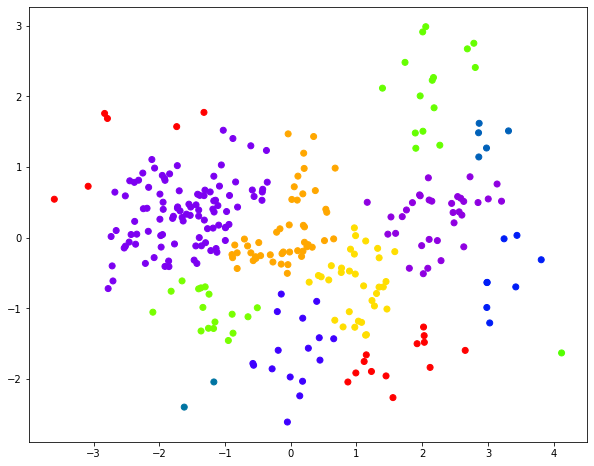

298
Cluster Size: 15: Group Average linkage: Silhouette score=0.2735, Calinski-Harabasz score=166.6610, Davies-Bouldin score=0.6970


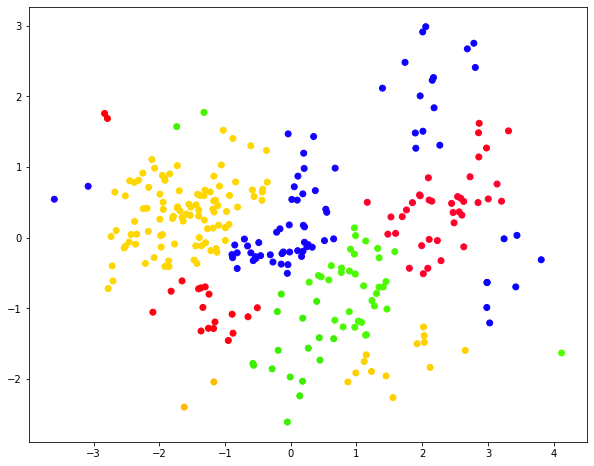

298
Cluster Size: 16: Group Average linkage: Silhouette score=0.3088, Calinski-Harabasz score=200.0434, Davies-Bouldin score=0.7299


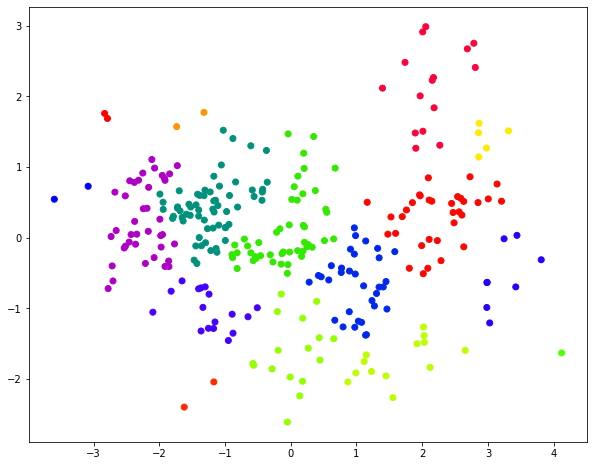

298
Cluster Size: 17: Group Average linkage: Silhouette score=0.3212, Calinski-Harabasz score=213.6565, Davies-Bouldin score=0.7208


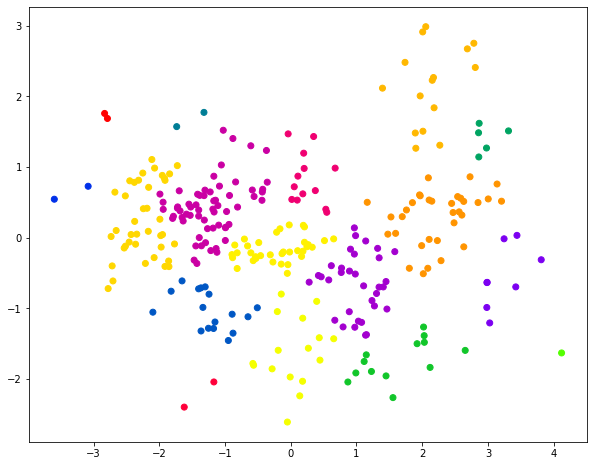

298
Cluster Size: 18: Group Average linkage: Silhouette score=0.3249, Calinski-Harabasz score=209.5305, Davies-Bouldin score=0.7238


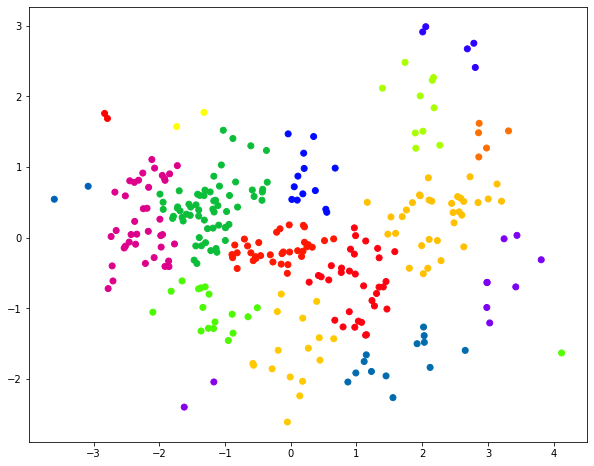

298
Cluster Size: 19: Group Average linkage: Silhouette score=0.3235, Calinski-Harabasz score=206.2172, Davies-Bouldin score=0.7007


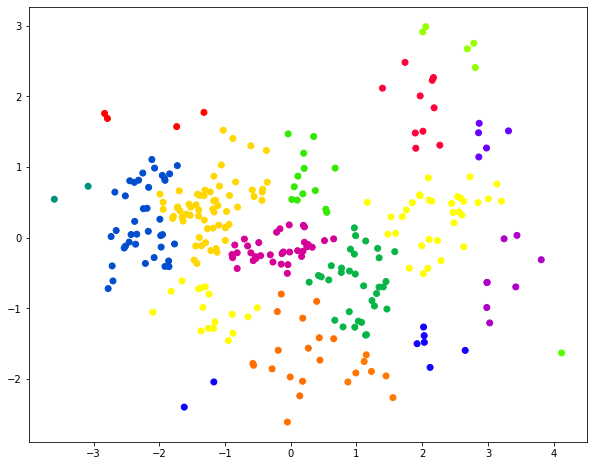

298
Cluster Size: 20: Group Average linkage: Silhouette score=0.3340, Calinski-Harabasz score=222.2344, Davies-Bouldin score=0.7159


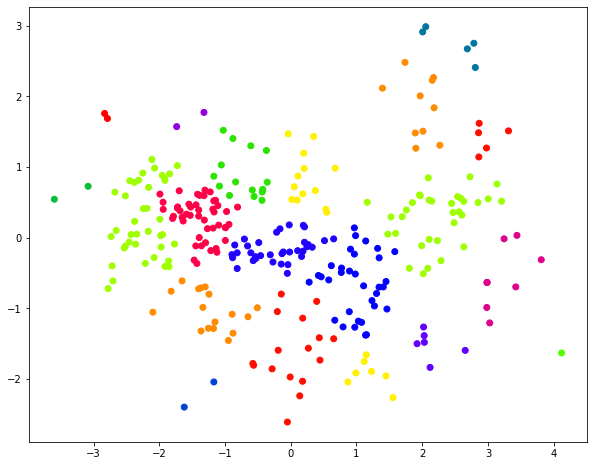

298
Cluster Size: 21: Group Average linkage: Silhouette score=0.3559, Calinski-Harabasz score=239.6775, Davies-Bouldin score=0.6797


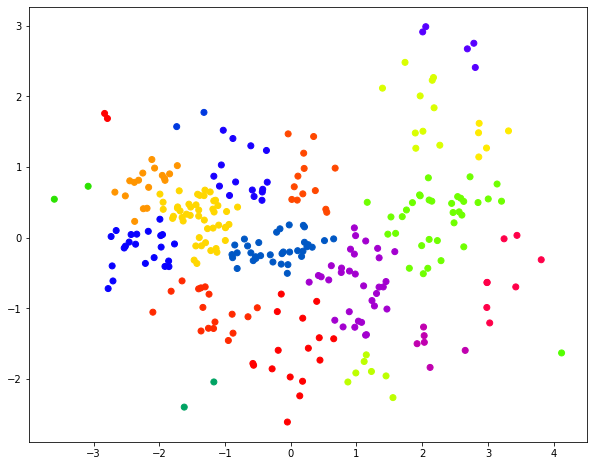

298
Cluster Size: 22: Group Average linkage: Silhouette score=0.3588, Calinski-Harabasz score=252.2475, Davies-Bouldin score=0.6870


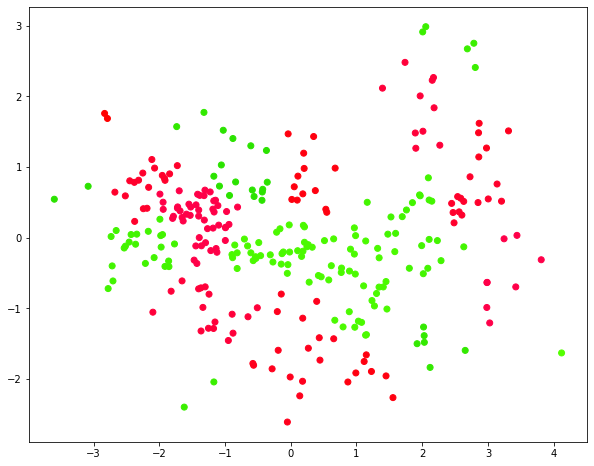

298
Cluster Size: 23: Group Average linkage: Silhouette score=0.3604, Calinski-Harabasz score=253.3778, Davies-Bouldin score=0.7020


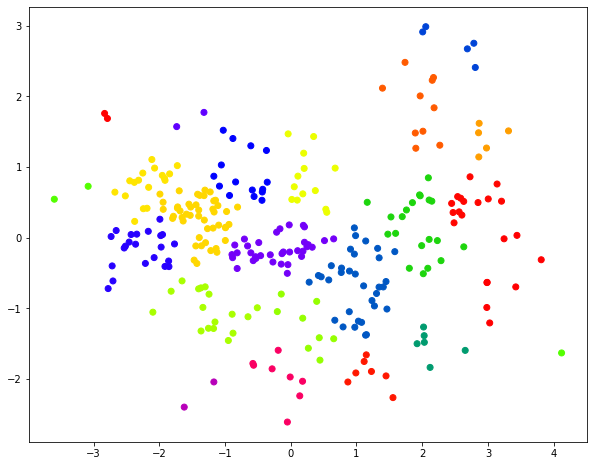

298
Cluster Size: 24: Group Average linkage: Silhouette score=0.3488, Calinski-Harabasz score=245.2516, Davies-Bouldin score=0.6895


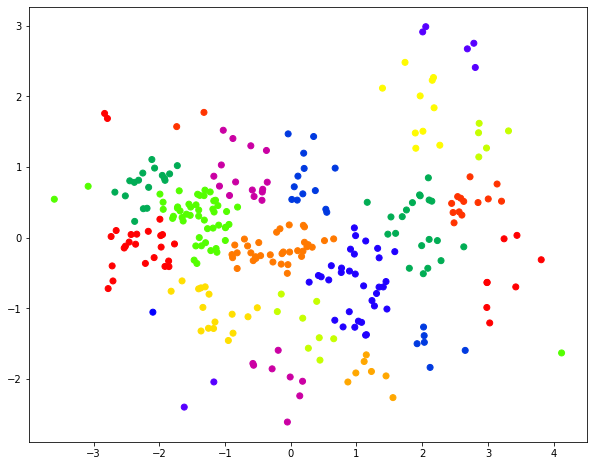

298
Cluster Size: 25: Group Average linkage: Silhouette score=0.3513, Calinski-Harabasz score=240.5418, Davies-Bouldin score=0.6825


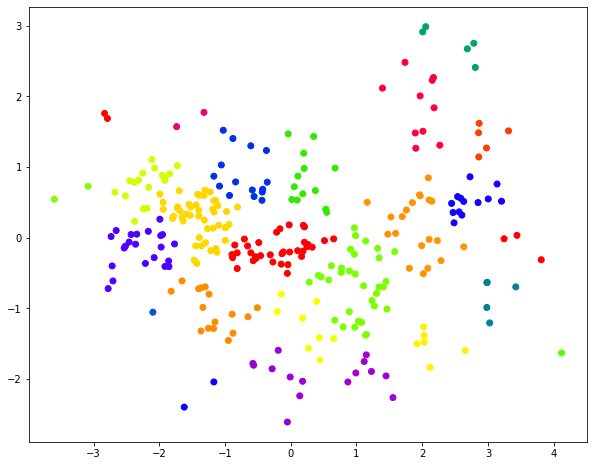

298
Cluster Size: 26: Group Average linkage: Silhouette score=0.3593, Calinski-Harabasz score=244.3557, Davies-Bouldin score=0.6726


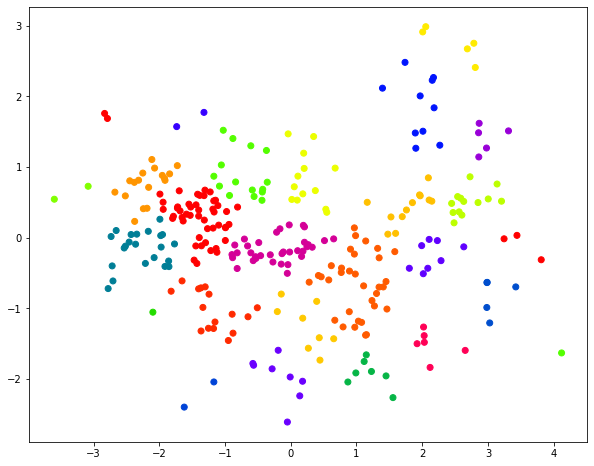

298
Cluster Size: 27: Group Average linkage: Silhouette score=0.3690, Calinski-Harabasz score=258.9328, Davies-Bouldin score=0.6830


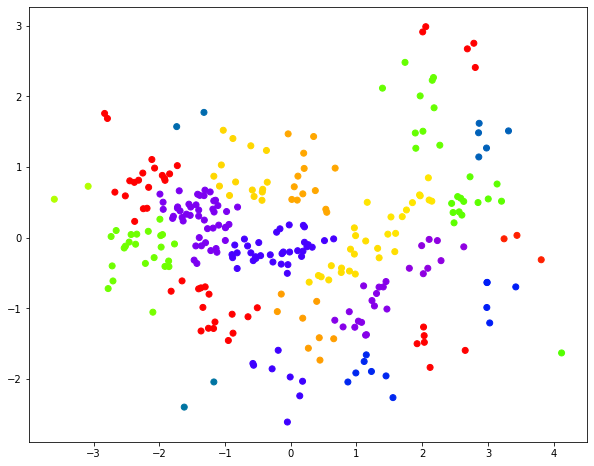

298
Cluster Size: 28: Group Average linkage: Silhouette score=0.3713, Calinski-Harabasz score=257.0309, Davies-Bouldin score=0.6853


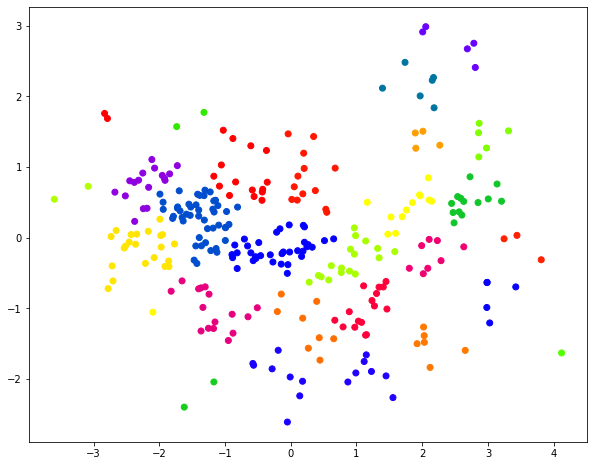

298
Cluster Size: 29: Group Average linkage: Silhouette score=0.3767, Calinski-Harabasz score=251.6759, Davies-Bouldin score=0.6547


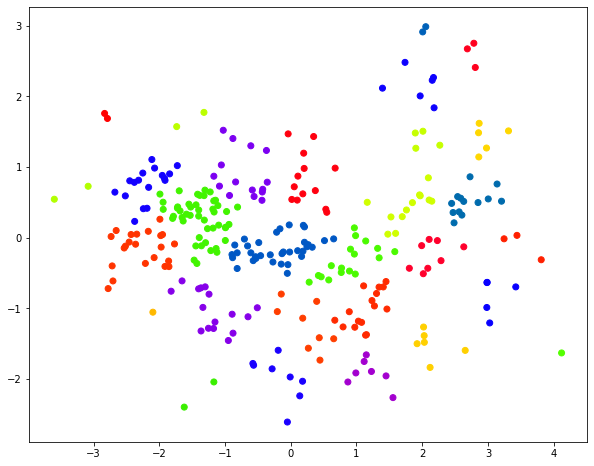

298
Cluster Size: 30: Group Average linkage: Silhouette score=0.3697, Calinski-Harabasz score=247.8351, Davies-Bouldin score=0.6524


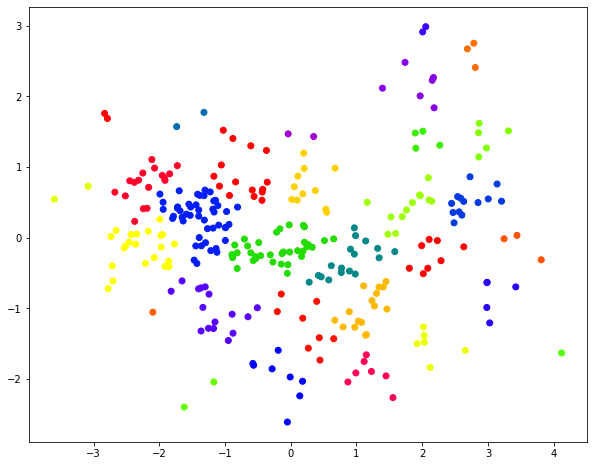

298
Cluster Size: 31: Group Average linkage: Silhouette score=0.3669, Calinski-Harabasz score=270.3807, Davies-Bouldin score=0.6527


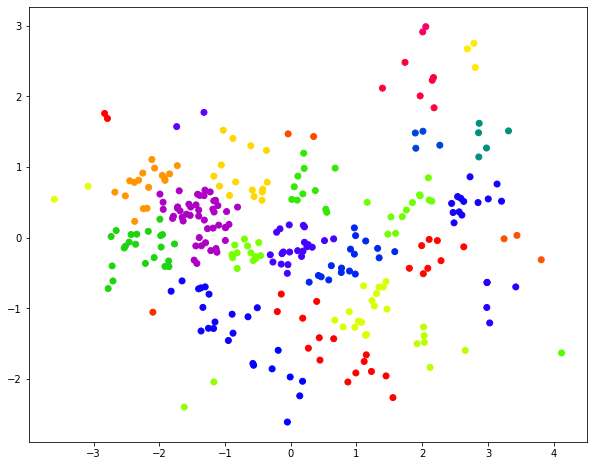

298
Cluster Size: 32: Group Average linkage: Silhouette score=0.3682, Calinski-Harabasz score=271.0232, Davies-Bouldin score=0.6525


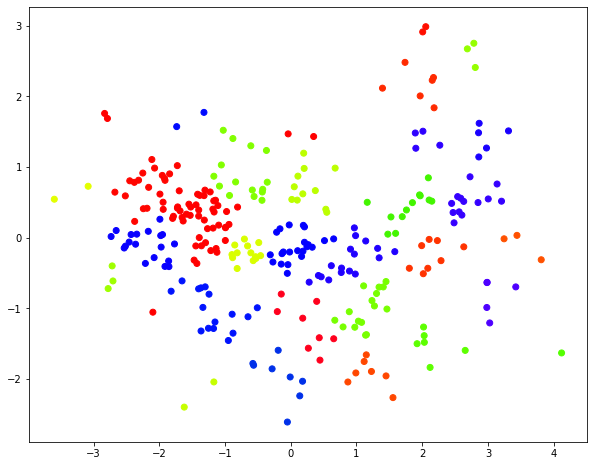

298
Cluster Size: 33: Group Average linkage: Silhouette score=0.3691, Calinski-Harabasz score=271.3103, Davies-Bouldin score=0.6577


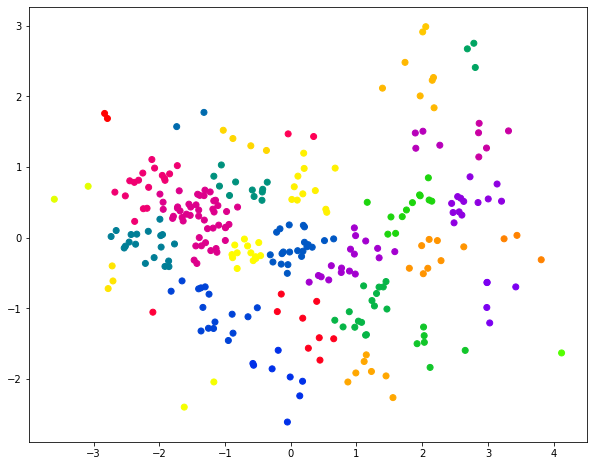

298
Cluster Size: 34: Group Average linkage: Silhouette score=0.3644, Calinski-Harabasz score=269.8791, Davies-Bouldin score=0.6474


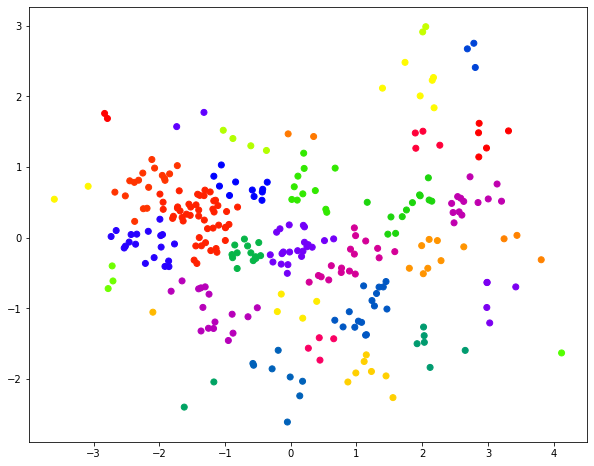

298
Cluster Size: 35: Group Average linkage: Silhouette score=0.3657, Calinski-Harabasz score=276.0497, Davies-Bouldin score=0.6490


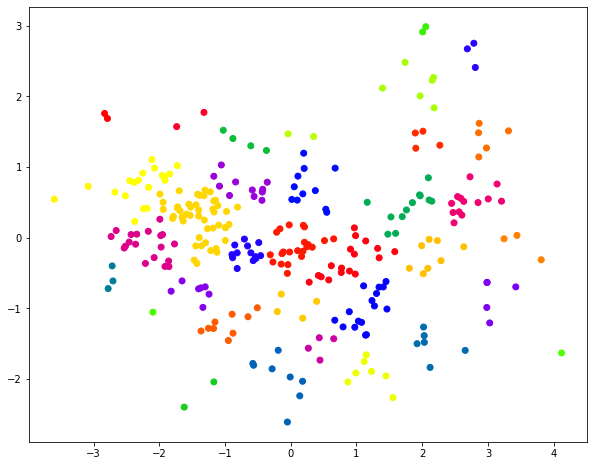

298
Cluster Size: 36: Group Average linkage: Silhouette score=0.3697, Calinski-Harabasz score=274.8676, Davies-Bouldin score=0.6454


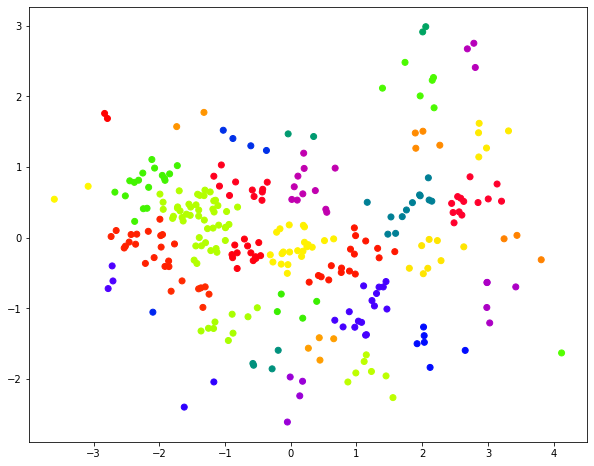

298
Cluster Size: 37: Group Average linkage: Silhouette score=0.3700, Calinski-Harabasz score=283.3564, Davies-Bouldin score=0.6352


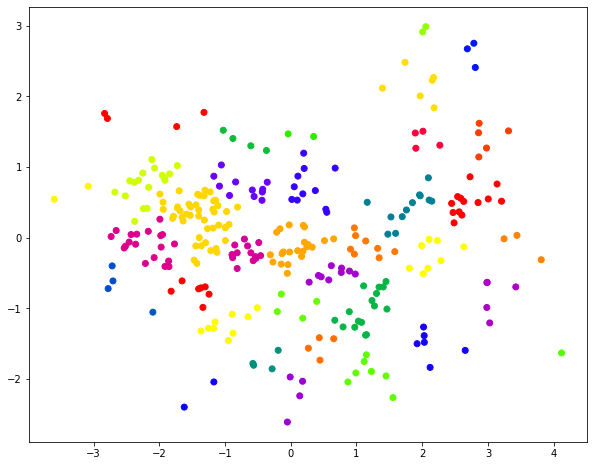

298
Cluster Size: 38: Group Average linkage: Silhouette score=0.3658, Calinski-Harabasz score=278.0325, Davies-Bouldin score=0.6254


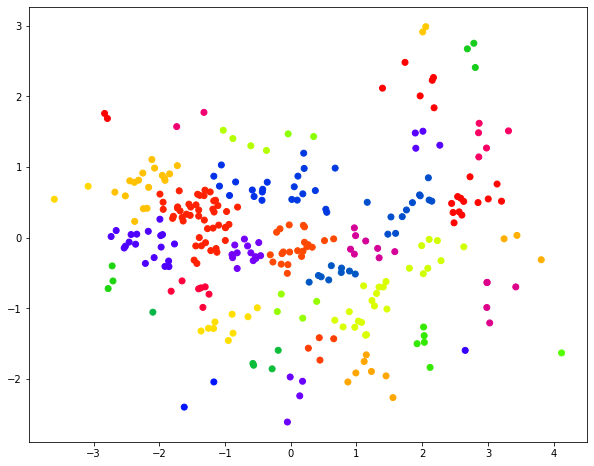

298
Cluster Size: 39: Group Average linkage: Silhouette score=0.3682, Calinski-Harabasz score=274.3379, Davies-Bouldin score=0.6224


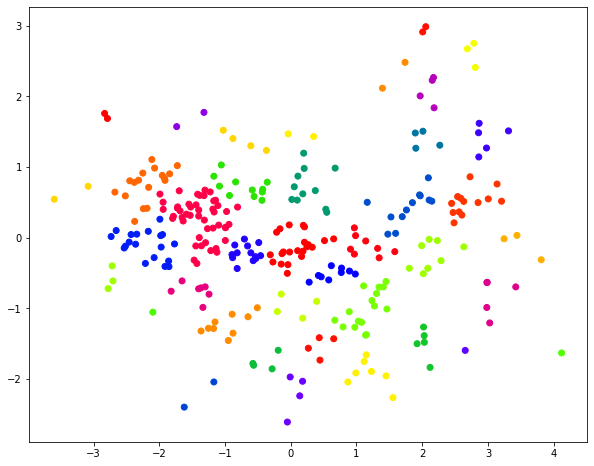

298
Cluster Size: 40: Group Average linkage: Silhouette score=0.3780, Calinski-Harabasz score=304.2839, Davies-Bouldin score=0.6386


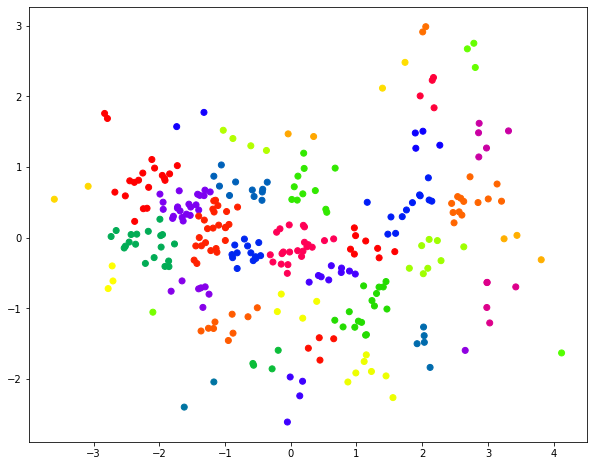

298
Cluster Size: 41: Group Average linkage: Silhouette score=0.3785, Calinski-Harabasz score=309.0064, Davies-Bouldin score=0.6395


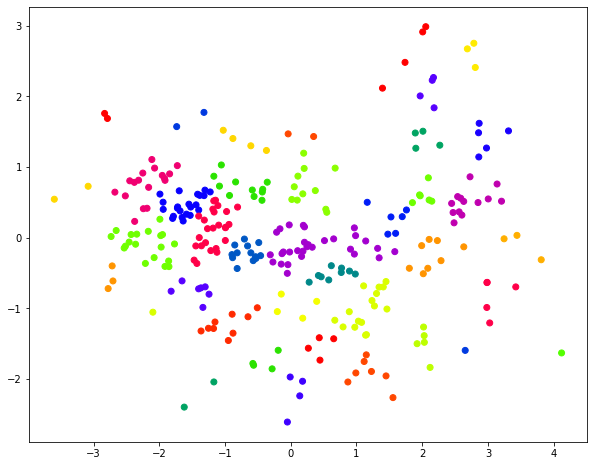

298
Cluster Size: 42: Group Average linkage: Silhouette score=0.3744, Calinski-Harabasz score=303.7460, Davies-Bouldin score=0.6352


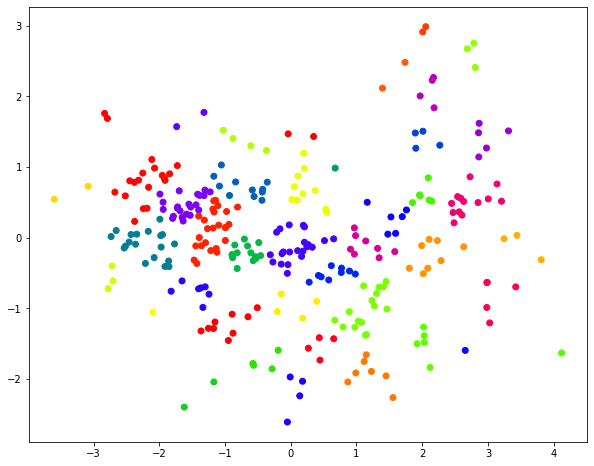

298
Cluster Size: 43: Group Average linkage: Silhouette score=0.3836, Calinski-Harabasz score=313.2310, Davies-Bouldin score=0.6279


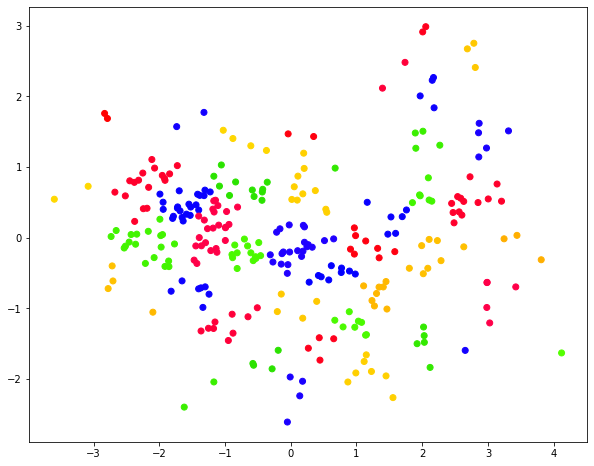

298
Cluster Size: 44: Group Average linkage: Silhouette score=0.3763, Calinski-Harabasz score=308.9521, Davies-Bouldin score=0.6228


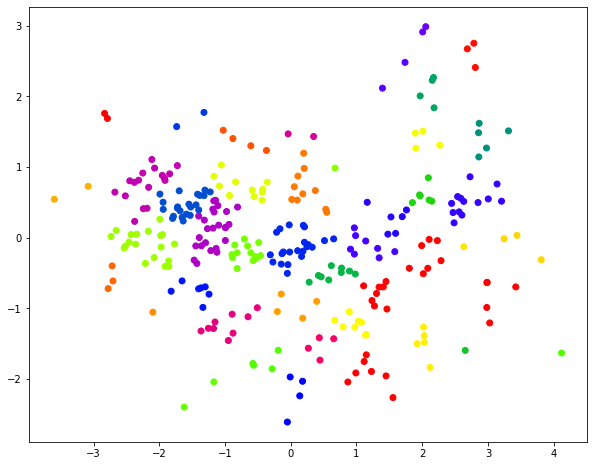

298
Cluster Size: 45: Group Average linkage: Silhouette score=0.3752, Calinski-Harabasz score=314.0136, Davies-Bouldin score=0.6131


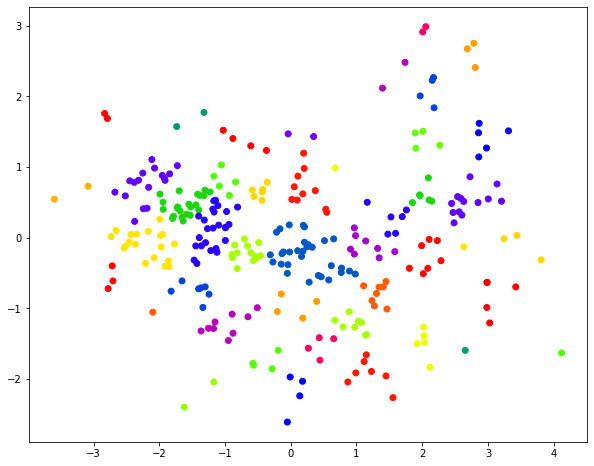

298
Cluster Size: 46: Group Average linkage: Silhouette score=0.3835, Calinski-Harabasz score=327.7971, Davies-Bouldin score=0.6087


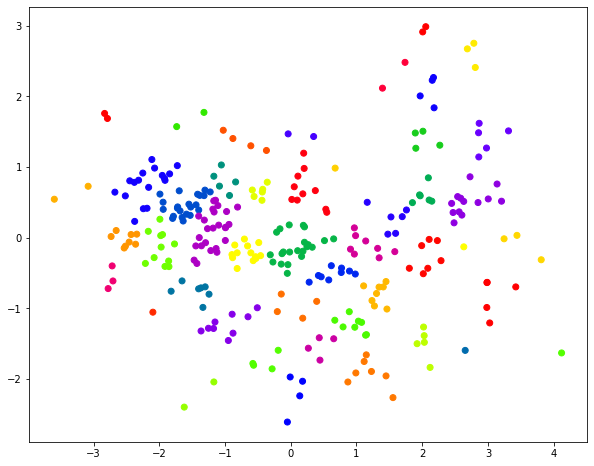

298
Cluster Size: 47: Group Average linkage: Silhouette score=0.3842, Calinski-Harabasz score=327.6765, Davies-Bouldin score=0.6005


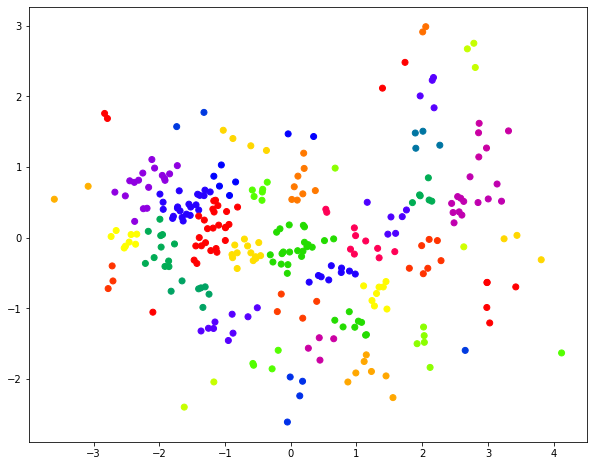

298
Cluster Size: 48: Group Average linkage: Silhouette score=0.3809, Calinski-Harabasz score=322.3192, Davies-Bouldin score=0.5883


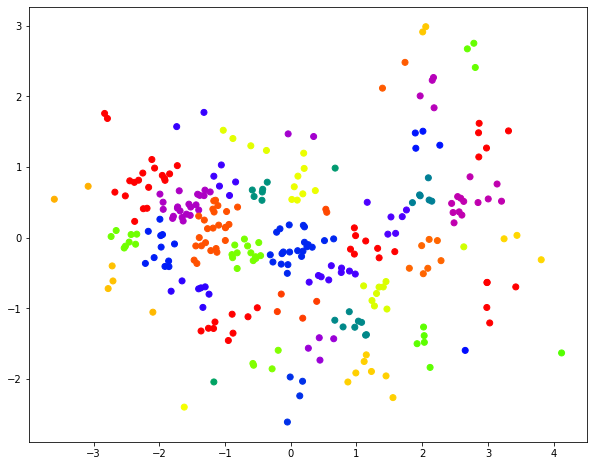

298
Cluster Size: 49: Group Average linkage: Silhouette score=0.3792, Calinski-Harabasz score=318.0797, Davies-Bouldin score=0.5750


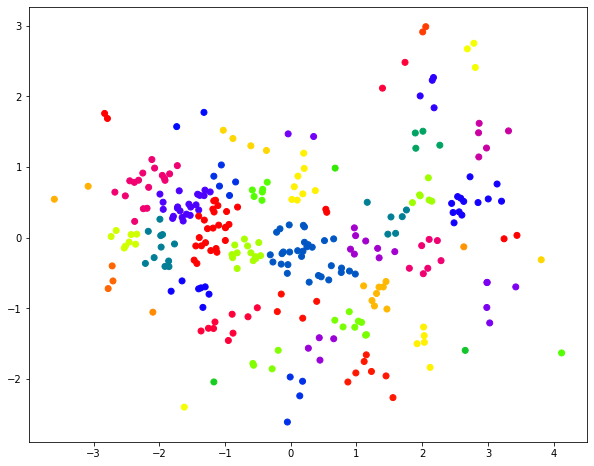

298
Cluster Size: 50: Group Average linkage: Silhouette score=0.3818, Calinski-Harabasz score=330.6535, Davies-Bouldin score=0.5765


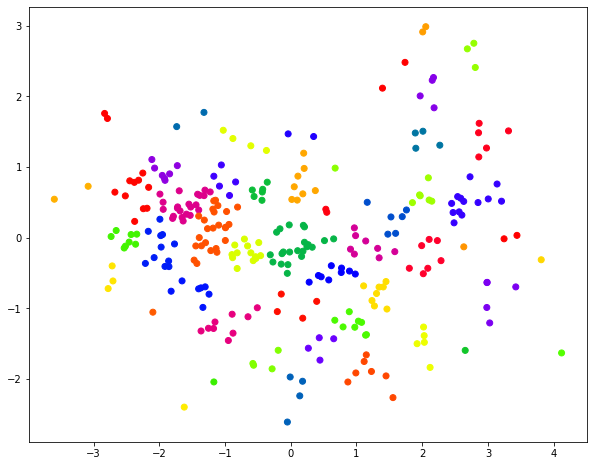

In [779]:
# tsne = TSNE(n_components=2, perplexity=30, random_state=0)
# Y = tsne.fit_transform(X)
for cnt in range(2,51):
    labels_average = fcluster(Z_groupAverage, cnt, criterion='maxclust')
    print(len(labels_average))
    # print(labels)
    # print(labels)
    score1 = silhouette_score(X, labels_average)
#     print(score1)
    score2 = calinski_harabasz_score(X, labels_average)
    score3 = davies_bouldin_score(X, labels_average)
    print(f'Cluster Size: {cnt:.0f}: Group Average linkage: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
    # cluster_size = {}
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=labels_average, cmap='prism')
    graph_name = 'GroupAverage_Cluster_Result_Plot'+str(score1)+'_'+str(cnt)
    plt.savefig('hierachical_structures_dendrogram/GroupAverage/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
    plt.show()

In [648]:
print(X)

[[-1.44344043e-01 -7.96902486e-01  1.52385077e+00]
 [-2.21137914e+00 -3.63178493e-01  4.33420939e-01]
 [ 4.21006259e-01 -5.34189849e-01  8.67032510e-01]
 [ 4.62964114e-01 -5.52647602e-01  1.33607781e+00]
 [-1.33628246e+00 -9.85419895e-01  3.86862203e-01]
 [-2.31503047e+00  8.14229380e-01  2.76067636e-02]
 [-9.93850542e-01  1.42131344e-01  1.59169155e-01]
 [-1.85768391e+00 -3.29103114e-01  1.82298921e-01]
 [-1.44061775e+00  4.65617757e-01 -1.36702928e-01]
 [-1.62032259e+00 -2.39624832e+00  1.15056449e+00]
 [-1.40154378e+00 -7.22760019e-01  6.46283538e-01]
 [-3.08216285e+00  7.28498861e-01  1.19897200e+00]
 [-1.17108329e+00  5.21839339e-01  6.36792593e-01]
 [-9.95219073e-01 -3.86104471e-02  1.07537173e+00]
 [-4.37528252e-01  5.30039350e-01  8.42994804e-01]
 [-1.65240415e+00  2.87249058e-01 -8.21296289e-02]
 [ 1.85923378e-01 -1.90566201e-01  4.46130835e-01]
 [-2.65581011e+00  1.02300382e-01 -8.05674785e-01]
 [-2.18613562e+00  4.17132331e-01  2.55959754e-01]
 [-1.97166752e+00 -1.32058468e-

In [649]:
print(Z_groupAverage)

[[9.90000000e+01 1.67000000e+02 4.47123193e-02 2.00000000e+00]
 [2.17000000e+02 2.22000000e+02 5.77723980e-02 2.00000000e+00]
 [1.12000000e+02 1.86000000e+02 6.61449648e-02 2.00000000e+00]
 ...
 [5.86000000e+02 5.90000000e+02 2.76680697e+00 1.18000000e+02]
 [5.64000000e+02 5.91000000e+02 2.83856457e+00 1.80000000e+02]
 [5.92000000e+02 5.93000000e+02 3.49884984e+00 2.98000000e+02]]


In [650]:
print(labels_groupAverage)

[3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 3 1 1 1 1 1 1 1 1 1 1 3
 1 1 1 1 3 1 1 1 1 1 3 3 3 3 1 1 1 1 1 1 1 1 3 1 1 1 3 1 3 1 1 1 1 1 1 2 1
 1 1 1 3 3 3 1 1 1 1 1 1 1 1 3 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 3 1 3
 3 1 1 3 1 1 1 1 3 1 1 1 3 1 1 3 3 3 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1
 1 1 1 3 1 1 1 3 1 1 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 3 3 3 3 3 3 3 3 3
 3 3 1 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 1 1 3 2 3 3 3 1 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3 3 3 3 3 3 3 3 3 1 3 1 3 3 3 3 3 3
 3 3]


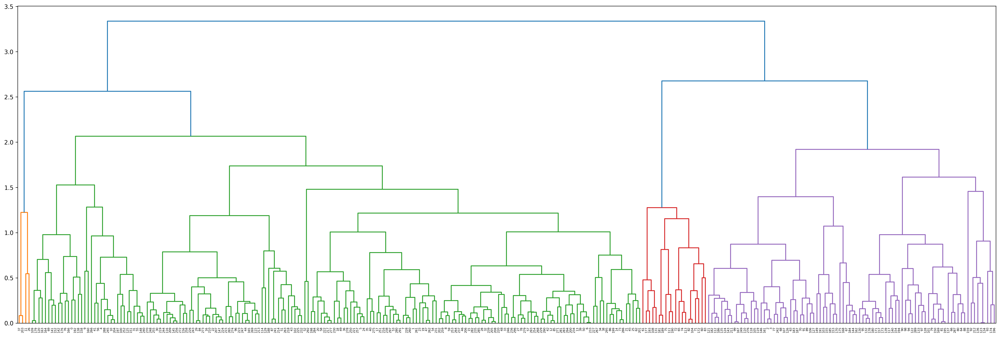

In [769]:
plt.figure(figsize=(30,10))
dendrogram(Z_groupAverage)
fig = plt.gcf()
# fig.set_size_inches(10, 4)
fig.set_dpi(300)
# plt.show()
graph_name = 'Group_Average_linkage'
plt.savefig('hierachical_structures_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)

In [652]:
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
Y = tsne.fit_transform(X)

/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


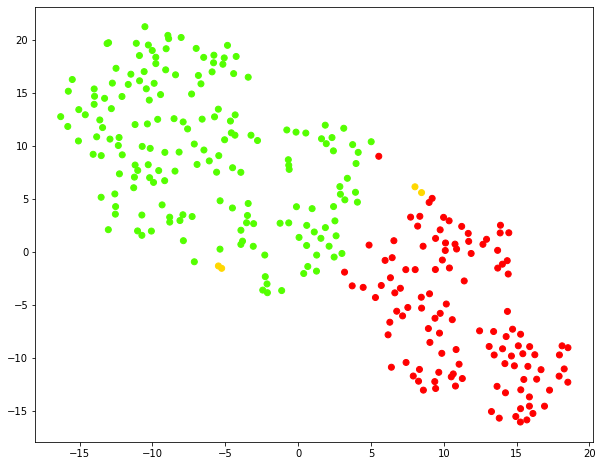

In [653]:
plt.figure(figsize=(10, 8))
plt.scatter(Y[:, 0], Y[:, 1], c=labels_groupAverage, cmap='prism')
plt.show()

In [770]:
# cluster_size = {}
unique_labels, counts = np.unique(labels_groupAverage, return_counts=True)

for label, count in zip(unique_labels, counts):
    print(f"Cluster {label} has size {count}")

Cluster 1 has size 190
Cluster 2 has size 20
Cluster 3 has size 88


single linkage: Silhouette score=0.0891, Calinski-Harabasz score=5.5548, Davies-Bouldin score=0.4891
Cluster 1 has size 2
Cluster 2 has size 295
Cluster 3 has size 1


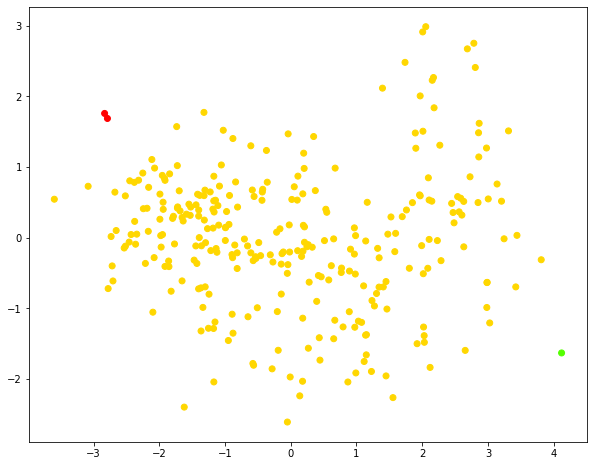

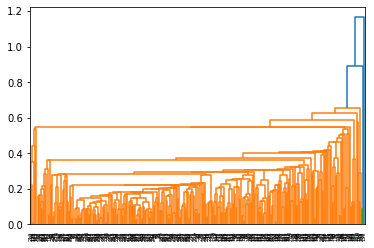

complete linkage: Silhouette score=0.3625, Calinski-Harabasz score=282.3412, Davies-Bouldin score=0.9525
Cluster 1 has size 91
Cluster 2 has size 74
Cluster 3 has size 133


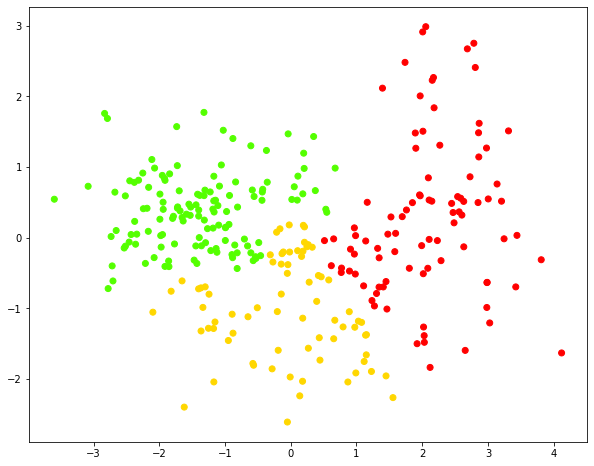

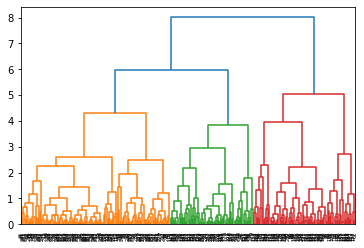

average linkage: Silhouette score=0.4322, Calinski-Harabasz score=244.8449, Davies-Bouldin score=0.7424
Cluster 1 has size 190
Cluster 2 has size 20
Cluster 3 has size 88


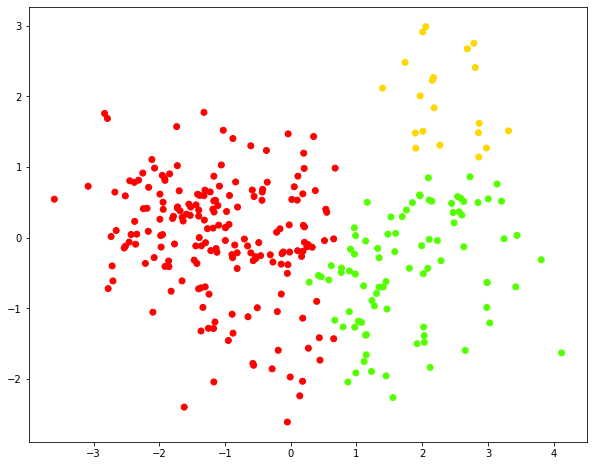

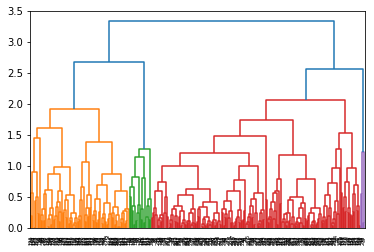

In [771]:

import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


data_scaled = X
methods = ['single', 'complete', 'average']
for method in methods:
    linked = linkage(data_scaled, method=method)
#     labels = pd.DataFrame(linked).iloc[:, :2].values
#     print(labels)
    labels = fcluster(linked, t=3, criterion='maxclust')
    
#     print(labels)
    score1 = silhouette_score(data_scaled, labels)
#     print(score1)
    score2 = calinski_harabasz_score(data_scaled, labels)
    score3 = davies_bouldin_score(data_scaled, labels)
    print(f'{method} linkage: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
    # cluster_size = {}
    unique_labels, counts = np.unique(labels, return_counts=True)

    for label, count in zip(unique_labels, counts):
        print(f"Cluster {label} has size {count}")
    plt.figure(figsize=(10, 8))
    plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='prism')
    plt.show()

    dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)

    plt.show()


In [656]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

In [693]:
tsne = TSNE(n_components=2, perplexity=30, random_state=0)
Y = tsne.fit_transform(X)

/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/Users/luopeiyuan/opt/anaconda3/envs/CS3481-HW1/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


Num of Clusters: 2 Silhouette score: 0.47361113435090374
KMeans Clustering with 2-clusters: Silhouette score=0.4736, Calinski-Harabasz score=354.4450, Davies-Bouldin score=0.6696


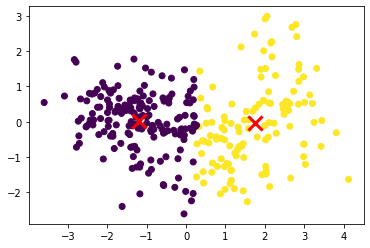

Num of Clusters: 3 Silhouette score: 0.4246047586390117
KMeans Clustering with 3-clusters: Silhouette score=0.4246, Calinski-Harabasz score=344.3625, Davies-Bouldin score=0.6696


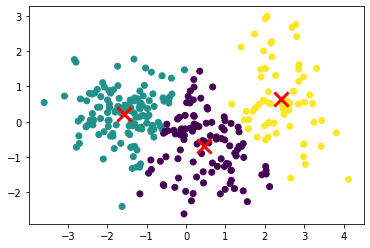

Num of Clusters: 4 Silhouette score: 0.3614876850868266
KMeans Clustering with 4-clusters: Silhouette score=0.3615, Calinski-Harabasz score=312.8797, Davies-Bouldin score=0.6696


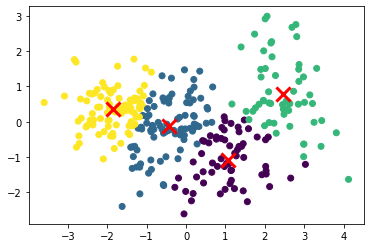

Num of Clusters: 5 Silhouette score: 0.3915227026310644
KMeans Clustering with 5-clusters: Silhouette score=0.3915, Calinski-Harabasz score=305.6548, Davies-Bouldin score=0.6696


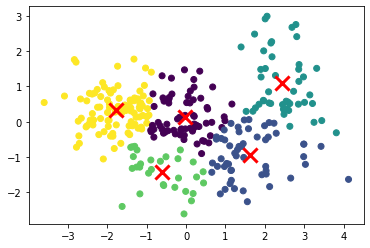

Num of Clusters: 6 Silhouette score: 0.3865544107723829
KMeans Clustering with 6-clusters: Silhouette score=0.3866, Calinski-Harabasz score=313.1328, Davies-Bouldin score=0.6696


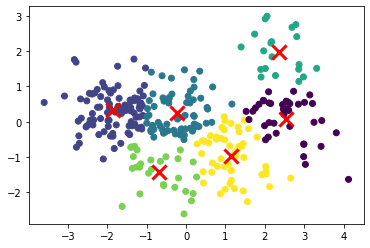

Num of Clusters: 7 Silhouette score: 0.3693632056716611
KMeans Clustering with 7-clusters: Silhouette score=0.3694, Calinski-Harabasz score=317.1067, Davies-Bouldin score=0.6696


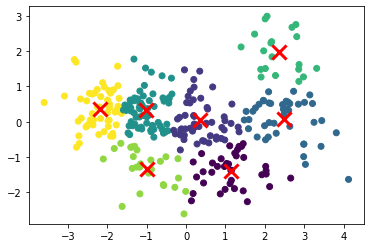

Num of Clusters: 8 Silhouette score: 0.36981588871153115
KMeans Clustering with 8-clusters: Silhouette score=0.3698, Calinski-Harabasz score=307.6420, Davies-Bouldin score=0.6696


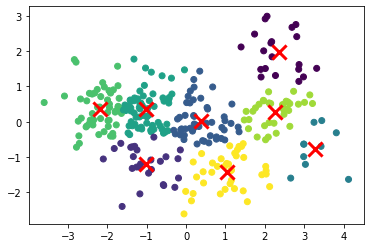

Num of Clusters: 9 Silhouette score: 0.369793049020875
KMeans Clustering with 9-clusters: Silhouette score=0.3698, Calinski-Harabasz score=311.3177, Davies-Bouldin score=0.6696


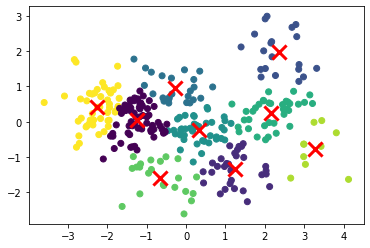

Num of Clusters: 10 Silhouette score: 0.371693252209168
KMeans Clustering with 10-clusters: Silhouette score=0.3717, Calinski-Harabasz score=305.3422, Davies-Bouldin score=0.6696


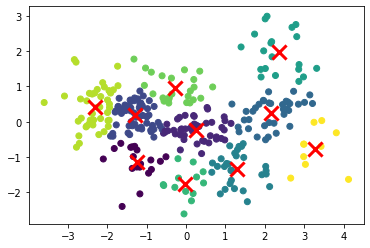

Num of Clusters: 11 Silhouette score: 0.3731533086695158
KMeans Clustering with 11-clusters: Silhouette score=0.3732, Calinski-Harabasz score=316.4146, Davies-Bouldin score=0.6696


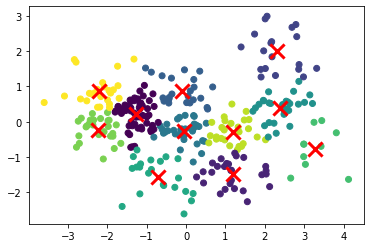

Num of Clusters: 12 Silhouette score: 0.3684122706559789
KMeans Clustering with 12-clusters: Silhouette score=0.3684, Calinski-Harabasz score=314.8373, Davies-Bouldin score=0.6696


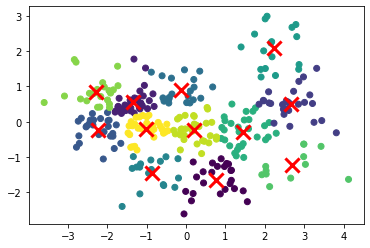

Num of Clusters: 13 Silhouette score: 0.35738804151136927
KMeans Clustering with 13-clusters: Silhouette score=0.3574, Calinski-Harabasz score=313.0259, Davies-Bouldin score=0.6696


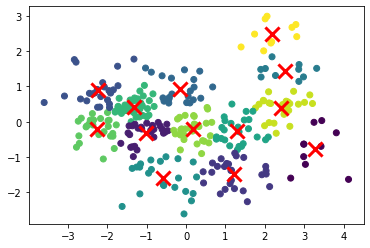

Num of Clusters: 14 Silhouette score: 0.36422038373696164
KMeans Clustering with 14-clusters: Silhouette score=0.3642, Calinski-Harabasz score=309.3987, Davies-Bouldin score=0.6696


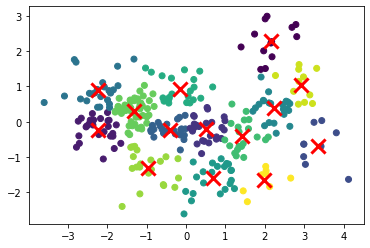

Num of Clusters: 15 Silhouette score: 0.3572715332645984
KMeans Clustering with 15-clusters: Silhouette score=0.3573, Calinski-Harabasz score=316.2596, Davies-Bouldin score=0.6696


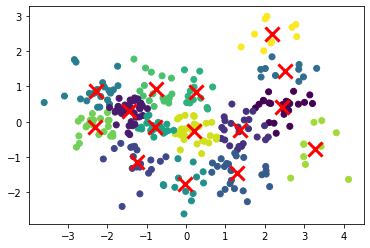

Num of Clusters: 16 Silhouette score: 0.3587571077501229
KMeans Clustering with 16-clusters: Silhouette score=0.3588, Calinski-Harabasz score=305.7293, Davies-Bouldin score=0.6696


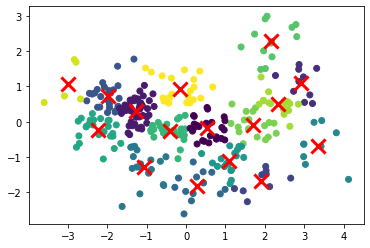

Num of Clusters: 17 Silhouette score: 0.36082603107471856
KMeans Clustering with 17-clusters: Silhouette score=0.3608, Calinski-Harabasz score=309.2297, Davies-Bouldin score=0.6696


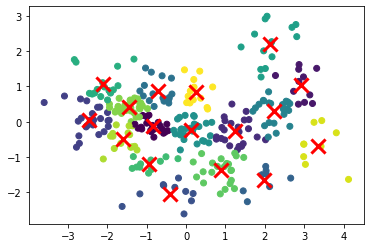

Num of Clusters: 18 Silhouette score: 0.3513437094136251
KMeans Clustering with 18-clusters: Silhouette score=0.3513, Calinski-Harabasz score=309.4392, Davies-Bouldin score=0.6696


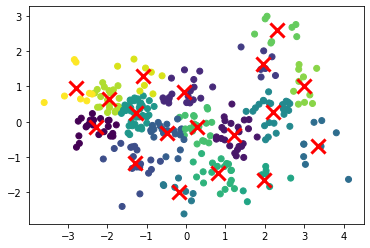

Num of Clusters: 19 Silhouette score: 0.3636037800444554
KMeans Clustering with 19-clusters: Silhouette score=0.3636, Calinski-Harabasz score=310.3177, Davies-Bouldin score=0.6696


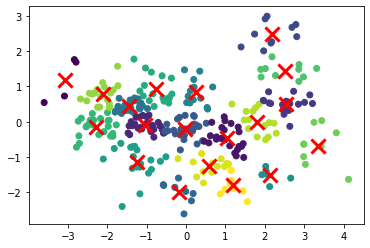

Num of Clusters: 20 Silhouette score: 0.3512937283942295
KMeans Clustering with 20-clusters: Silhouette score=0.3513, Calinski-Harabasz score=302.1358, Davies-Bouldin score=0.6696


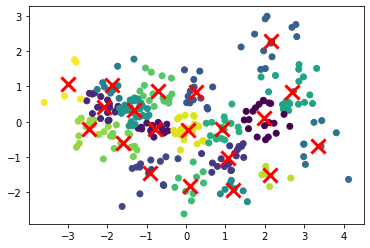

Num of Clusters: 21 Silhouette score: 0.3589906117879975
KMeans Clustering with 21-clusters: Silhouette score=0.3590, Calinski-Harabasz score=304.1793, Davies-Bouldin score=0.6696


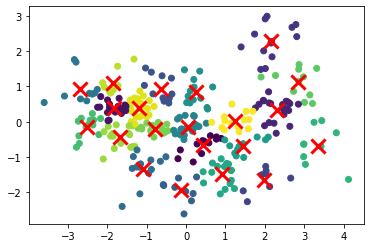

Num of Clusters: 22 Silhouette score: 0.35225837874385996
KMeans Clustering with 22-clusters: Silhouette score=0.3523, Calinski-Harabasz score=305.9099, Davies-Bouldin score=0.6696


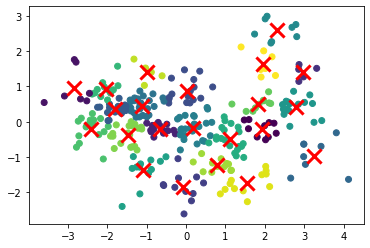

Num of Clusters: 23 Silhouette score: 0.36069298696020213
KMeans Clustering with 23-clusters: Silhouette score=0.3607, Calinski-Harabasz score=303.3777, Davies-Bouldin score=0.6696


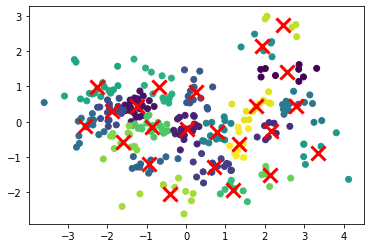

Num of Clusters: 24 Silhouette score: 0.3564229896083351
KMeans Clustering with 24-clusters: Silhouette score=0.3564, Calinski-Harabasz score=308.6173, Davies-Bouldin score=0.6696


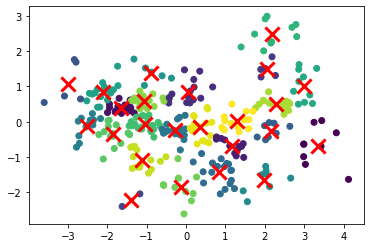

Num of Clusters: 25 Silhouette score: 0.3604917901874391
KMeans Clustering with 25-clusters: Silhouette score=0.3605, Calinski-Harabasz score=304.1686, Davies-Bouldin score=0.6696


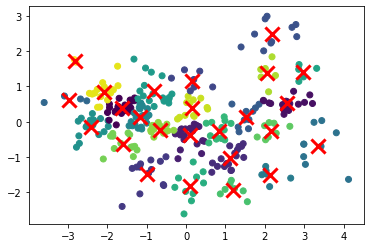

Num of Clusters: 26 Silhouette score: 0.3669643467083588
KMeans Clustering with 26-clusters: Silhouette score=0.3670, Calinski-Harabasz score=311.8724, Davies-Bouldin score=0.6696


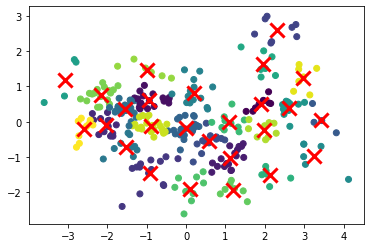

Num of Clusters: 27 Silhouette score: 0.36828784747386034
KMeans Clustering with 27-clusters: Silhouette score=0.3683, Calinski-Harabasz score=310.7225, Davies-Bouldin score=0.6696


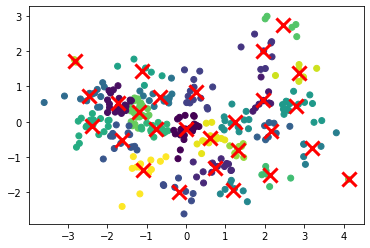

Num of Clusters: 28 Silhouette score: 0.3776620851418986
KMeans Clustering with 28-clusters: Silhouette score=0.3777, Calinski-Harabasz score=320.3170, Davies-Bouldin score=0.6696


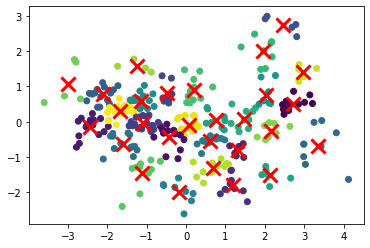

Num of Clusters: 29 Silhouette score: 0.3705328821275373
KMeans Clustering with 29-clusters: Silhouette score=0.3705, Calinski-Harabasz score=313.9241, Davies-Bouldin score=0.6696


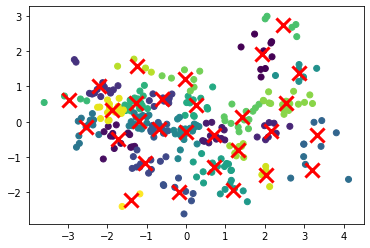

Num of Clusters: 30 Silhouette score: 0.3743636498084547
KMeans Clustering with 30-clusters: Silhouette score=0.3744, Calinski-Harabasz score=312.8759, Davies-Bouldin score=0.6696


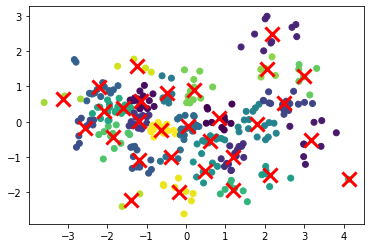

Num of Clusters: 31 Silhouette score: 0.3829272741482425
KMeans Clustering with 31-clusters: Silhouette score=0.3829, Calinski-Harabasz score=326.7845, Davies-Bouldin score=0.6696


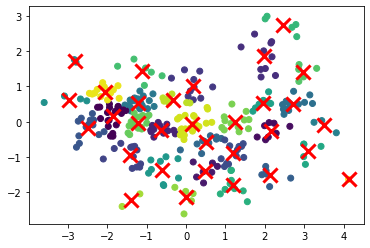

Num of Clusters: 32 Silhouette score: 0.3749805848209284
KMeans Clustering with 32-clusters: Silhouette score=0.3750, Calinski-Harabasz score=328.9519, Davies-Bouldin score=0.6696


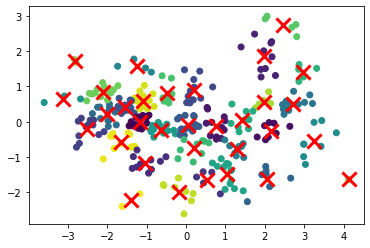

Num of Clusters: 33 Silhouette score: 0.3985726092424077
KMeans Clustering with 33-clusters: Silhouette score=0.3986, Calinski-Harabasz score=340.3552, Davies-Bouldin score=0.6696


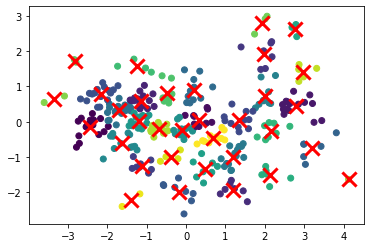

Num of Clusters: 34 Silhouette score: 0.4011534937307744
KMeans Clustering with 34-clusters: Silhouette score=0.4012, Calinski-Harabasz score=350.1170, Davies-Bouldin score=0.6696


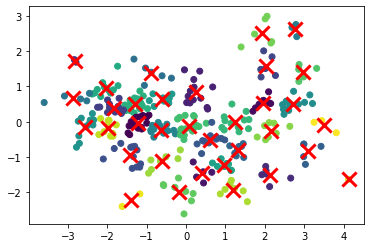

Num of Clusters: 35 Silhouette score: 0.38259395076136277
KMeans Clustering with 35-clusters: Silhouette score=0.3826, Calinski-Harabasz score=338.0493, Davies-Bouldin score=0.6696


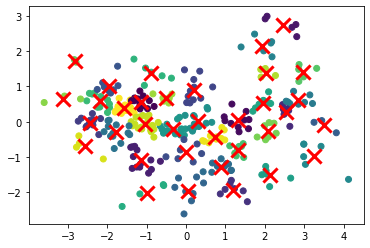

Num of Clusters: 36 Silhouette score: 0.3915428187918632
KMeans Clustering with 36-clusters: Silhouette score=0.3915, Calinski-Harabasz score=352.2820, Davies-Bouldin score=0.6696


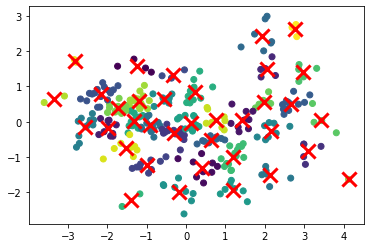

Num of Clusters: 37 Silhouette score: 0.400631638864216
KMeans Clustering with 37-clusters: Silhouette score=0.4006, Calinski-Harabasz score=357.1434, Davies-Bouldin score=0.6696


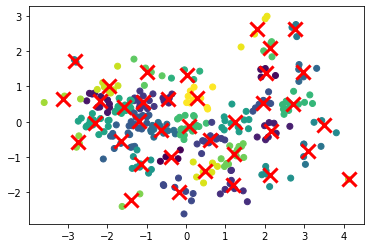

Num of Clusters: 38 Silhouette score: 0.409237352493474
KMeans Clustering with 38-clusters: Silhouette score=0.4092, Calinski-Harabasz score=363.9175, Davies-Bouldin score=0.6696


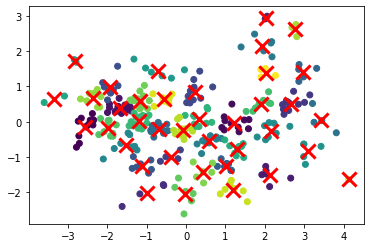

Num of Clusters: 39 Silhouette score: 0.40260607988266667
KMeans Clustering with 39-clusters: Silhouette score=0.4026, Calinski-Harabasz score=361.5389, Davies-Bouldin score=0.6696


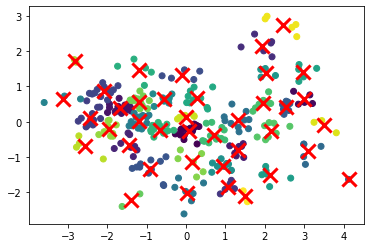

Num of Clusters: 40 Silhouette score: 0.3910354379424842
KMeans Clustering with 40-clusters: Silhouette score=0.3910, Calinski-Harabasz score=364.4987, Davies-Bouldin score=0.6696


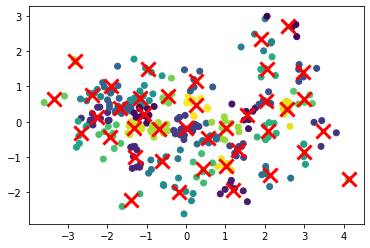

Num of Clusters: 41 Silhouette score: 0.4079687831670381
KMeans Clustering with 41-clusters: Silhouette score=0.4080, Calinski-Harabasz score=368.1065, Davies-Bouldin score=0.6696


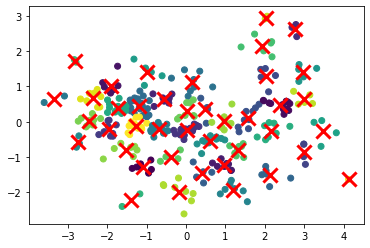

Num of Clusters: 42 Silhouette score: 0.4060377671329014
KMeans Clustering with 42-clusters: Silhouette score=0.4060, Calinski-Harabasz score=371.5350, Davies-Bouldin score=0.6696


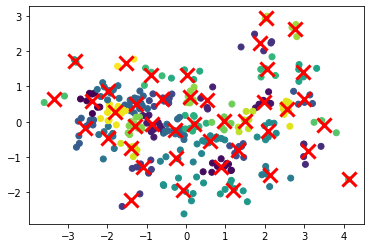

Num of Clusters: 43 Silhouette score: 0.4074147563106174
KMeans Clustering with 43-clusters: Silhouette score=0.4074, Calinski-Harabasz score=381.2527, Davies-Bouldin score=0.6696


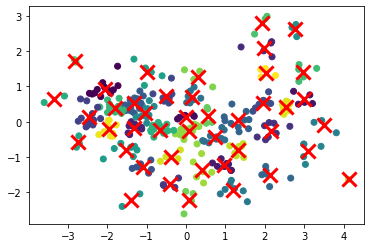

Num of Clusters: 44 Silhouette score: 0.4223707688345969
KMeans Clustering with 44-clusters: Silhouette score=0.4224, Calinski-Harabasz score=392.3097, Davies-Bouldin score=0.6696


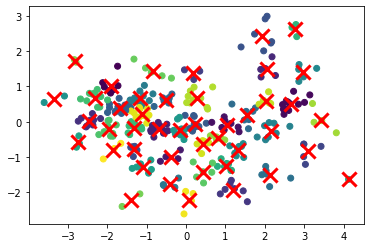

Num of Clusters: 45 Silhouette score: 0.40471277781522347
KMeans Clustering with 45-clusters: Silhouette score=0.4047, Calinski-Harabasz score=388.8117, Davies-Bouldin score=0.6696


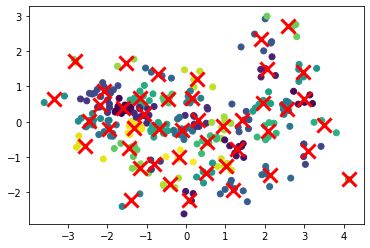

Num of Clusters: 46 Silhouette score: 0.4165989936852288
KMeans Clustering with 46-clusters: Silhouette score=0.4166, Calinski-Harabasz score=392.7862, Davies-Bouldin score=0.6696


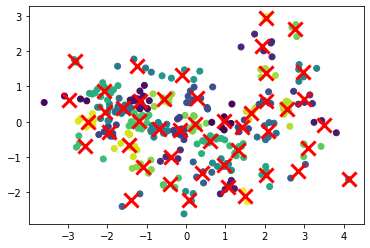

Num of Clusters: 47 Silhouette score: 0.40793331650039694
KMeans Clustering with 47-clusters: Silhouette score=0.4079, Calinski-Harabasz score=395.4947, Davies-Bouldin score=0.6696


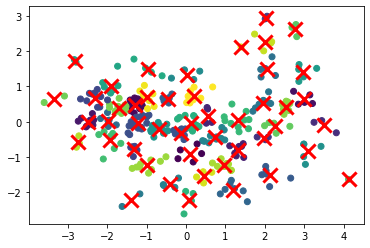

Num of Clusters: 48 Silhouette score: 0.41109941655525695
KMeans Clustering with 48-clusters: Silhouette score=0.4111, Calinski-Harabasz score=405.6766, Davies-Bouldin score=0.6696


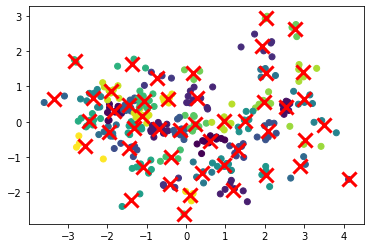

Num of Clusters: 49 Silhouette score: 0.4138091340120234
KMeans Clustering with 49-clusters: Silhouette score=0.4138, Calinski-Harabasz score=405.1635, Davies-Bouldin score=0.6696


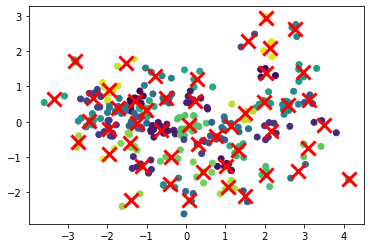

Num of Clusters: 50 Silhouette score: 0.40417039384129577
KMeans Clustering with 50-clusters: Silhouette score=0.4042, Calinski-Harabasz score=398.1166, Davies-Bouldin score=0.6696


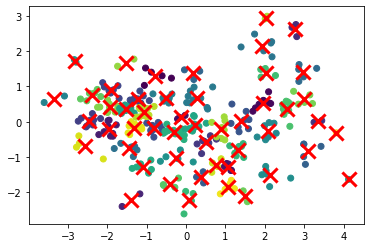

In [780]:
for cnt in range(2,51):
    km = KMeans(n_clusters=cnt, random_state=0)
    km.fit(X)
    km.labels_
    score = silhouette_score(X, km.labels_)
    print("Num of Clusters:", cnt, "Silhouette score:", score)
    score1 = silhouette_score(X, km.labels_)
#     print(score1)
    score2 = calinski_harabasz_score(X, km.labels_)
    score3 = davies_bouldin_score(X, labels_complete)
    print(f'KMeans Clustering with {cnt:.0f}-clusters: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
    # cluster_size = {}
#     pca = PCA(n_components=2)
#     X_pca = pca.fit_transform(X)
#     plt.scatter(X_pca[:, 0], X_pca[:, 1], c=km.labels_)
#     plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], marker='x', s=200, linewidths=3, color='r')
#     plt.show()
    plt.scatter(X[:, 0], X[:, 1], c=km.labels_)
    plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], marker='x', s=200, linewidths=3, color='r')
    graph_name = 'Kmeans_Cluster_Result_Plot'+str(score1)+'_'+str(cnt)
    plt.savefig('hierachical_structures_dendrogram/KMeans/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)
    plt.show()


In [659]:
print(X)

[[-1.44344043e-01 -7.96902486e-01  1.52385077e+00]
 [-2.21137914e+00 -3.63178493e-01  4.33420939e-01]
 [ 4.21006259e-01 -5.34189849e-01  8.67032510e-01]
 [ 4.62964114e-01 -5.52647602e-01  1.33607781e+00]
 [-1.33628246e+00 -9.85419895e-01  3.86862203e-01]
 [-2.31503047e+00  8.14229380e-01  2.76067636e-02]
 [-9.93850542e-01  1.42131344e-01  1.59169155e-01]
 [-1.85768391e+00 -3.29103114e-01  1.82298921e-01]
 [-1.44061775e+00  4.65617757e-01 -1.36702928e-01]
 [-1.62032259e+00 -2.39624832e+00  1.15056449e+00]
 [-1.40154378e+00 -7.22760019e-01  6.46283538e-01]
 [-3.08216285e+00  7.28498861e-01  1.19897200e+00]
 [-1.17108329e+00  5.21839339e-01  6.36792593e-01]
 [-9.95219073e-01 -3.86104471e-02  1.07537173e+00]
 [-4.37528252e-01  5.30039350e-01  8.42994804e-01]
 [-1.65240415e+00  2.87249058e-01 -8.21296289e-02]
 [ 1.85923378e-01 -1.90566201e-01  4.46130835e-01]
 [-2.65581011e+00  1.02300382e-01 -8.05674785e-01]
 [-2.18613562e+00  4.17132331e-01  2.55959754e-01]
 [-1.97166752e+00 -1.32058468e-

In [795]:
data_scaled = X_new
print(np.array(X_new).shape)
methods = ['single', 'complete', 'average']
for i in range(5):
    for j in range(i + 1, 6):
        data_scaled = X_new[:,[i,j]]
        for method in methods:
            linked = linkage(data_scaled, method=method)
        #     labels = pd.DataFrame(linked).iloc[:, :2].values
        #     print(labels)
            labels = fcluster(linked, t=3, criterion='maxclust')

        #     print(labels)
            score1 = silhouette_score(data_scaled, labels)
        #     print(score1)
            score2 = calinski_harabasz_score(data_scaled, labels)
            score3 = davies_bouldin_score(data_scaled, labels)
            print(f'{data.columns[i]} and {data.columns[j]}:{method} linkage: Silhouette score={score1:.4f}, Calinski-Harabasz score={score2:.4f}, Davies-Bouldin score={score3:.4f}')
            # cluster_size = {}
            unique_labels, counts = np.unique(labels, return_counts=True)

            for label, count in zip(unique_labels, counts):
                print(f"Cluster {label} has size {count}")


#             plt.rcParams.update({'font.size': 12})
#             plt.figure(figsize=(30,10))
#             dendrogram(linked)
#             fig = plt.gcf()
#             fig.set_dpi(300)
#             plt.title(f'{method}_linkage_{data.columns[i]}_{data.columns[j]}')
#             graph_name = f'{method}_linkage_{data.columns[i]}_{data.columns[j]}'
#             plt.savefig('features_dendrogram/{}.jpg'.format(graph_name),bbox_inches='tight',dpi=300)            

#             plt.show()


(298, 6)
pelvic_incidence and pelvic_tilt:single linkage: Silhouette score=0.1072, Calinski-Harabasz score=8.1804, Davies-Bouldin score=0.5922
Cluster 1 has size 4
Cluster 2 has size 293
Cluster 3 has size 1
pelvic_incidence and pelvic_tilt:complete linkage: Silhouette score=0.3438, Calinski-Harabasz score=303.1512, Davies-Bouldin score=0.8858
Cluster 1 has size 62
Cluster 2 has size 78
Cluster 3 has size 158
pelvic_incidence and pelvic_tilt:average linkage: Silhouette score=0.2789, Calinski-Harabasz score=128.9128, Davies-Bouldin score=0.7062
Cluster 1 has size 45
Cluster 2 has size 6
Cluster 3 has size 247
pelvic_incidence and lumbar_lordosis_angle:single linkage: Silhouette score=-0.0027, Calinski-Harabasz score=1.7346, Davies-Bouldin score=0.8935
Cluster 1 has size 2
Cluster 2 has size 295
Cluster 3 has size 1
pelvic_incidence and lumbar_lordosis_angle:complete linkage: Silhouette score=0.3941, Calinski-Harabasz score=377.8352, Davies-Bouldin score=0.7556
Cluster 1 has size 103
Clu

sacral_slope and degree_spondylolisthesis:complete linkage: Silhouette score=0.4219, Calinski-Harabasz score=227.5041, Davies-Bouldin score=0.8762
Cluster 1 has size 201
Cluster 2 has size 45
Cluster 3 has size 52
sacral_slope and degree_spondylolisthesis:average linkage: Silhouette score=0.4663, Calinski-Harabasz score=251.9780, Davies-Bouldin score=0.8190
Cluster 1 has size 185
Cluster 2 has size 17
Cluster 3 has size 96
pelvic_radius and degree_spondylolisthesis:single linkage: Silhouette score=0.3098, Calinski-Harabasz score=5.3616, Davies-Bouldin score=0.3830
Cluster 1 has size 296
Cluster 2 has size 1
Cluster 3 has size 1
pelvic_radius and degree_spondylolisthesis:complete linkage: Silhouette score=0.3602, Calinski-Harabasz score=115.2681, Davies-Bouldin score=0.7765
Cluster 1 has size 43
Cluster 2 has size 13
Cluster 3 has size 242
pelvic_radius and degree_spondylolisthesis:average linkage: Silhouette score=0.3572, Calinski-Harabasz score=24.6785, Davies-Bouldin score=0.5683
Clu